In [1]:
"""
XGBoost runner (univariate + multivariate):
- Loads each satellite's orbital elements and manoeuvre timestamps
- Univariate: per-feature lagged XGB forecasting, residual-based PR sweep (±3/±5)
- Multivariate: lagged XGB with 3 inputs -> 1 target, same PR sweep
- Saves forecasts, residuals, training curves, and PR logs under ../images/xgb and ../xgb_logs
"""

import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
from xgboost import XGBRegressor

# Utilities
sys.path.append("../utils")
import forecasting_xgb_tools as fxt

# GLOBAL RANDOM SEED 
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

# Global styling
plt.rcParams.update({
    'font.family': 'Times New Roman',
    'font.size': 16,
    'axes.titlesize': 16,
    'axes.labelsize': 15,
    'xtick.labelsize': 15,
    'ytick.labelsize': 15,
    'legend.fontsize': 15
})

# Parameters
features_to_forecast = ["Brouwer mean motion", "mean anomaly", "eccentricity"]
# Multivariate forecasting targets (with 3 inputs → 1 target)
multivariate_targets = ["Brouwer mean motion","mean anomaly", "eccentricity" ]

NUM_LAGS = 3
IQR_FACTOR = 5
MATCHING_DAYS_LIST = [3, 5]

# Output locations
output_root = "../images/xgb"
forecast_dir = os.path.join(output_root, "forecasts")
residual_dir = os.path.join(output_root, "residuals")
curve_dir = os.path.join(output_root, "training_curves")
log_dir = "../xgb_logs"
os.makedirs(forecast_dir, exist_ok=True)
os.makedirs(residual_dir, exist_ok=True)
os.makedirs(curve_dir, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)

hyperparam_grid = [
    {'max_depth': 2, 'learning_rate': 0.1, 'n_estimators': 100,
     'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': SEED},

    {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100,
     'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': SEED},

    {'max_depth': 2, 'learning_rate': 0.05, 'n_estimators': 200,
     'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': SEED},

    {'max_depth': 3, 'learning_rate': 0.05, 'n_estimators': 200,
     'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': SEED},

    {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300,
     'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': SEED},

    {'max_depth': 3, 'learning_rate': 0.05, 'n_estimators': 200,
     'colsample_bytree': 0.8, 'subsample': 0.8, 'random_state': SEED},

    {'max_depth': 3, 'learning_rate': 0.03, 'n_estimators': 350,
     'colsample_bytree': 0.8, 'subsample': 0.8, 'random_state': SEED},

    {'max_depth': 4, 'learning_rate': 0.03, 'n_estimators': 400,
     'colsample_bytree': 0.7, 'subsample': 0.8, 'random_state': SEED},
]



satellites = [
    {
        "name": "Sentinel-3A",
        "csv_path": "../satellite_data/orbital_elements/Sentinel-3A.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_s3aman.csv",
        "date_range": ("2021-01-01", "2021-06-30")
    },
    {
        "name": "Fengyun-2F",
        "csv_path": "../satellite_data/orbital_elements/Fengyun-2F.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_manFY2F.csv",
        "date_range": ("2021-01-01", "2021-06-30")
    },
    {
        "name": "Fengyun-4A",
        "csv_path": "../satellite_data/orbital_elements/Fengyun-4A.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_manFY4A.csv",
        "date_range": ("2020-01-01", "2020-06-30")
    },
    {
        "name": "SARAL",
        "csv_path": "../satellite_data/orbital_elements/SARAL.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_srlman.csv",
        "date_range": ("2015-01-01", "2015-06-30")
    },
    {
        "name": "Haiyang-2A",
        "csv_path": "../satellite_data/orbital_elements/Haiyang-2A.csv",
        "maneuver_csv": "../satellite_data/cleaned_man/cleaned_man_h2aman.csv",
        "date_range": ("2018-01-01", "2018-06-30")
    }
]




=== Sentinel-3A | Brouwer mean motion ===
Rescaled Brouwer mean motion ×1e6
Raw | Best params: {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 31


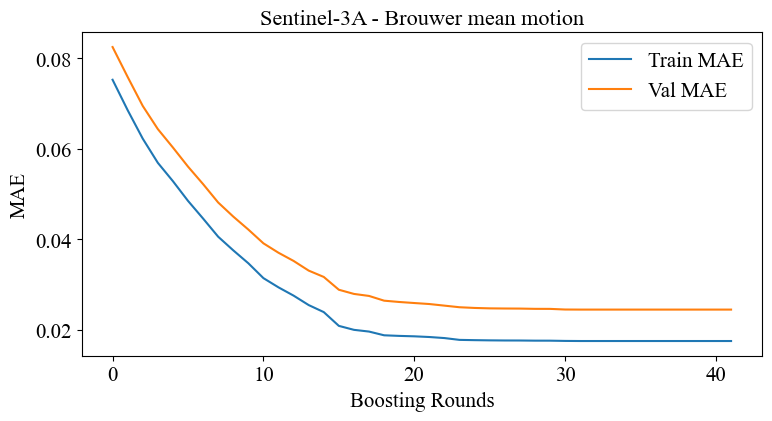

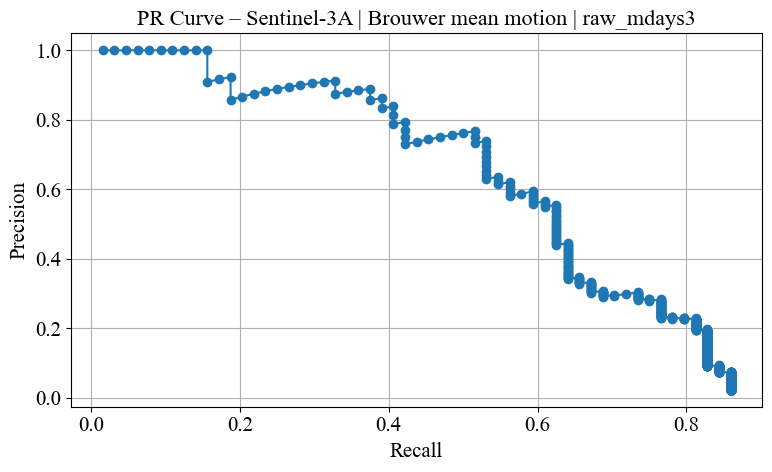

[RAW] | mdays=3 | Threshold=0.0519 | P=0.56 | R=0.62 | F1=0.59 | F2=0.61
[RAW] TP=40, FP=32, FN=24


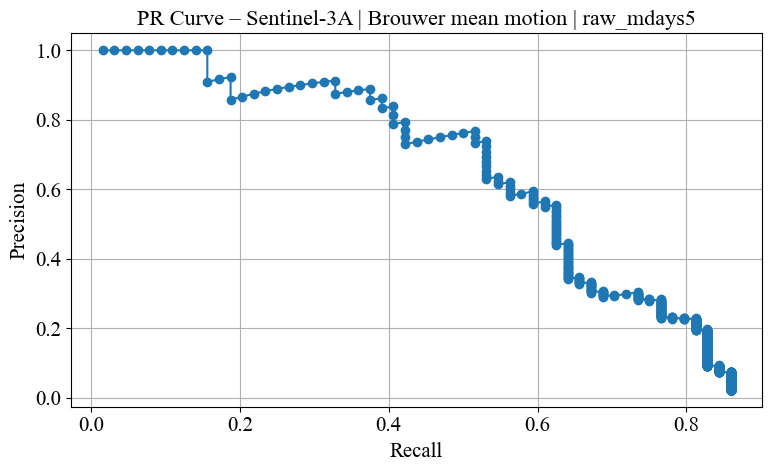

[RAW] | mdays=5 | Threshold=0.0519 | P=0.56 | R=0.62 | F1=0.59 | F2=0.61
[RAW] TP=40, FP=32, FN=24

 [RAW] Using BEST mdays = ±3 for anomaly detection (F2 = 0.61)


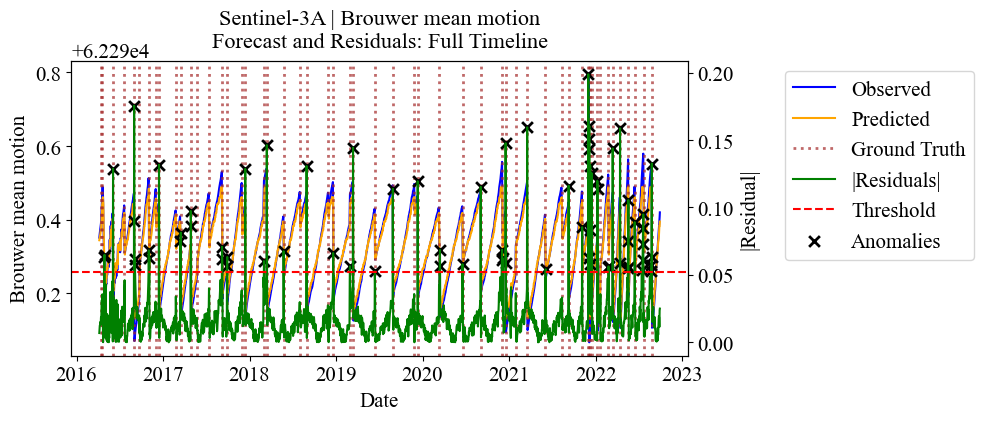

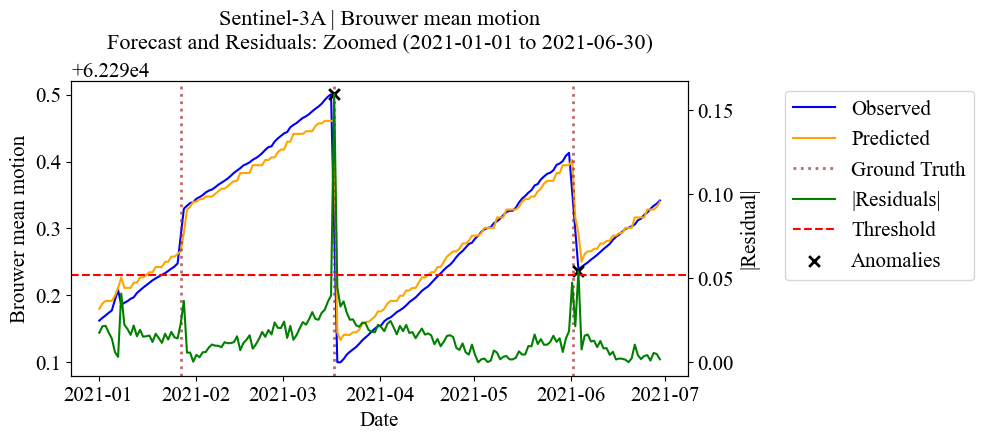

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
Skipping Sentinel-3A - Brouwer mean motion - cleaned (no outliers detected)

=== Sentinel-3A | mean anomaly ===
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 187


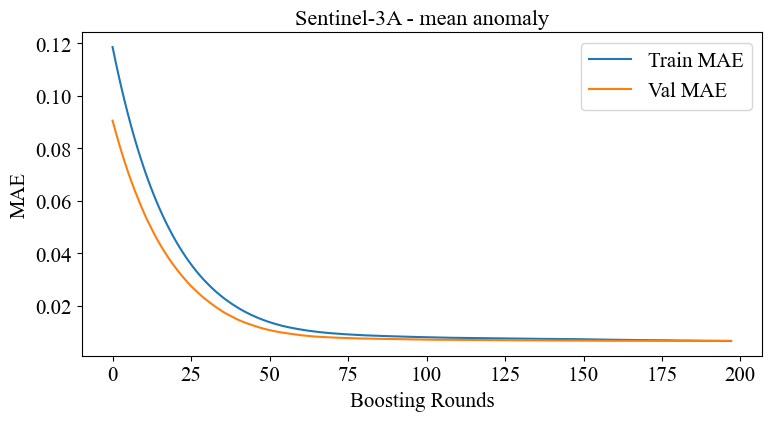

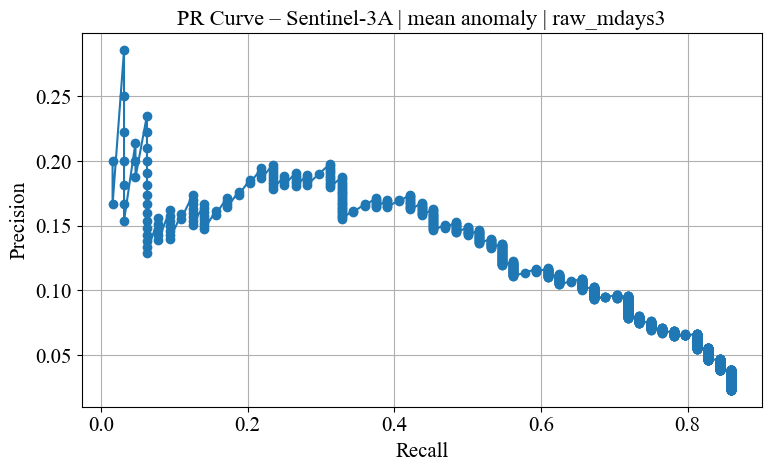

[RAW] | mdays=3 | Threshold=0.0122 | P=0.15 | R=0.52 | F1=0.23 | F2=0.34
[RAW] TP=33, FP=192, FN=31


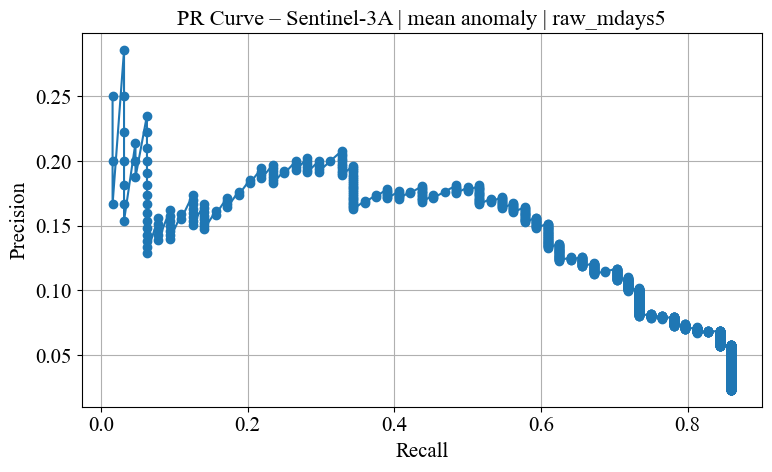

[RAW] | mdays=5 | Threshold=0.0122 | P=0.16 | R=0.58 | F1=0.26 | F2=0.38
[RAW] TP=37, FP=188, FN=27

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.38)


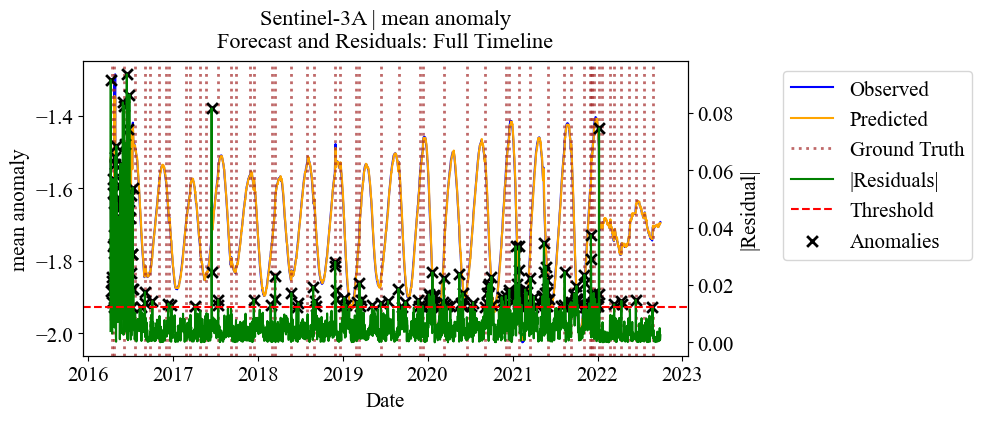

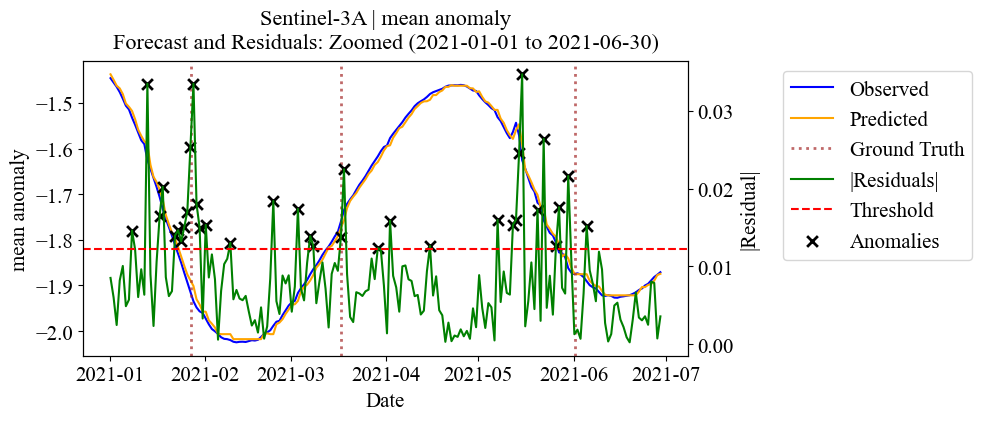

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
Skipping Sentinel-3A - mean anomaly - cleaned (no outliers detected)

=== Sentinel-3A | eccentricity ===
Rescaled eccentricity ×1e6
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 120


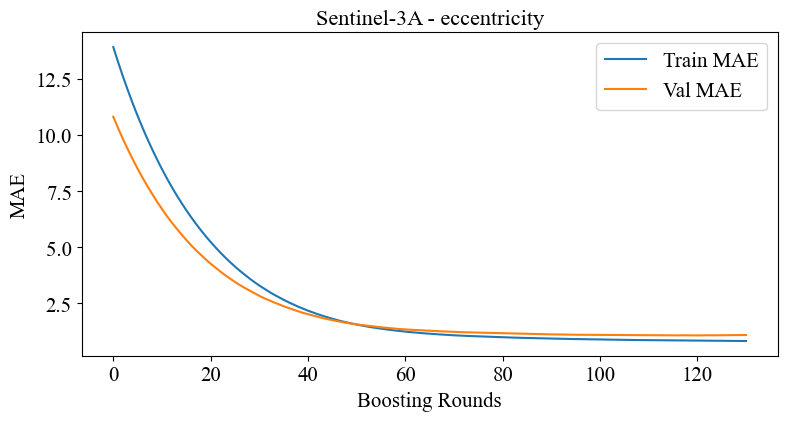

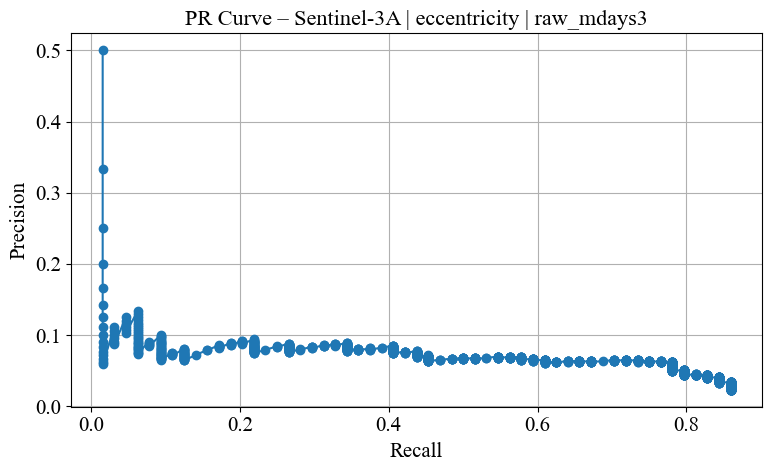

[RAW] | mdays=3 | Threshold=0.9079 | P=0.07 | R=0.73 | F1=0.12 | F2=0.24
[RAW] TP=47, FP=676, FN=17


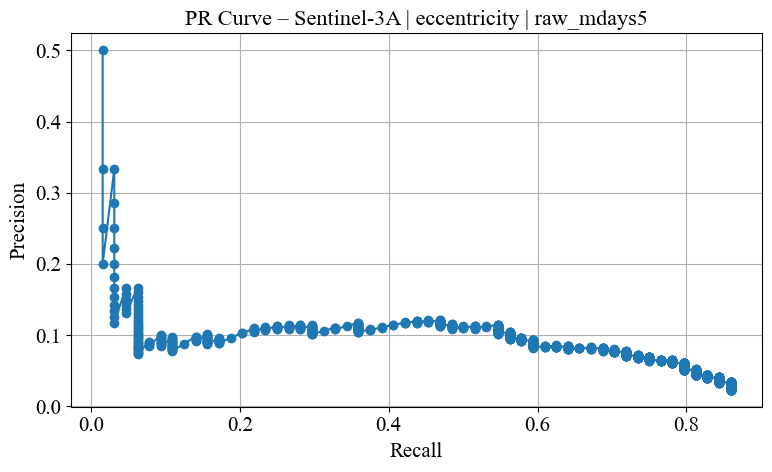

[RAW] | mdays=5 | Threshold=1.3515 | P=0.11 | R=0.55 | F1=0.19 | F2=0.31
[RAW] TP=35, FP=270, FN=29

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.31)


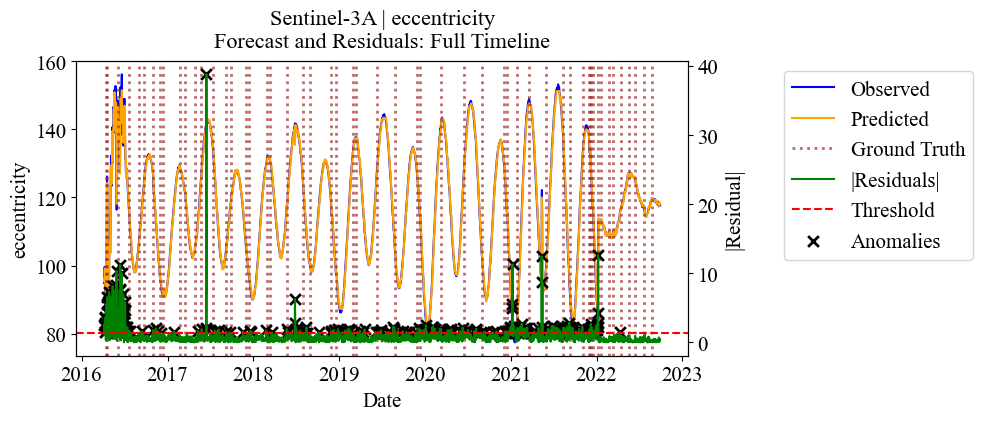

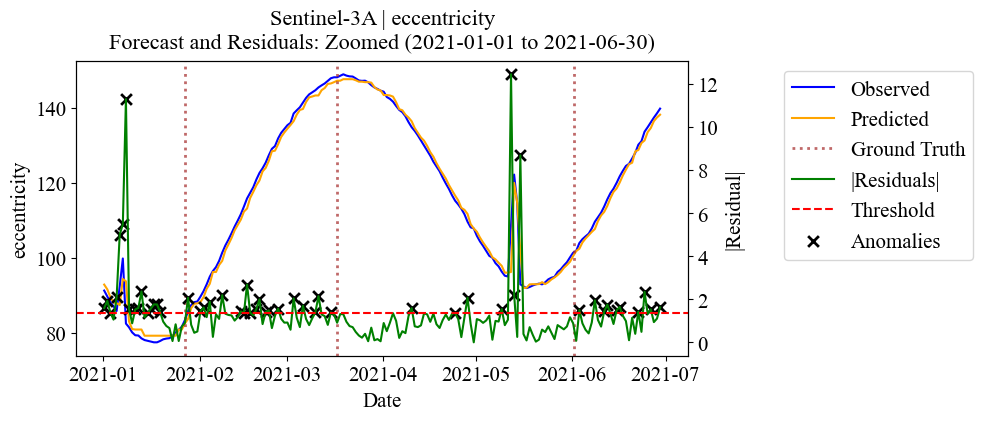

eccentricity: 0 outliers flagged
Total interpolated outliers: 0
Skipping Sentinel-3A - eccentricity - cleaned (no outliers detected)

=== Fengyun-2F | Brouwer mean motion ===
Rescaled Brouwer mean motion ×1e6
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 150


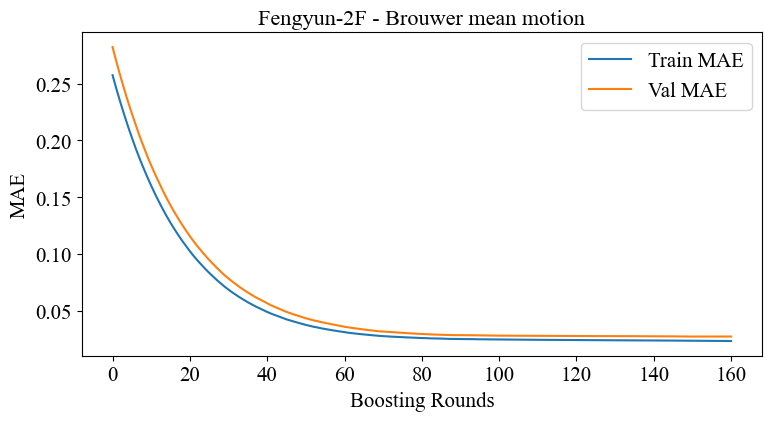

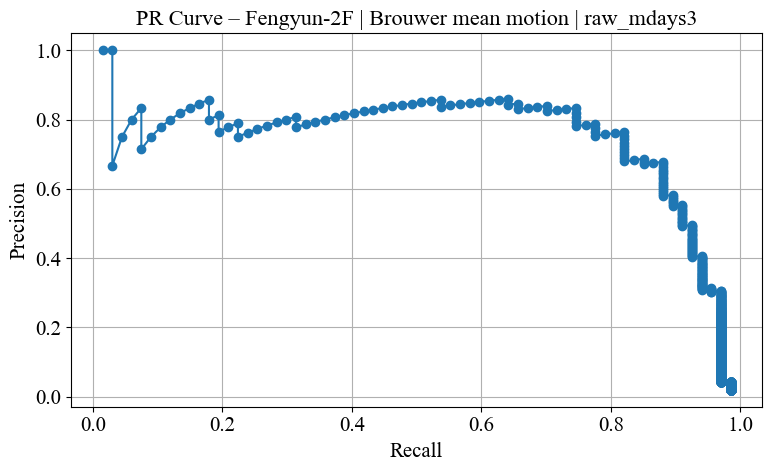

[RAW] | mdays=3 | Threshold=0.1426 | P=0.68 | R=0.88 | F1=0.77 | F2=0.83
[RAW] TP=59, FP=28, FN=8


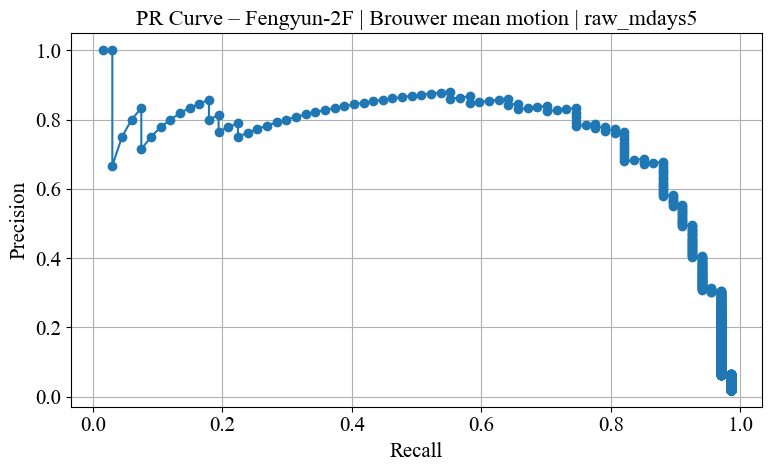

[RAW] | mdays=5 | Threshold=0.1426 | P=0.68 | R=0.88 | F1=0.77 | F2=0.83
[RAW] TP=59, FP=28, FN=8

 [RAW] Using BEST mdays = ±3 for anomaly detection (F2 = 0.83)


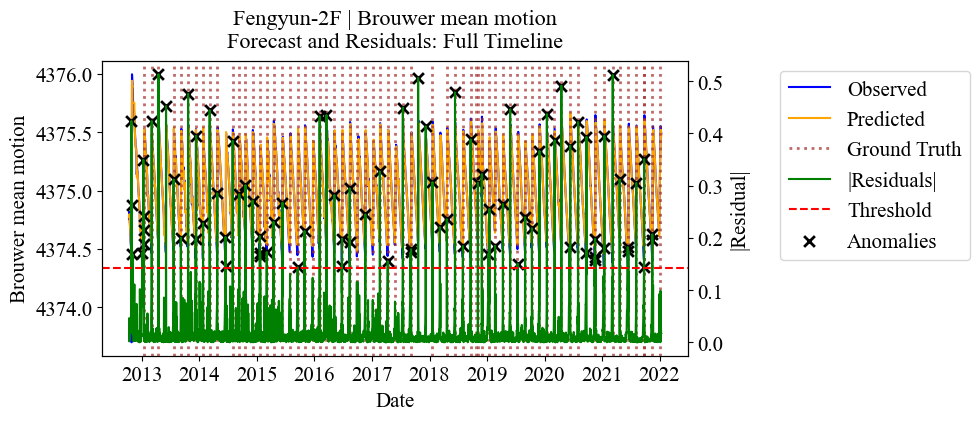

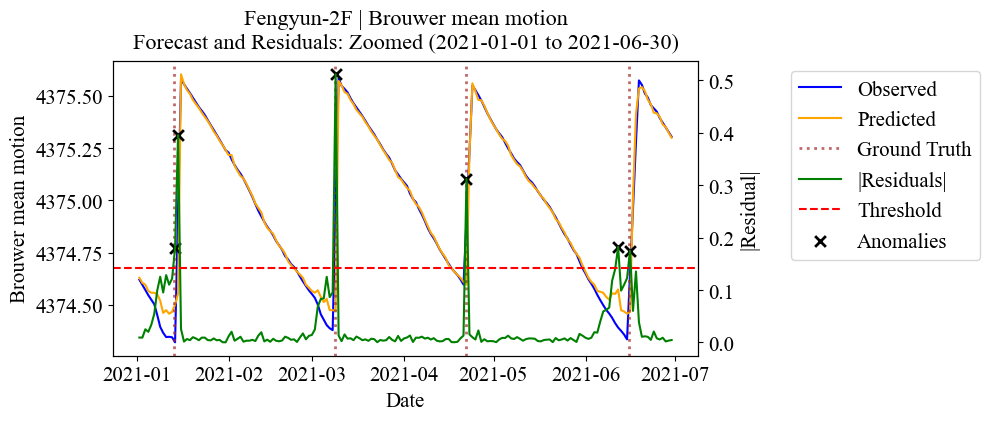

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
Skipping Fengyun-2F - Brouwer mean motion - cleaned (no outliers detected)

=== Fengyun-2F | mean anomaly ===
Raw | Best params: {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 91


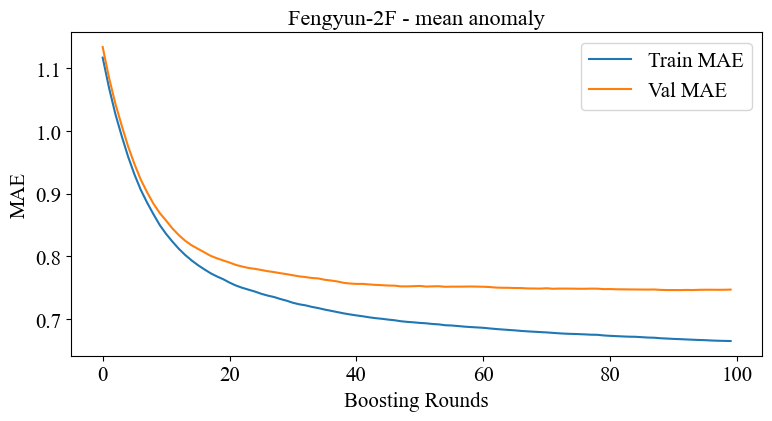

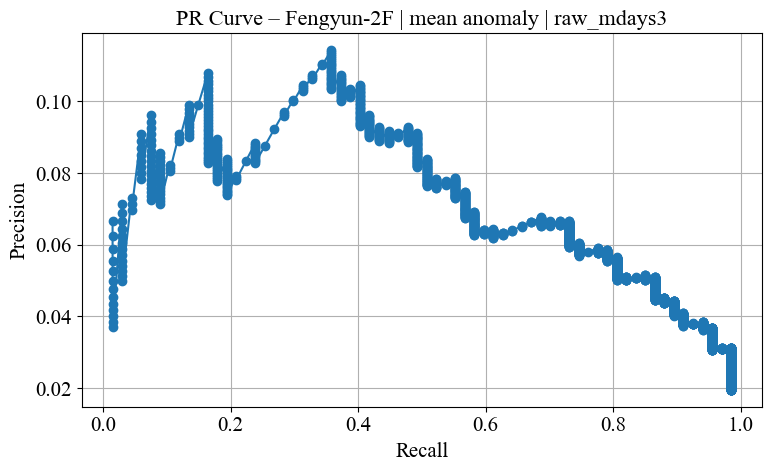

[RAW] | mdays=3 | Threshold=1.3600 | P=0.09 | R=0.49 | F1=0.15 | F2=0.26
[RAW] TP=33, FP=329, FN=34


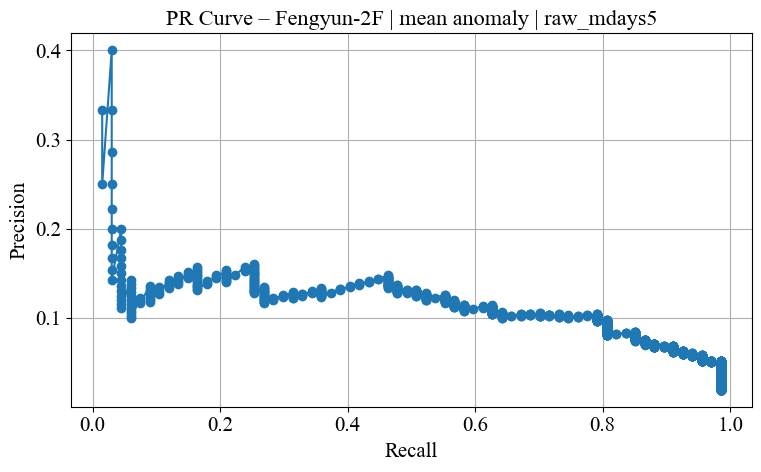

[RAW] | mdays=5 | Threshold=1.2042 | P=0.10 | R=0.79 | F1=0.18 | F2=0.34
[RAW] TP=53, FP=455, FN=14

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.34)


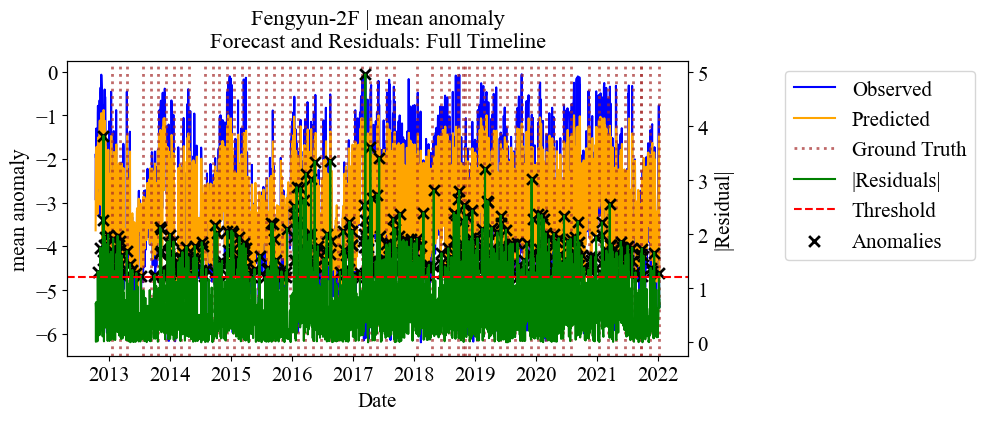

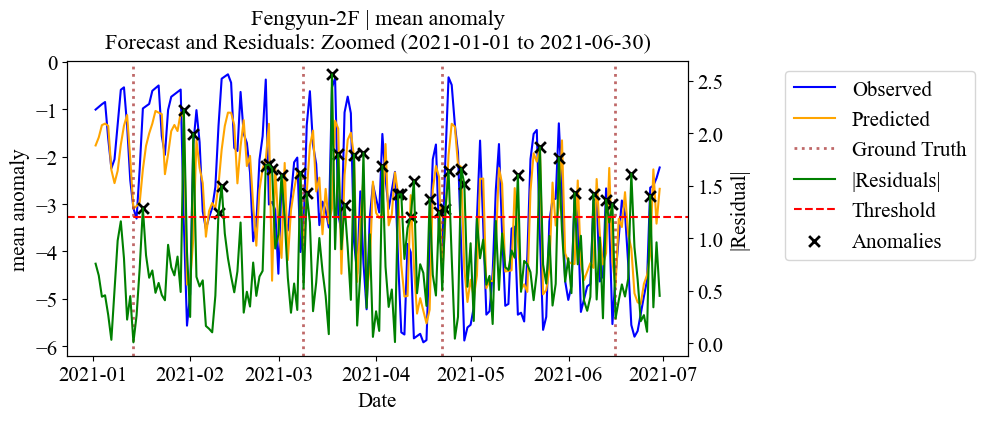

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
Skipping Fengyun-2F - mean anomaly - cleaned (no outliers detected)

=== Fengyun-2F | eccentricity ===
Rescaled eccentricity ×1e6
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 169


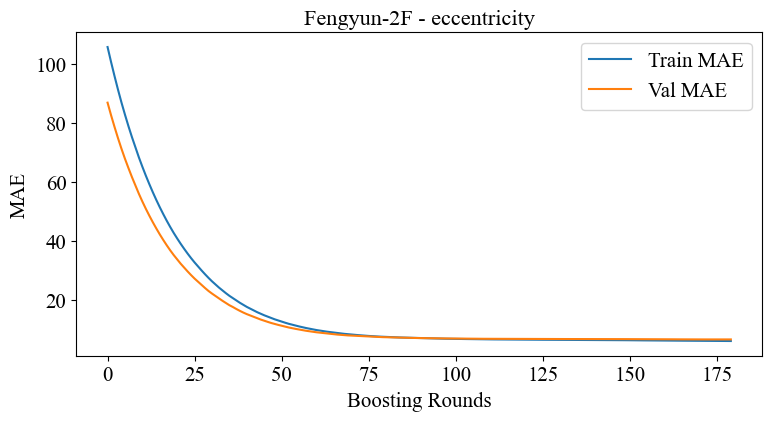

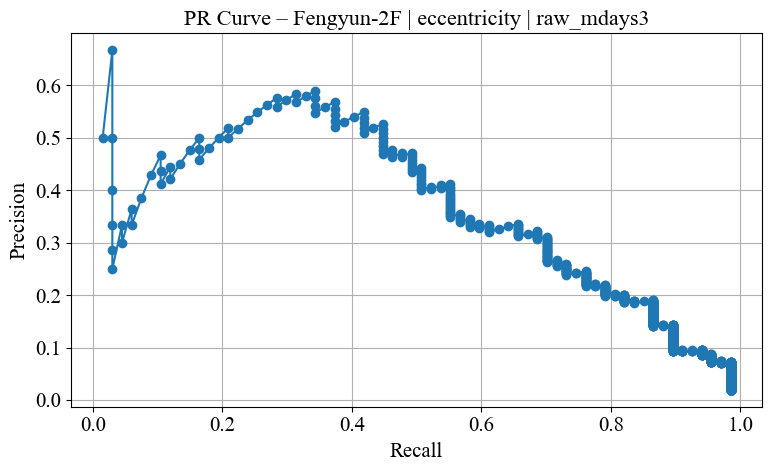

[RAW] | mdays=3 | Threshold=20.3851 | P=0.31 | R=0.70 | F1=0.43 | F2=0.56
[RAW] TP=47, FP=104, FN=20


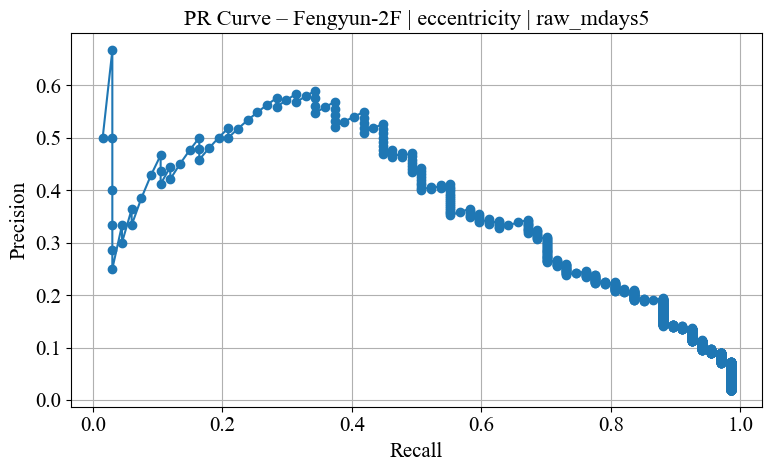

[RAW] | mdays=5 | Threshold=22.6280 | P=0.34 | R=0.67 | F1=0.45 | F2=0.56
[RAW] TP=45, FP=86, FN=22

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.56)


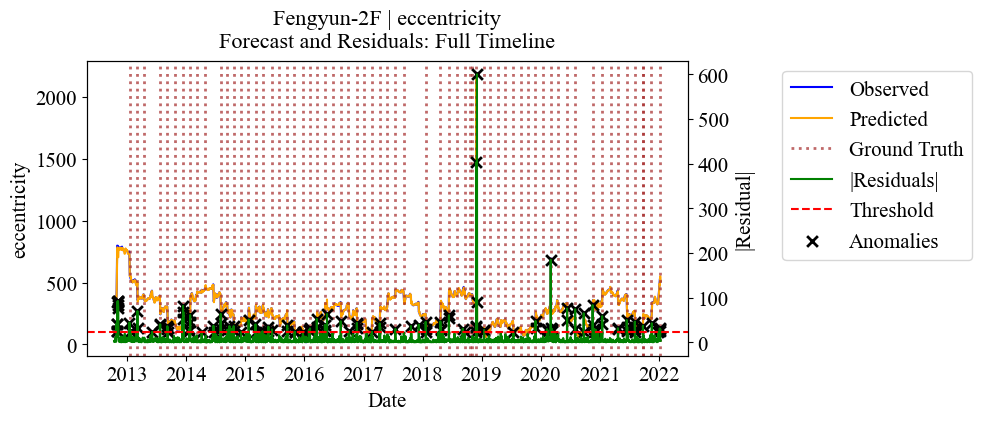

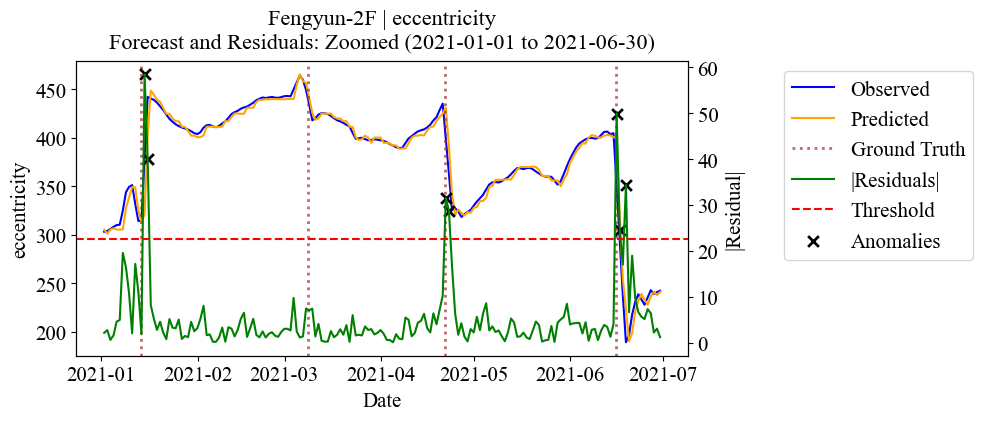

eccentricity: 3 outliers flagged
Total interpolated outliers: 3
Cleaned | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 159


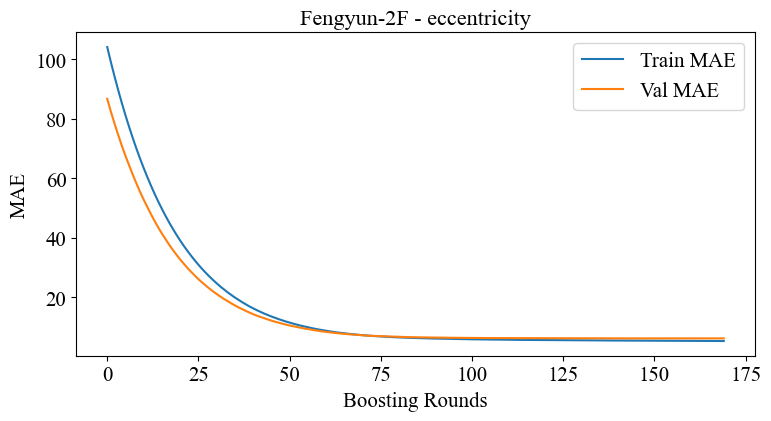

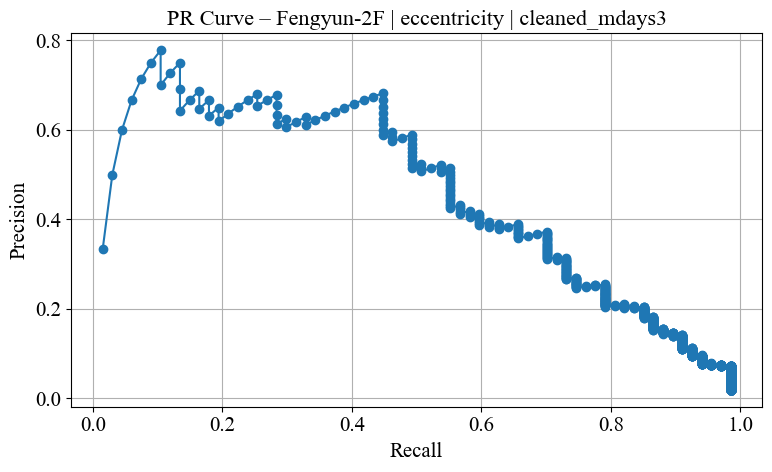

[CLEANED] | mdays=3 | Threshold=20.0662 | P=0.37 | R=0.70 | F1=0.49 | F2=0.60
[CLEANED] TP=47, FP=79, FN=20


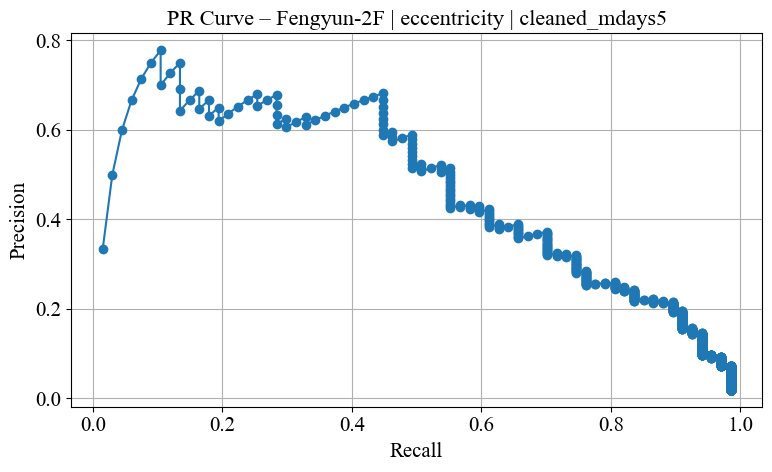

[CLEANED] | mdays=5 | Threshold=20.0662 | P=0.37 | R=0.70 | F1=0.49 | F2=0.60
[CLEANED] TP=47, FP=79, FN=20

 [CLEANED] Using BEST mdays = ±3 for anomaly detection (F2 = 0.60)


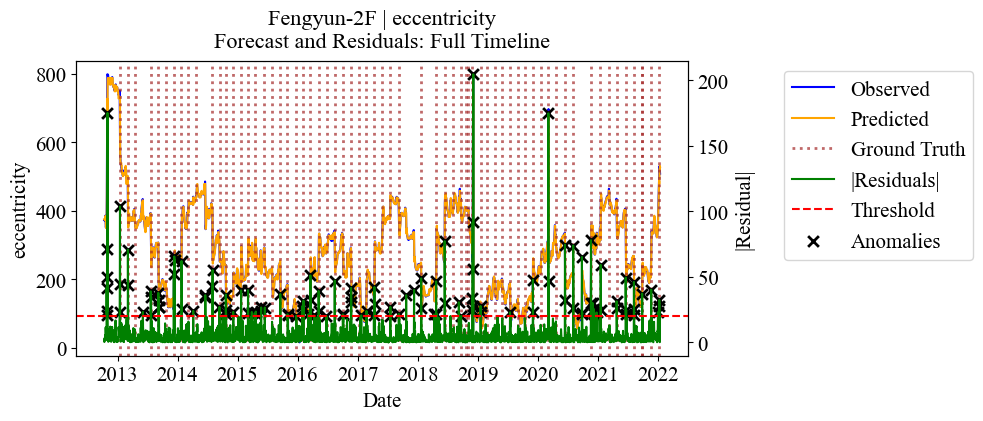

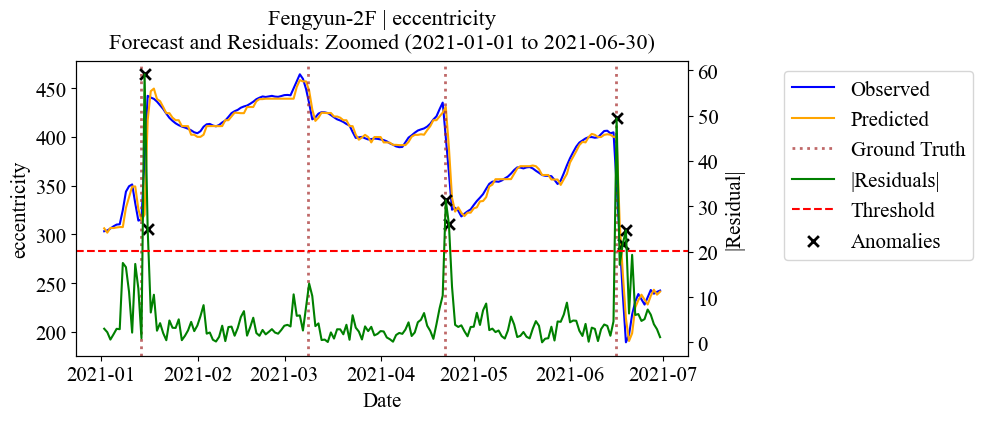


=== Fengyun-4A | Brouwer mean motion ===
Rescaled Brouwer mean motion ×1e6
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 82


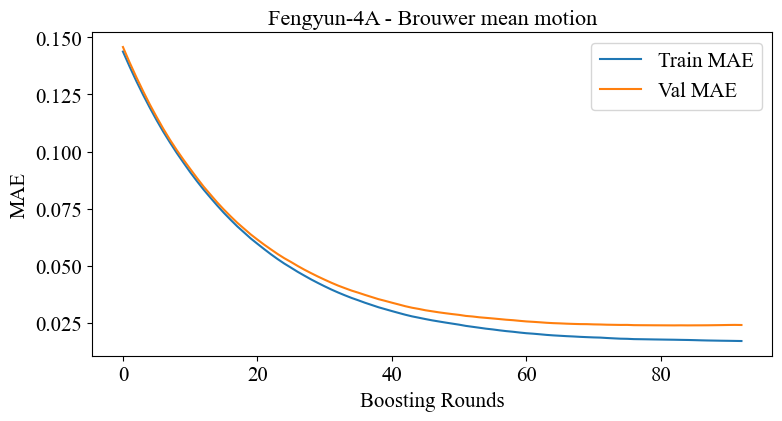

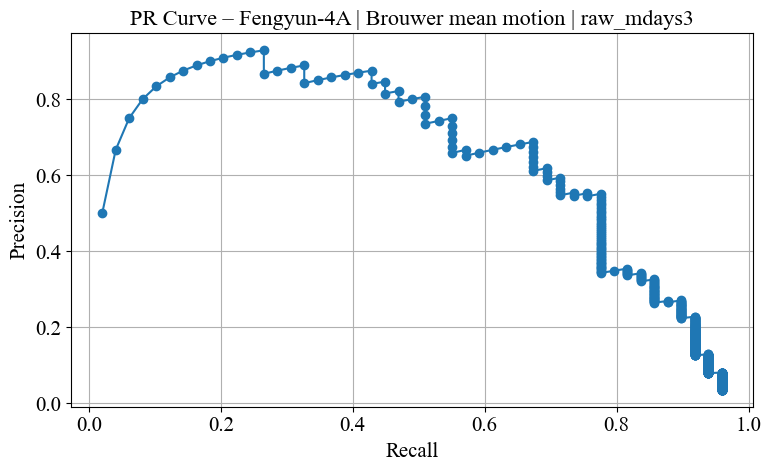

[RAW] | mdays=3 | Threshold=0.0700 | P=0.55 | R=0.78 | F1=0.64 | F2=0.72
[RAW] TP=38, FP=31, FN=11


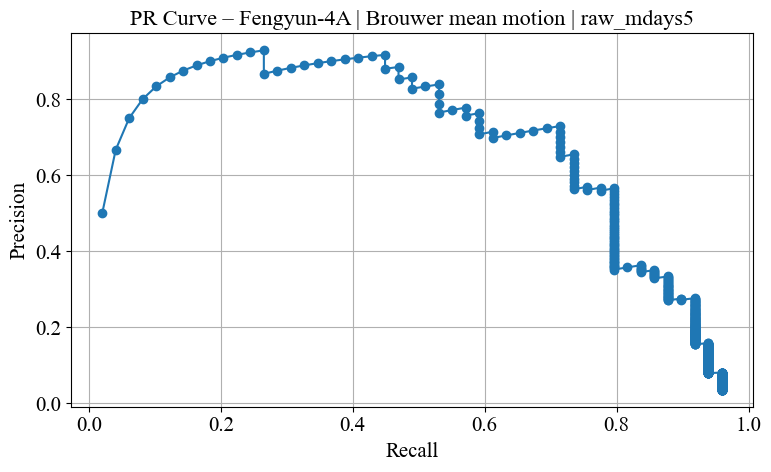

[RAW] | mdays=5 | Threshold=0.0700 | P=0.57 | R=0.80 | F1=0.66 | F2=0.74
[RAW] TP=39, FP=30, FN=10

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.74)


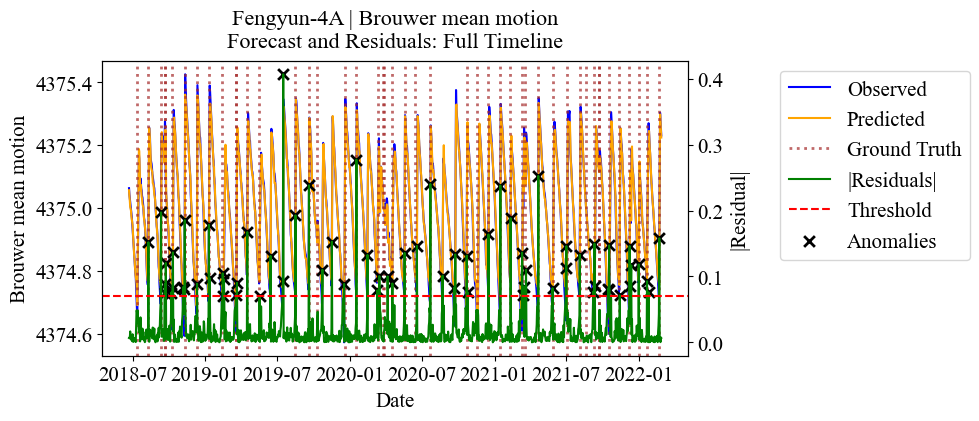

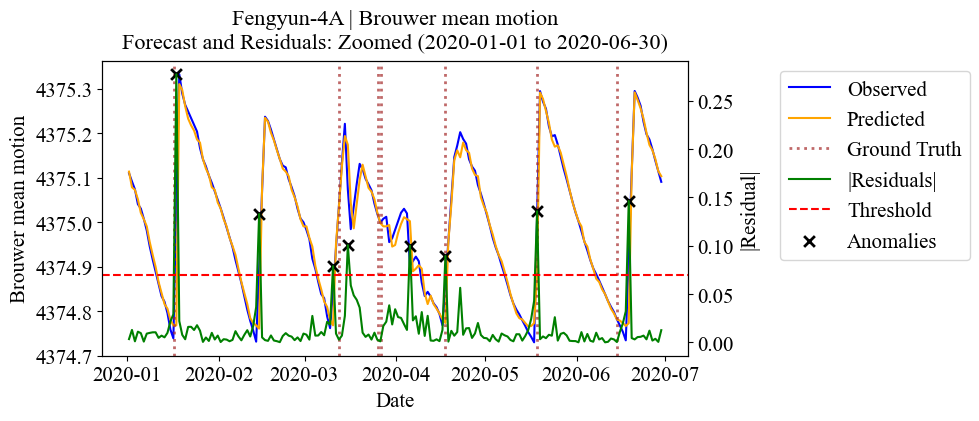

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
Skipping Fengyun-4A - Brouwer mean motion - cleaned (no outliers detected)

=== Fengyun-4A | mean anomaly ===
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 82


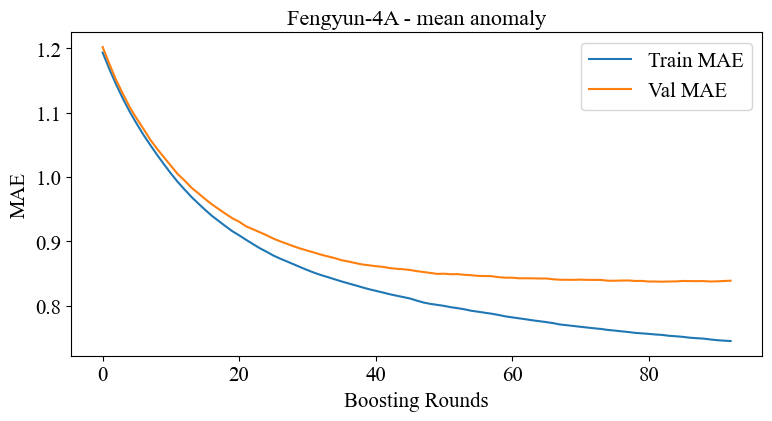

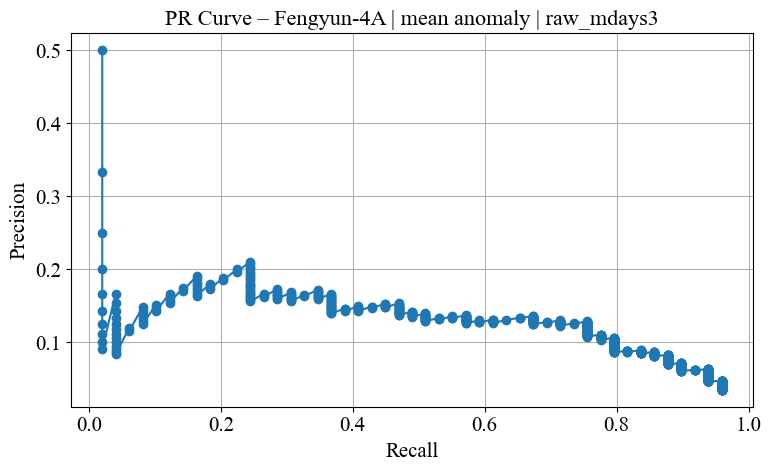

[RAW] | mdays=3 | Threshold=1.1477 | P=0.13 | R=0.76 | F1=0.22 | F2=0.38
[RAW] TP=37, FP=251, FN=12


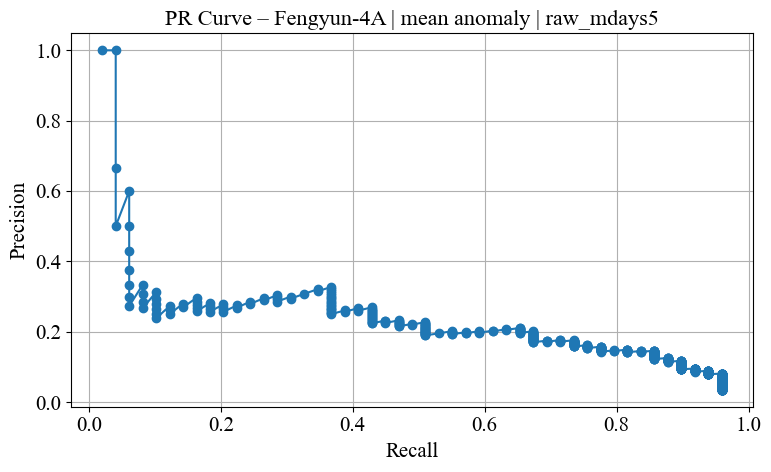

[RAW] | mdays=5 | Threshold=1.4172 | P=0.21 | R=0.65 | F1=0.32 | F2=0.46
[RAW] TP=32, FP=120, FN=17

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.46)


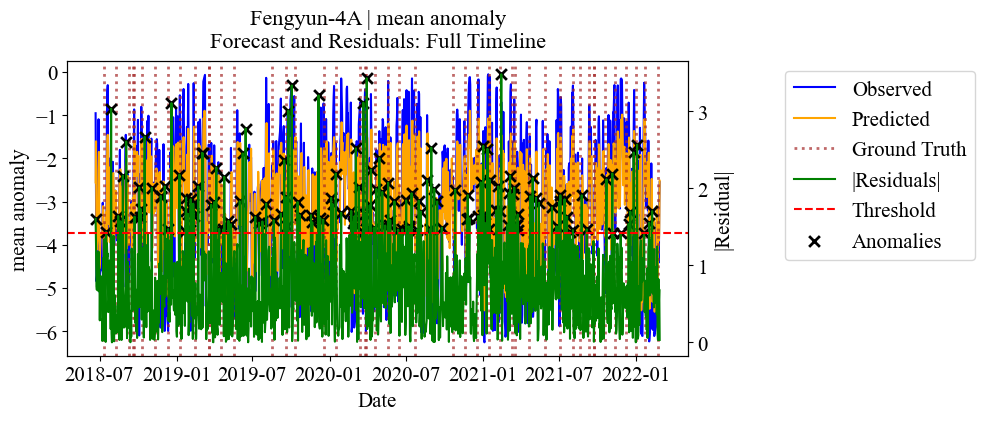

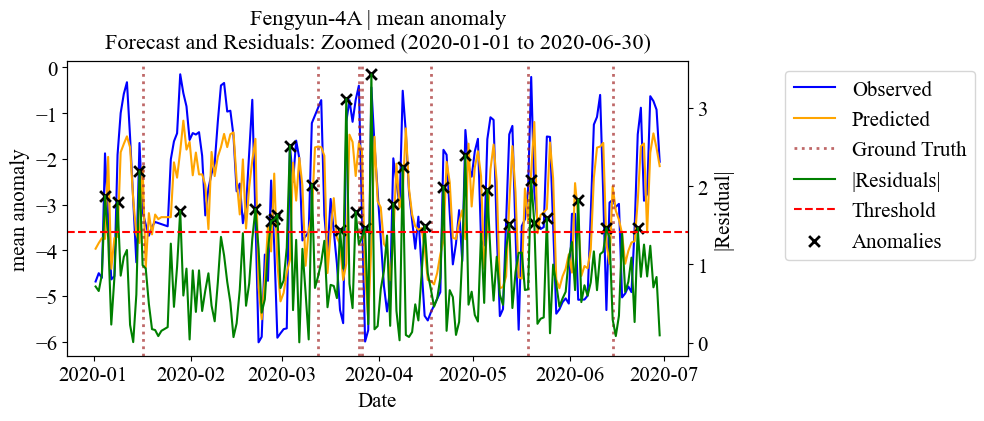

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
Skipping Fengyun-4A - mean anomaly - cleaned (no outliers detected)

=== Fengyun-4A | eccentricity ===
Rescaled eccentricity ×1e6
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 163


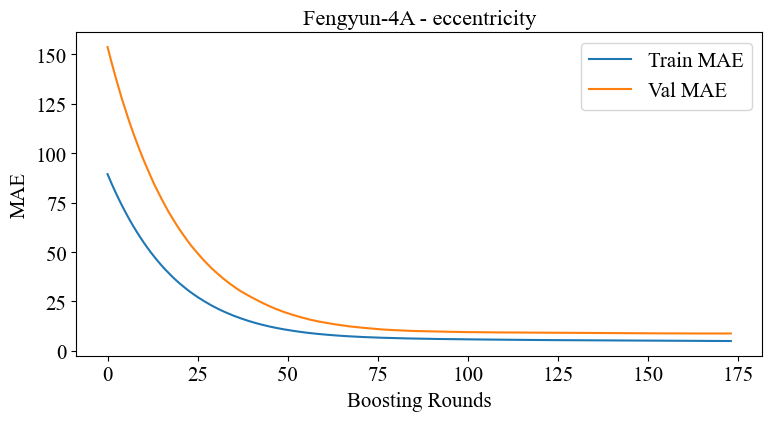

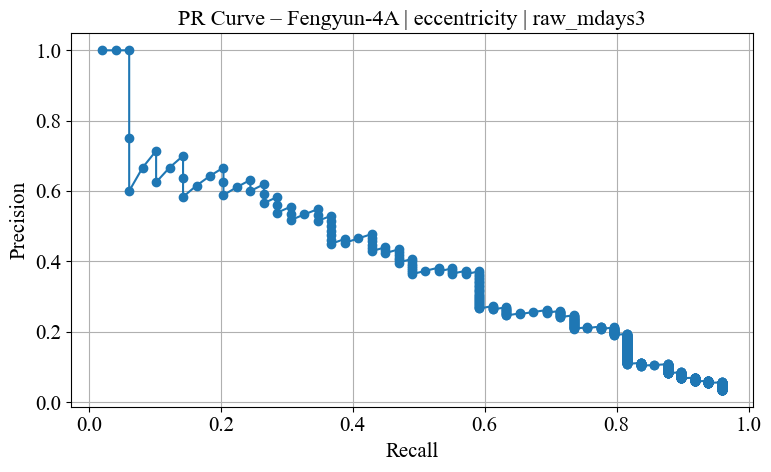

[RAW] | mdays=3 | Threshold=14.9792 | P=0.37 | R=0.59 | F1=0.46 | F2=0.53
[RAW] TP=29, FP=49, FN=20


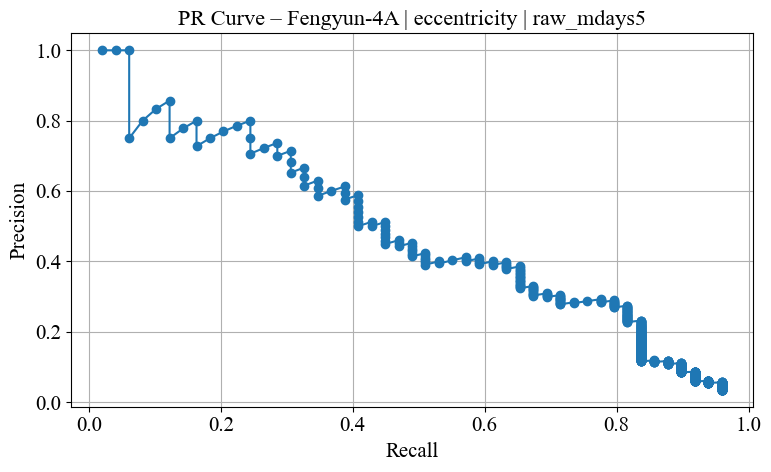

[RAW] | mdays=5 | Threshold=11.0071 | P=0.29 | R=0.80 | F1=0.42 | F2=0.59
[RAW] TP=39, FP=96, FN=10

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.59)


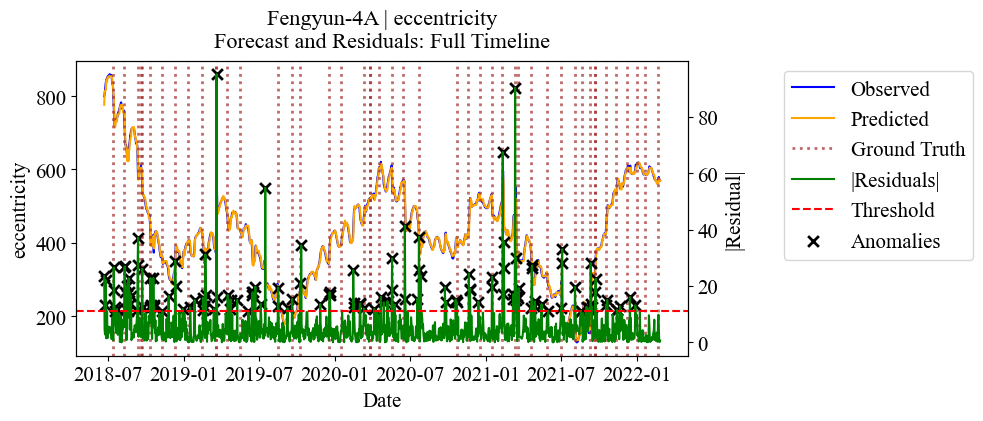

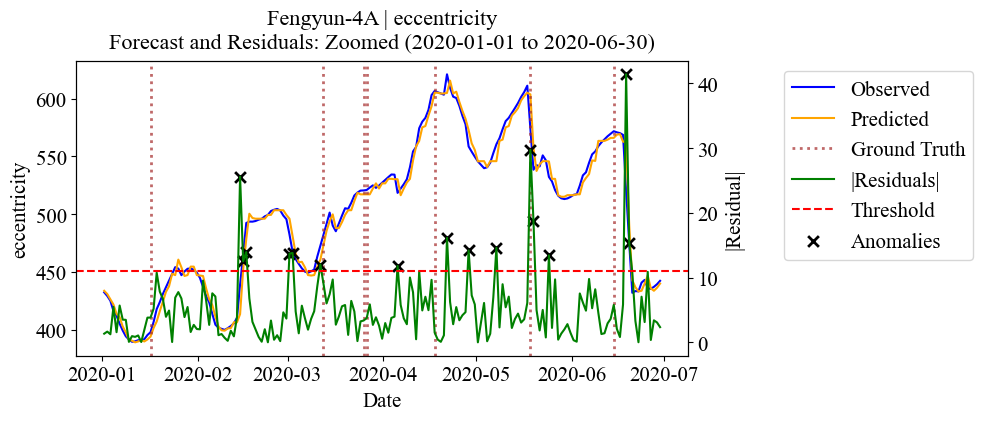

eccentricity: 0 outliers flagged
Total interpolated outliers: 0
Skipping Fengyun-4A - eccentricity - cleaned (no outliers detected)

=== SARAL | Brouwer mean motion ===
Rescaled Brouwer mean motion ×1e6
Raw | Best params: {'max_depth': 2, 'learning_rate': 0.1, 'n_estimators': 100, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 7


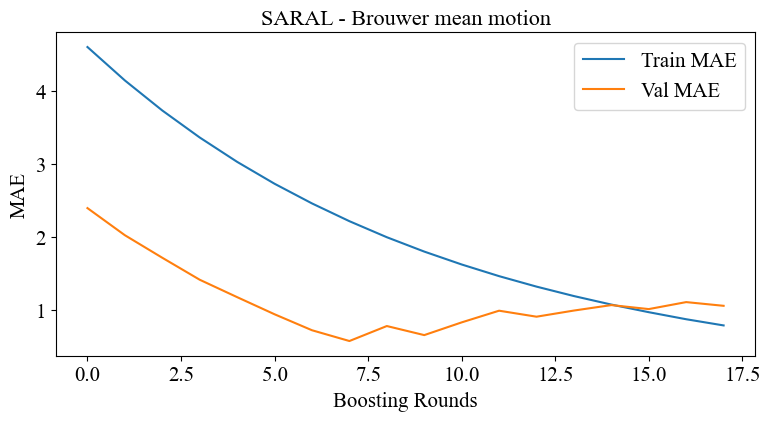

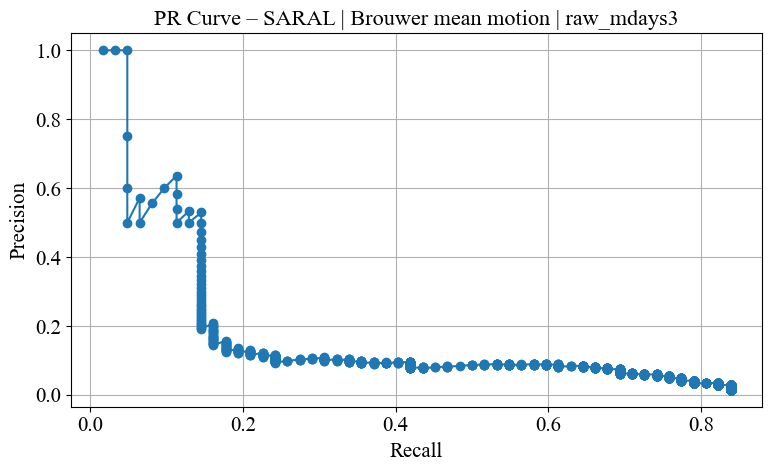

[RAW] | mdays=3 | Threshold=2.9225 | P=0.09 | R=0.61 | F1=0.16 | F2=0.28
[RAW] TP=38, FP=389, FN=24


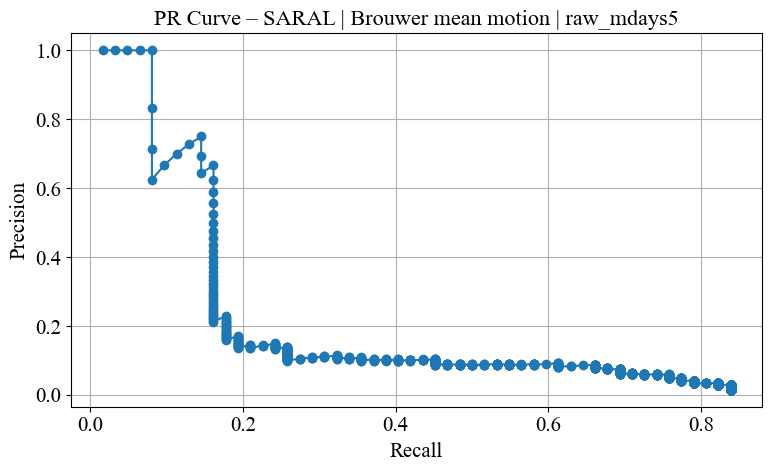

[RAW] | mdays=5 | Threshold=2.9302 | P=0.09 | R=0.61 | F1=0.16 | F2=0.29
[RAW] TP=38, FP=375, FN=24

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.29)


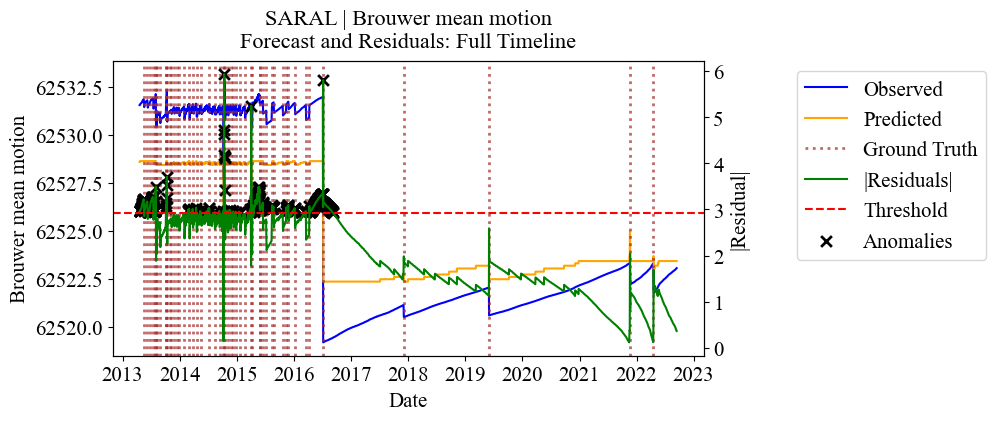

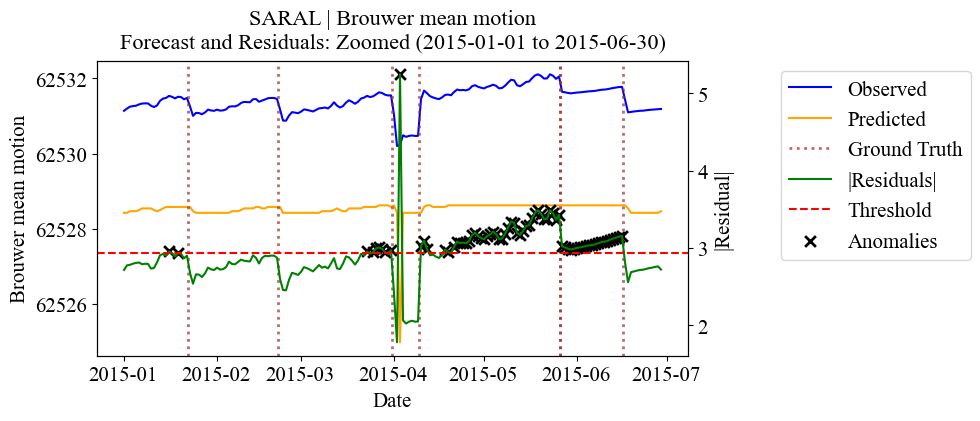

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
Skipping SARAL - Brouwer mean motion - cleaned (no outliers detected)

=== SARAL | mean anomaly ===
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 299


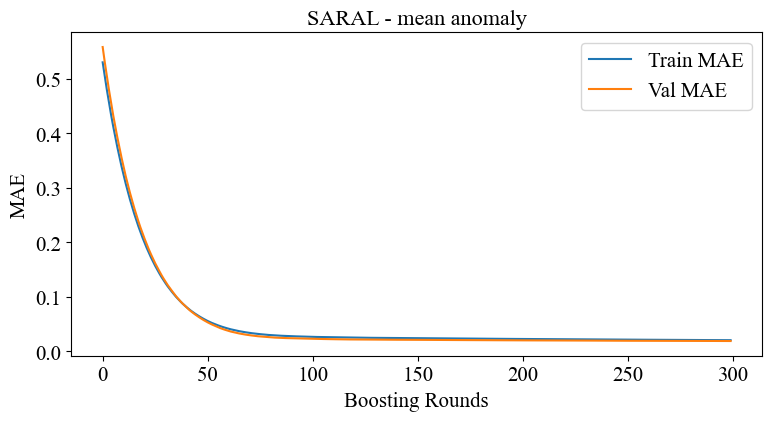

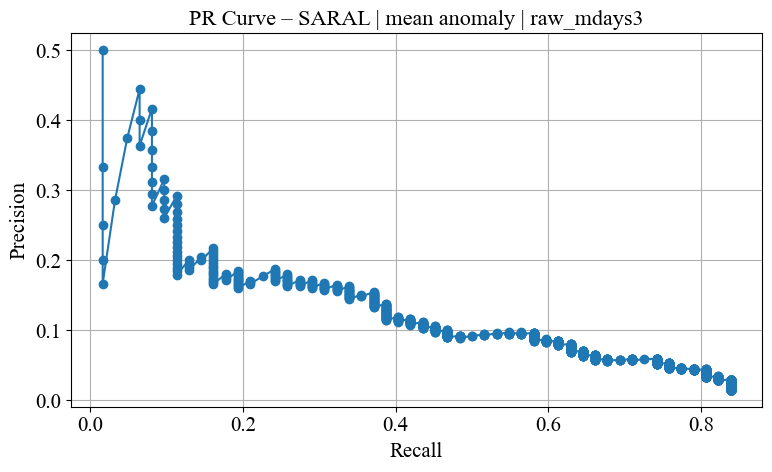

[RAW] | mdays=3 | Threshold=0.0400 | P=0.10 | R=0.58 | F1=0.17 | F2=0.29
[RAW] TP=36, FP=336, FN=26


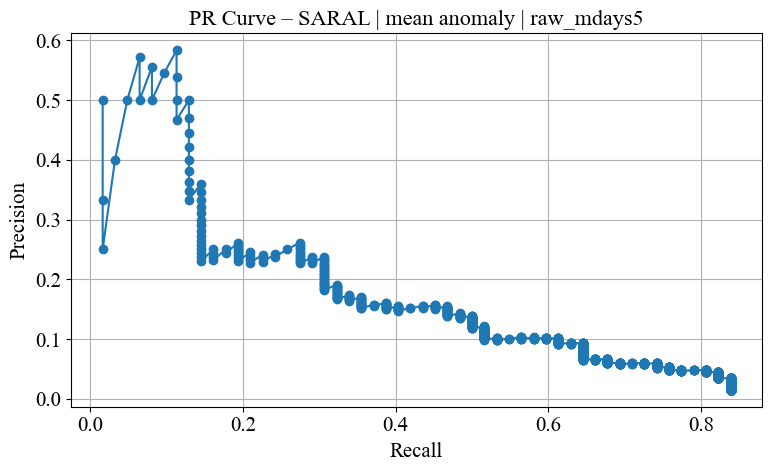

[RAW] | mdays=5 | Threshold=0.0633 | P=0.16 | R=0.47 | F1=0.23 | F2=0.33
[RAW] TP=29, FP=158, FN=33

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.33)


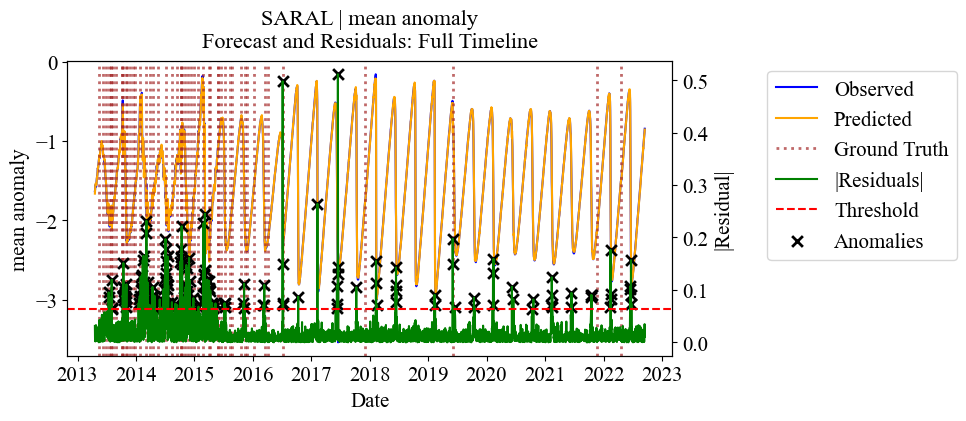

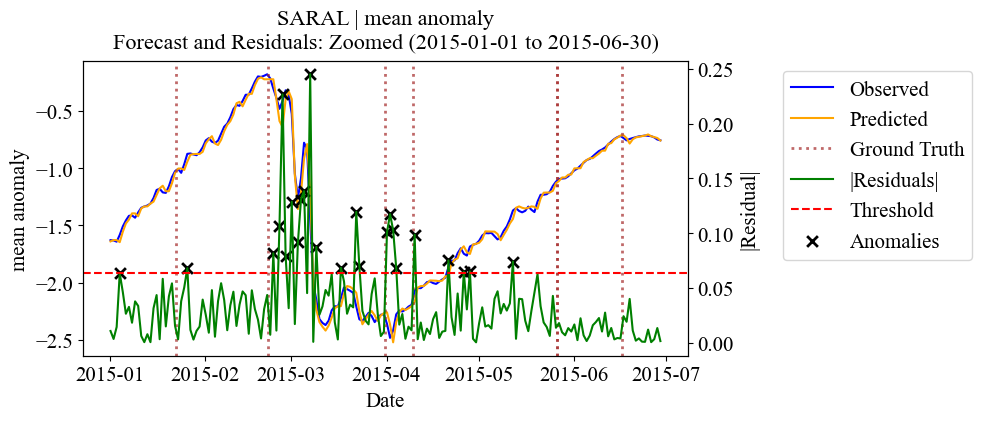

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
Skipping SARAL - mean anomaly - cleaned (no outliers detected)

=== SARAL | eccentricity ===
Rescaled eccentricity ×1e6
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 294


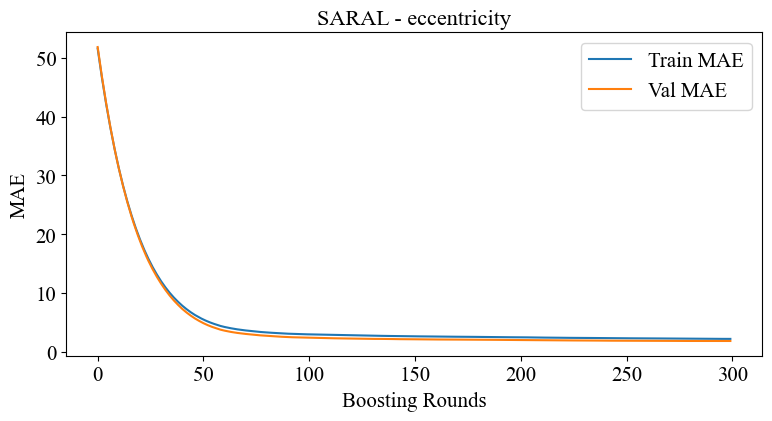

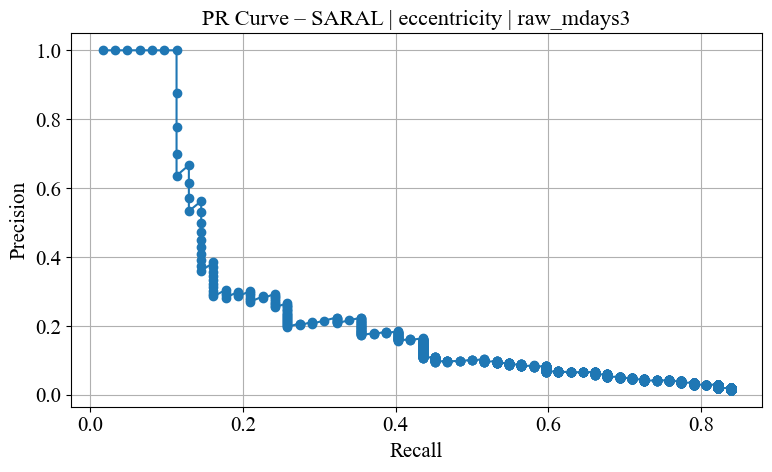

[RAW] | mdays=3 | Threshold=6.2078 | P=0.16 | R=0.44 | F1=0.24 | F2=0.33
[RAW] TP=27, FP=137, FN=35


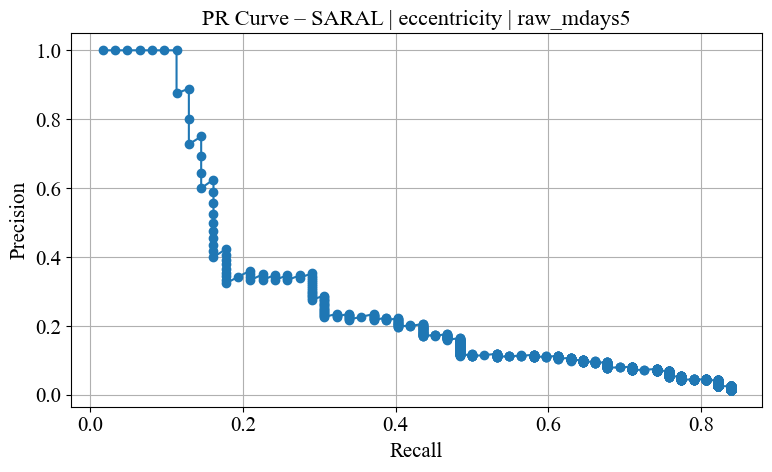

[RAW] | mdays=5 | Threshold=7.0049 | P=0.21 | R=0.44 | F1=0.28 | F2=0.36
[RAW] TP=27, FP=104, FN=35

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.36)


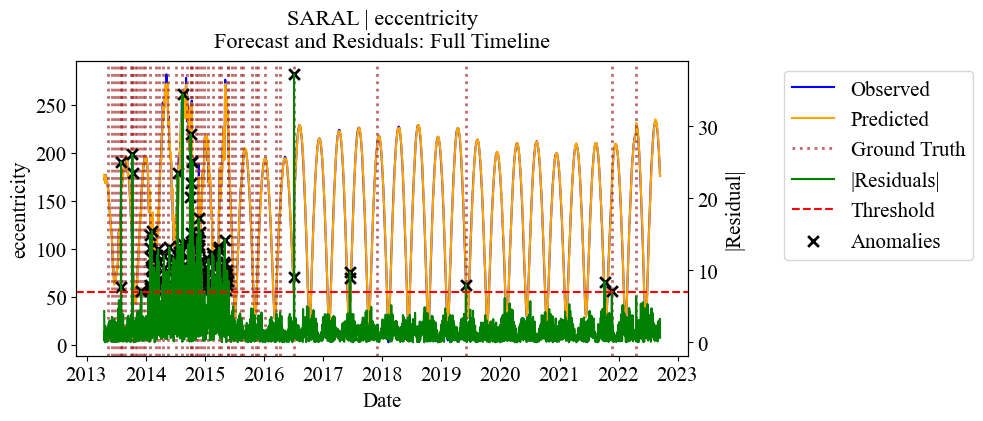

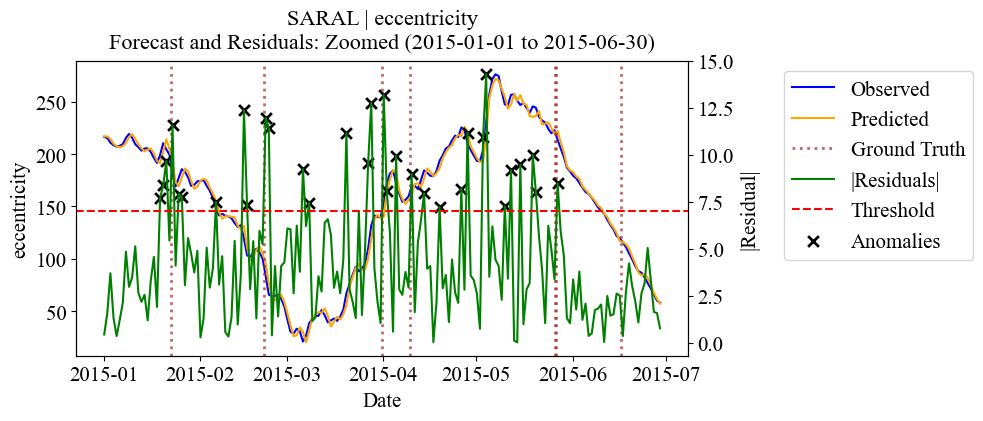

eccentricity: 0 outliers flagged
Total interpolated outliers: 0
Skipping SARAL - eccentricity - cleaned (no outliers detected)

=== Haiyang-2A | Brouwer mean motion ===
Rescaled Brouwer mean motion ×1e6
Raw | Best params: {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 50


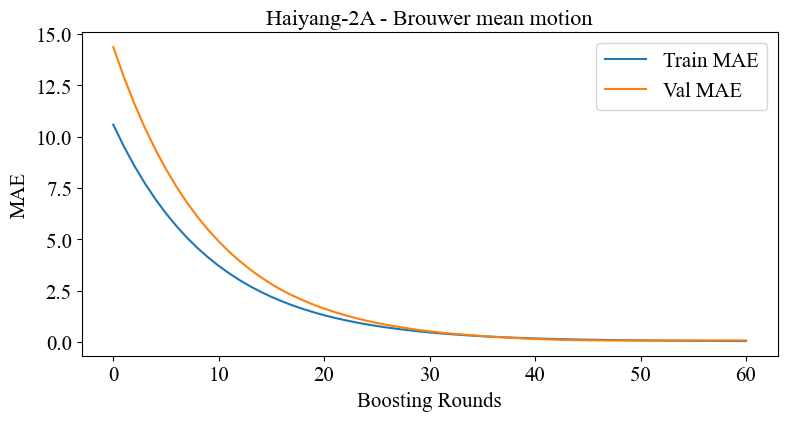

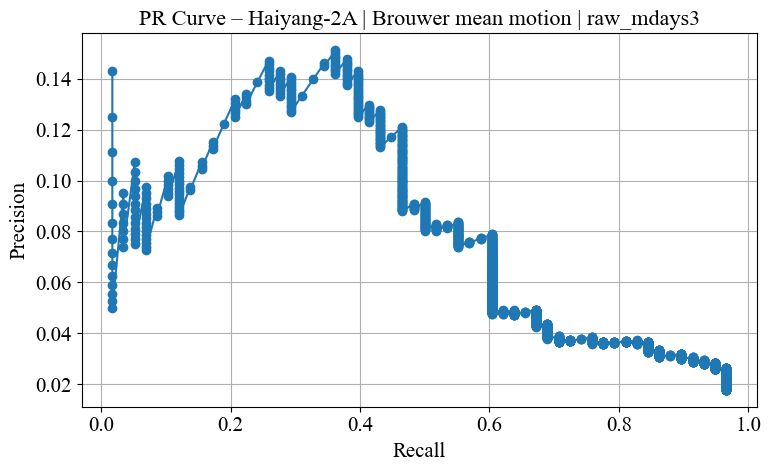

[RAW] | mdays=3 | Threshold=0.1284 | P=0.12 | R=0.47 | F1=0.19 | F2=0.30
[RAW] TP=27, FP=196, FN=31


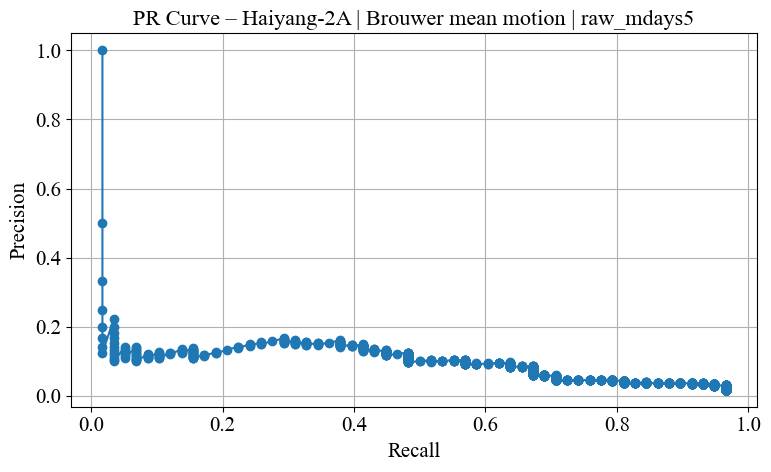

[RAW] | mdays=5 | Threshold=0.1284 | P=0.13 | R=0.48 | F1=0.20 | F2=0.31
[RAW] TP=28, FP=195, FN=30

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.31)


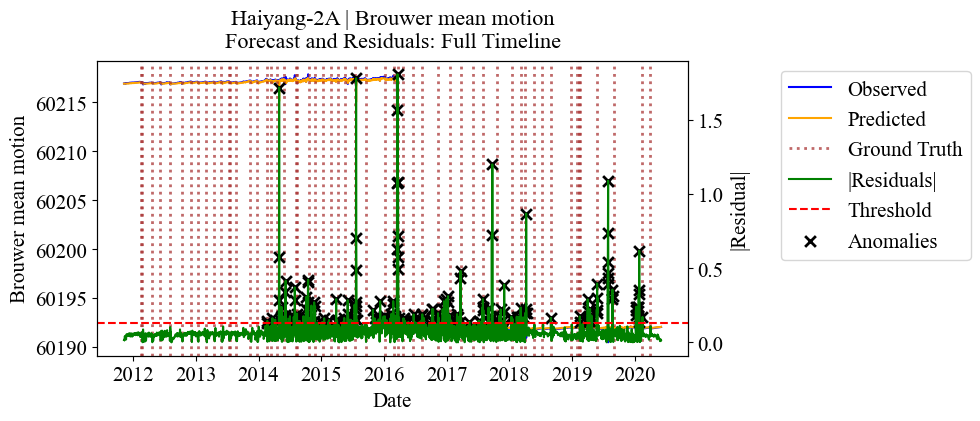

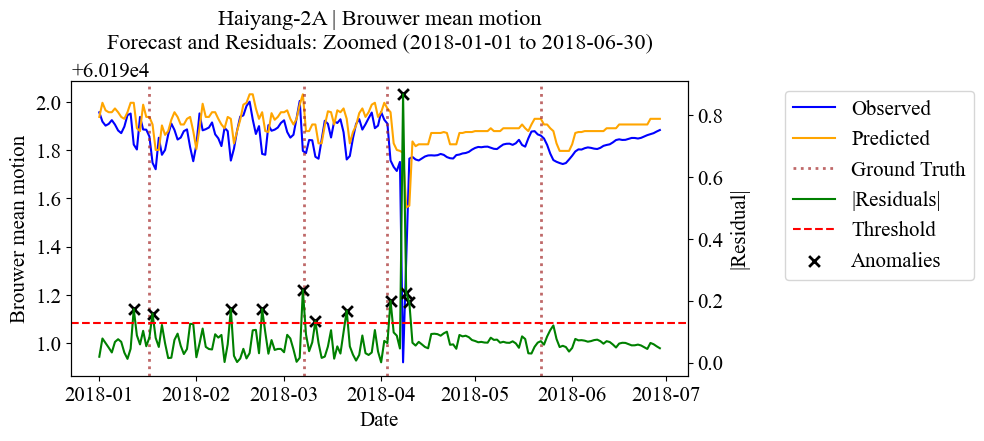

Brouwer mean motion: 0 outliers flagged
Total interpolated outliers: 0
Skipping Haiyang-2A - Brouwer mean motion - cleaned (no outliers detected)

=== Haiyang-2A | mean anomaly ===
Raw | Best params: {'max_depth': 3, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 199


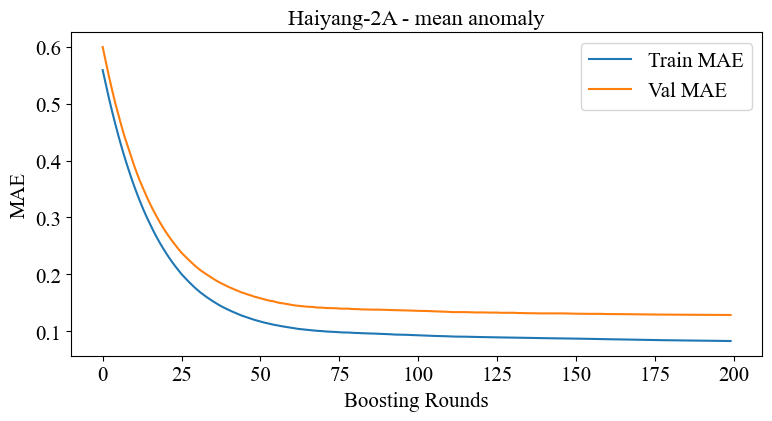

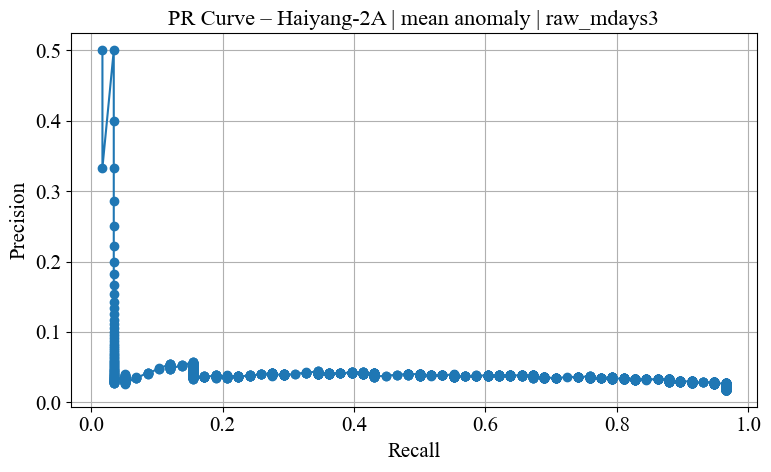

[RAW] | mdays=3 | Threshold=0.0690 | P=0.04 | R=0.67 | F1=0.07 | F2=0.16
[RAW] TP=39, FP=965, FN=19


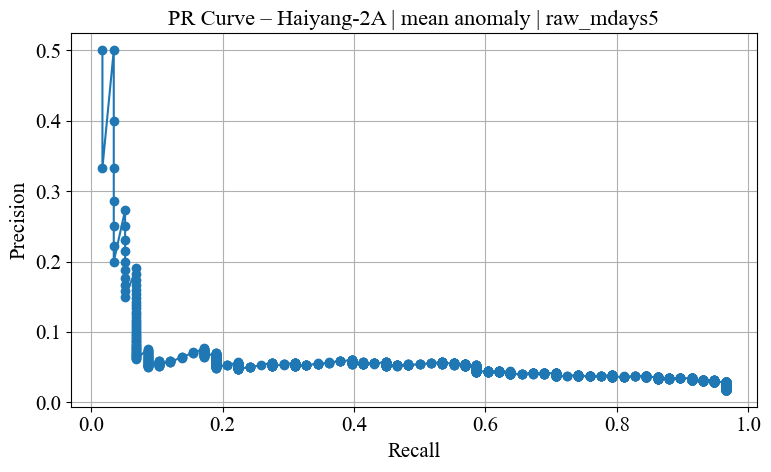

[RAW] | mdays=5 | Threshold=0.1160 | P=0.06 | R=0.53 | F1=0.10 | F2=0.20
[RAW] TP=31, FP=510, FN=27

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.20)


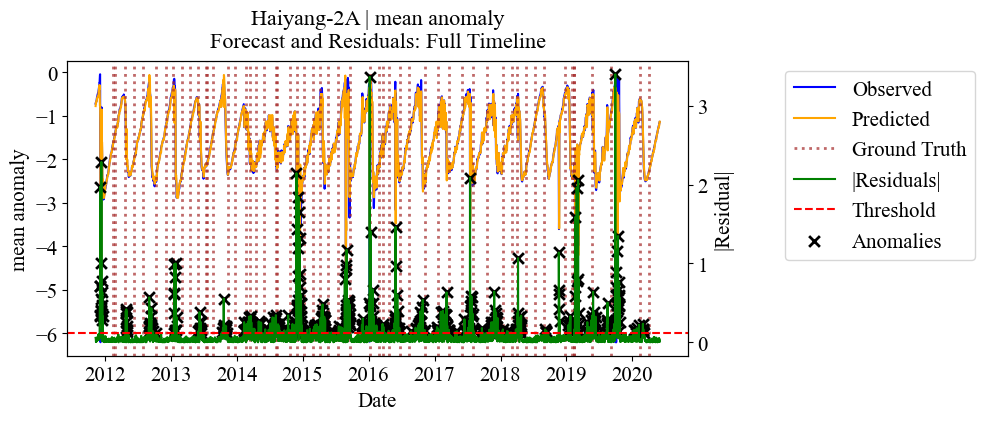

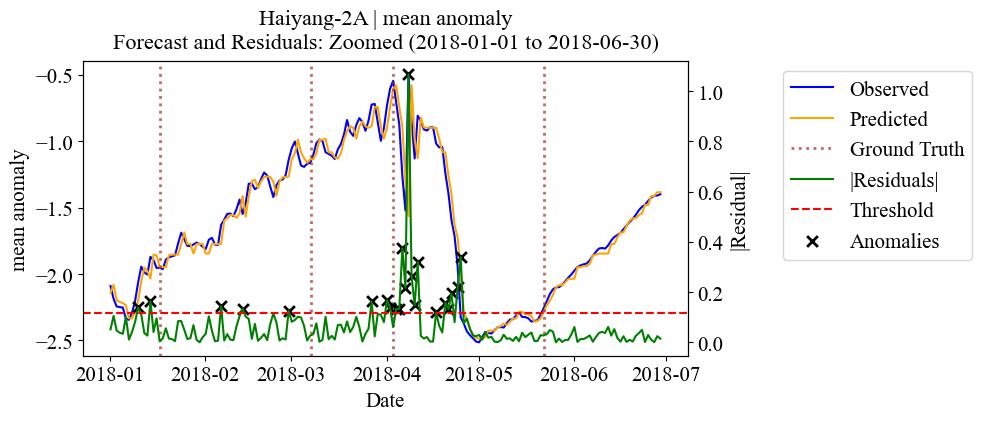

mean anomaly: 0 outliers flagged
Total interpolated outliers: 0
Skipping Haiyang-2A - mean anomaly - cleaned (no outliers detected)

=== Haiyang-2A | eccentricity ===
Rescaled eccentricity ×1e6
Raw | Best params: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Iter: 253


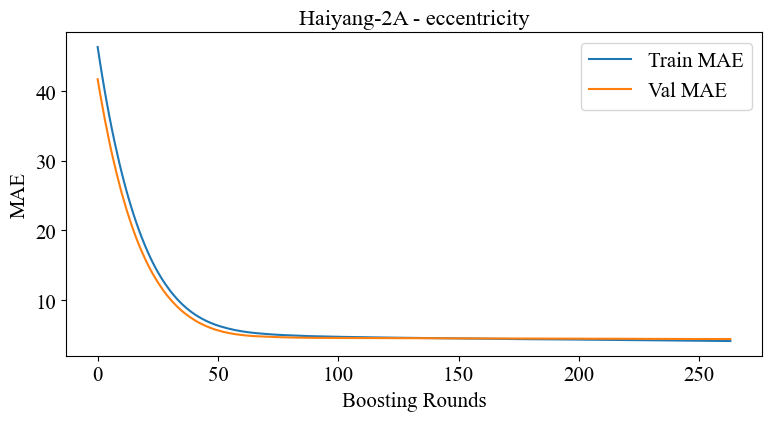

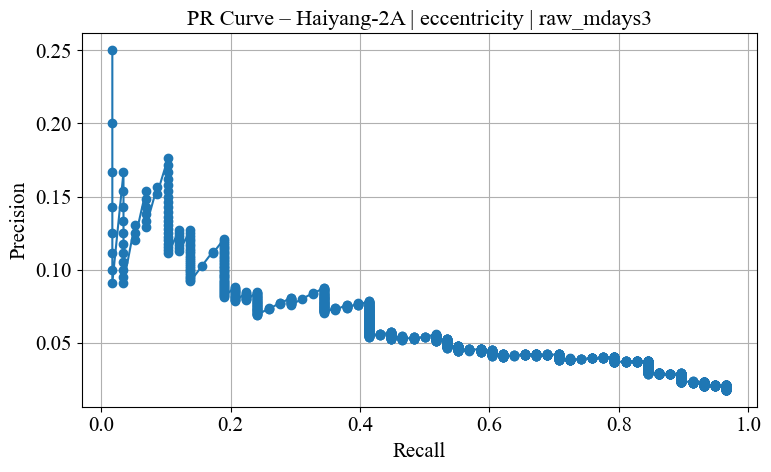

[RAW] | mdays=3 | Threshold=9.6989 | P=0.08 | R=0.41 | F1=0.13 | F2=0.22
[RAW] TP=24, FP=281, FN=34


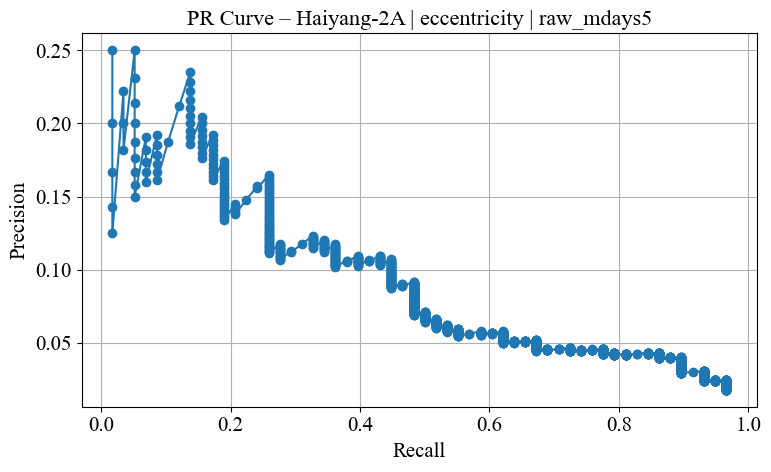

[RAW] | mdays=5 | Threshold=10.9682 | P=0.11 | R=0.45 | F1=0.17 | F2=0.27
[RAW] TP=26, FP=217, FN=32

 [RAW] Using BEST mdays = ±5 for anomaly detection (F2 = 0.27)


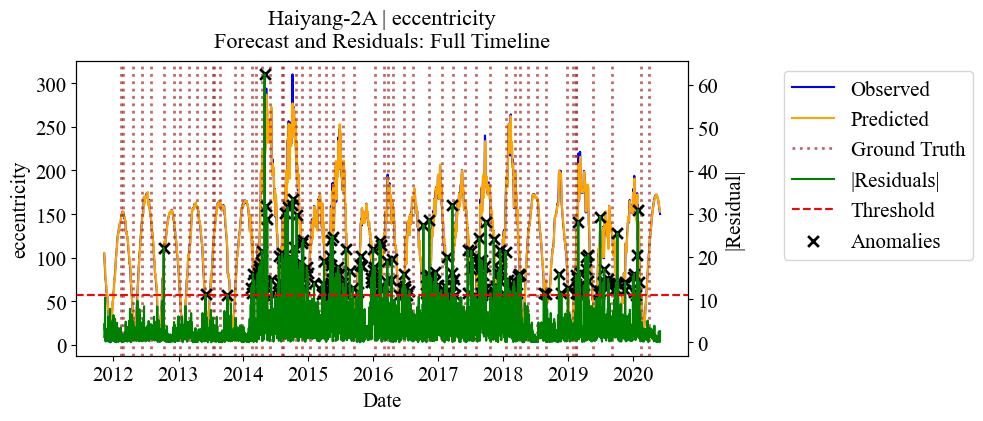

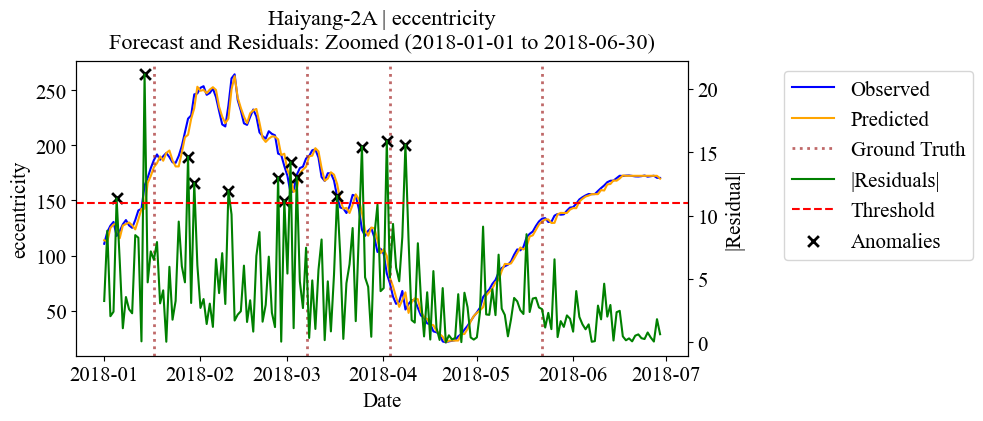

eccentricity: 0 outliers flagged
Total interpolated outliers: 0
Skipping Haiyang-2A - eccentricity - cleaned (no outliers detected)


In [2]:
# === Univariate loop ===
for sat in satellites:
    name = sat["name"]
    df = pd.read_csv(sat["csv_path"], parse_dates=[0], index_col=0)
    man_df = pd.read_csv(sat["maneuver_csv"], parse_dates=["start_time"])
    date_range = tuple(pd.to_datetime(d) for d in sat["date_range"])
    gt_times = man_df["start_time"]

    for feature in features_to_forecast:
        print(f"\n=== {name} | {feature} ===")
        df_feature = df[[feature]].copy()
        df_feature = fxt.exclude_initial_points(df_feature)
        df_feature = fxt.rescale_feature(df_feature, feature)
        df_feature = fxt.interpolate_daily(df_feature)

        for cleaned in [False, True]:
            df_used = df_feature.copy()
            mode = "cleaned" if cleaned else "raw"

            # Clean and record outliers
            if cleaned:
                df_used, outlier_mask = fxt.clean_outliers_by_iqr(df_used, iqr_factor=IQR_FACTOR)

                # Timestamps where any column was flagged
                outlier_timestamps = outlier_mask.index[outlier_mask.any(axis=1)]

                if len(outlier_timestamps) == 0:
                    print(f"Skipping {name} - {feature} - cleaned (no outliers detected)")
                    continue

                # Overlap with manoeuvre times (±1 day)
                overlap_count = sum(
                    any((outlier_timestamps >= gt - pd.Timedelta(days=1)) & (outlier_timestamps <= gt + pd.Timedelta(days=1)))
                    for gt in gt_times
                )

                # Log overlap summary
                summary_path = os.path.join(log_dir, "outlier_overlap_log.csv")
                exists = os.path.exists(summary_path)
                pd.DataFrame([{
                    "Satellite": name,
                    "Feature": feature,
                    "Outliers_Flagged": len(outlier_timestamps),
                    "Outliers_Overlapping_with_Manoeuvres": overlap_count
                }]).to_csv(summary_path, mode='a', index=False, header=not exists)



            # Prepare lag features
            X_lag, y = fxt.generate_lag_features(df_used, feature, NUM_LAGS)
            valid_idx = X_lag.dropna().index.intersection(y.dropna().index)
            X_lag, y = X_lag.loc[valid_idx], y.loc[valid_idx]

            if len(y) < 10:
                print(f"Skipping {name} - {feature} - {mode} (not enough data)")
                continue

            # Hyperparameter search (80/20 split with early stopping)
            best_model, best_params, best_iteration = None, None, None
            lowest_val_mae = float('inf')
            split = y.index[int(len(y) * 0.8)]

            for params in hyperparam_grid:
                model = XGBRegressor(**params, early_stopping_rounds=10, eval_metric="mae", verbosity=0)
                model.fit(
                    X_lag[X_lag.index < split], y[y.index < split],
                    eval_set=[
                        (X_lag[X_lag.index < split], y[y.index < split]),
                        (X_lag[X_lag.index >= split], y[y.index >= split])
                    ],
                    verbose=False
                )
                val_mae = model.evals_result()['validation_1']['mae'][model.best_iteration]
                if val_mae < lowest_val_mae:
                    best_model, best_params, best_iteration = model, params, model.best_iteration
                    lowest_val_mae = val_mae

            print(f"{mode.title()} | Best params: {best_params}, Iter: {best_iteration}")

            # Training curve
            fxt.plot_training_curves(best_model, name, feature, curve_dir, cleaned=cleaned)

            # Refit model on full data
            final_params = best_params.copy()
            final_params["n_estimators"] = best_iteration + 1
            final_model = XGBRegressor(**final_params, eval_metric="mae", verbosity=0)
            final_model.fit(X_lag, y)
            y_pred = pd.Series(final_model.predict(X_lag), index=y.index)
            residuals = (y - y_pred).abs()

            # Save residuals and forecasts
            res_dir = fxt.make_subfolder(residual_dir, name, cleaned)
            res_file = f"{feature}_residuals.csv".replace(" ", "_").lower()
            residuals.to_csv(os.path.join(res_dir, res_file))

            fc_dir = fxt.make_subfolder(forecast_dir, name, cleaned)
            fc_file = f"{feature}_forecast.csv".replace(" ", "_").lower()
            pd.DataFrame({"observed": y, "predicted": y_pred}).to_csv(os.path.join(fc_dir, fc_file))

            # PR threshold sweep
            best_mday = None
            best_f2 = -1
            best_metrics = None
            for mday in MATCHING_DAYS_LIST:
                df_pr, metrics = fxt.sweep_thresholds_and_plot(
                    residuals=residuals,
                    ground_truth_times=gt_times,
                    matching_max_days=mday,
                    satellite=name,
                    feature=feature,
                    mode=mode,
                    save_path="../images",
                    selection_metric="f2",
                    summary_log_path=os.path.join(log_dir, "pr_summary.csv"),
                    model_type="xgb"
                )
                f2 = metrics.get("f2", 0)
                print(f"[{mode.upper()}] | mdays={mday} | Threshold={metrics['threshold']:.4f} | "
                      f"P={metrics['precision']:.2f} | R={metrics['recall']:.2f} | F1={metrics['f1']:.2f} | F2={f2:.2f}")
                print(f"[{mode.upper()}] TP={metrics['TP']}, FP={metrics['FP']}, FN={metrics['FN']}")
                if f2 > best_f2:
                    best_f2 = f2
                    best_mday = mday
                    best_metrics = metrics

            # Summary print of best matching days 
            print(f"\n [{mode.upper()}] Using BEST mdays = ±{int(best_mday)} for anomaly detection (F2 = {best_f2:.2f})")


            # Plot forecast with best threshold
            fxt.plot_forecast_results(
                y, y_pred, name, feature, forecast_dir,
                ground_truth_times=gt_times,
                residuals=residuals,
                anomaly_times=residuals[residuals > best_metrics["threshold"]].index,
                threshold=best_metrics["threshold"],
                zoom_range=date_range,
                cleaned=cleaned
            )



Rescaled Brouwer mean motion ×1e6
Rescaled eccentricity ×1e6

=== MULTIVARIATE: Sentinel-3A | Target = Brouwer mean motion | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Sentinel-3A | Brouwer mean motion: {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 33


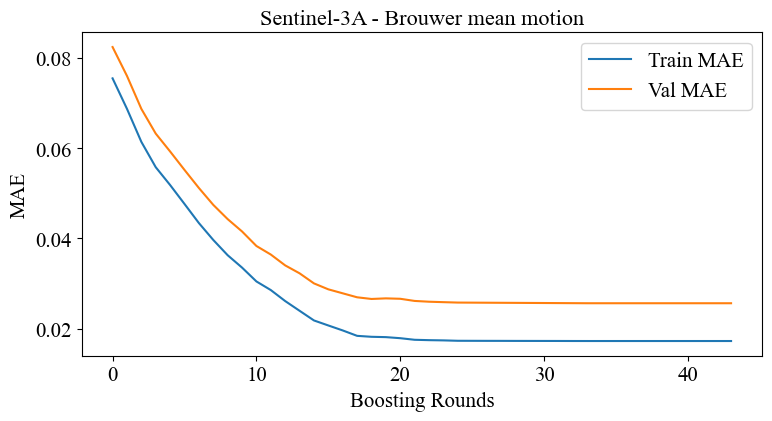

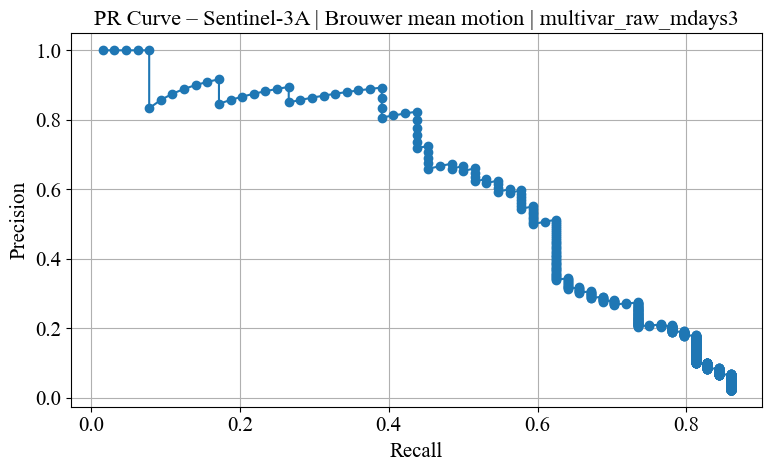

[MULTIVAR_RAW] mdays=3 | Threshold=0.0521 | P=0.51 | R=0.62 | F1=0.56 | F2=0.60
[MULTIVAR_RAW] TP=40, FP=38, FN=24


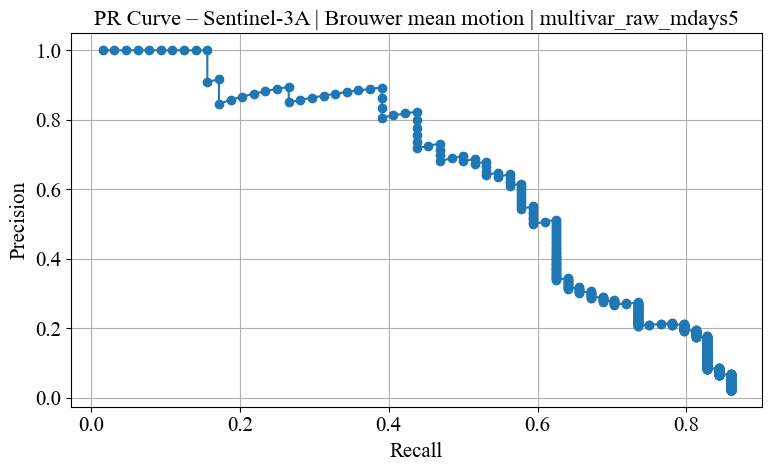

[MULTIVAR_RAW] mdays=5 | Threshold=0.0521 | P=0.51 | R=0.62 | F1=0.56 | F2=0.60
[MULTIVAR_RAW] TP=40, FP=38, FN=24

[MULTIVAR_RAW] Using BEST mdays = ±3 for Brouwer mean motion (F2 = 0.60)


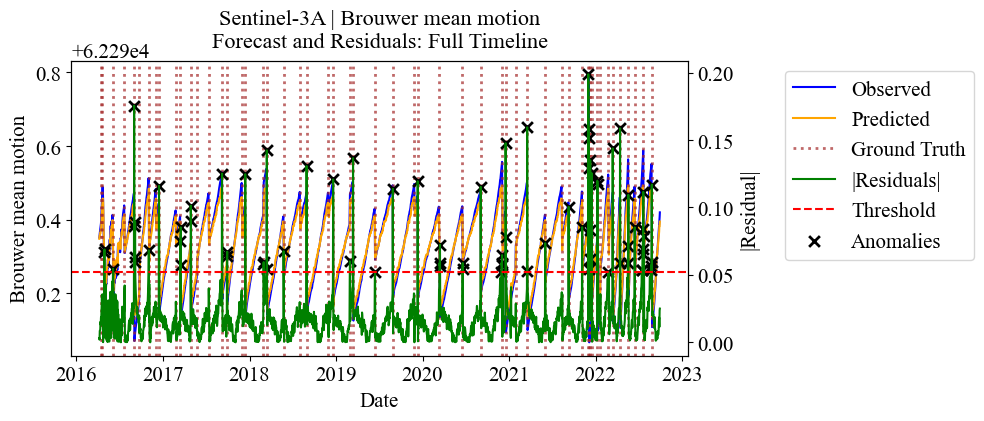

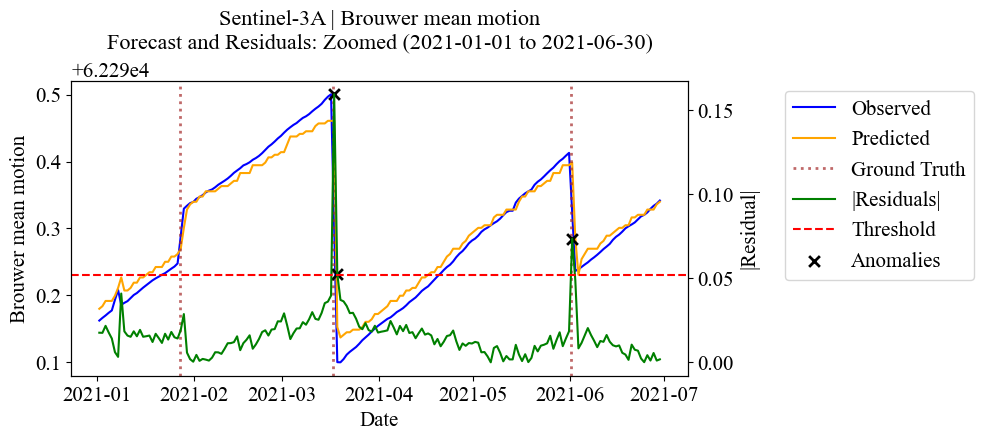


=== MULTIVARIATE: Sentinel-3A | Target = mean anomaly | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Sentinel-3A | mean anomaly: {'max_depth': 2, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 163


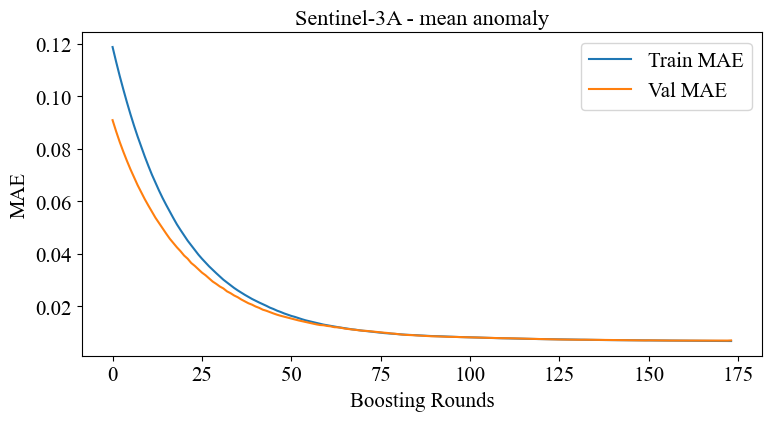

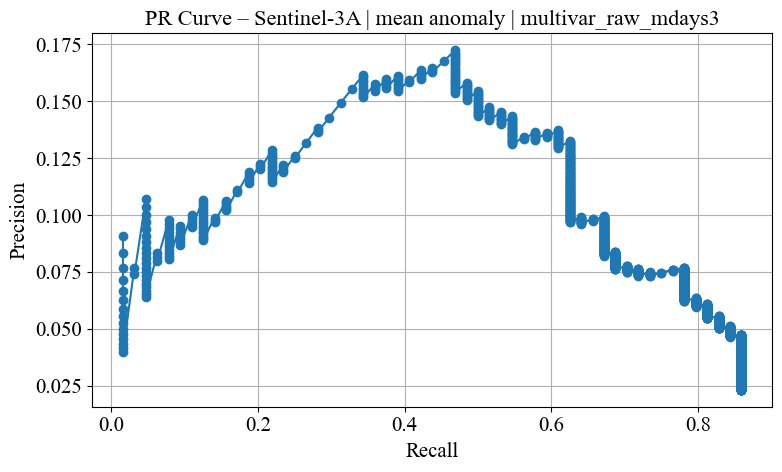

[MULTIVAR_RAW] mdays=3 | Threshold=0.0095 | P=0.14 | R=0.61 | F1=0.22 | F2=0.36
[MULTIVAR_RAW] TP=39, FP=245, FN=25


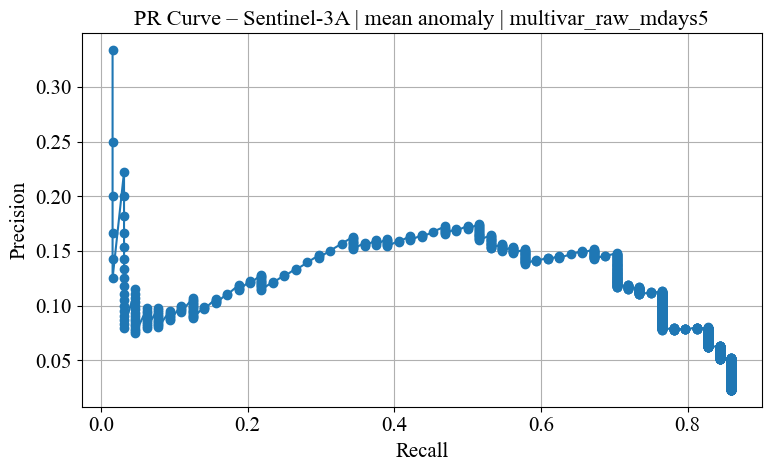

[MULTIVAR_RAW] mdays=5 | Threshold=0.0091 | P=0.15 | R=0.70 | F1=0.24 | F2=0.40
[MULTIVAR_RAW] TP=45, FP=259, FN=19

[MULTIVAR_RAW] Using BEST mdays = ±5 for mean anomaly (F2 = 0.40)


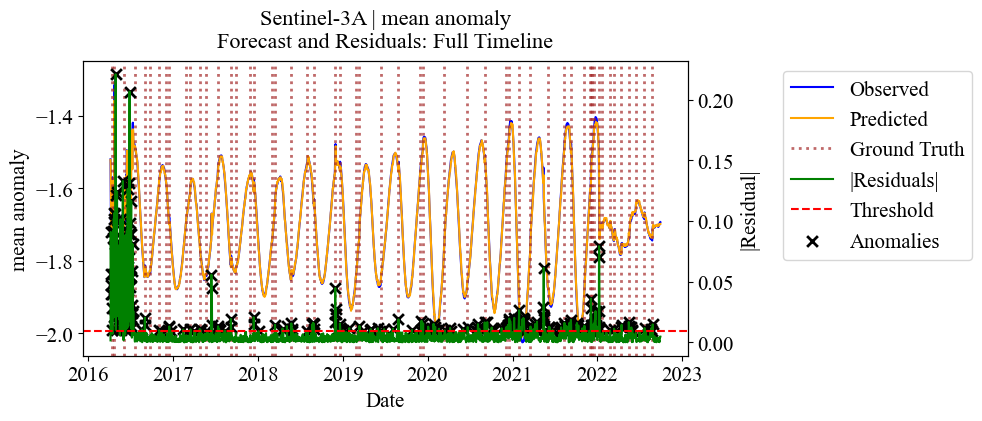

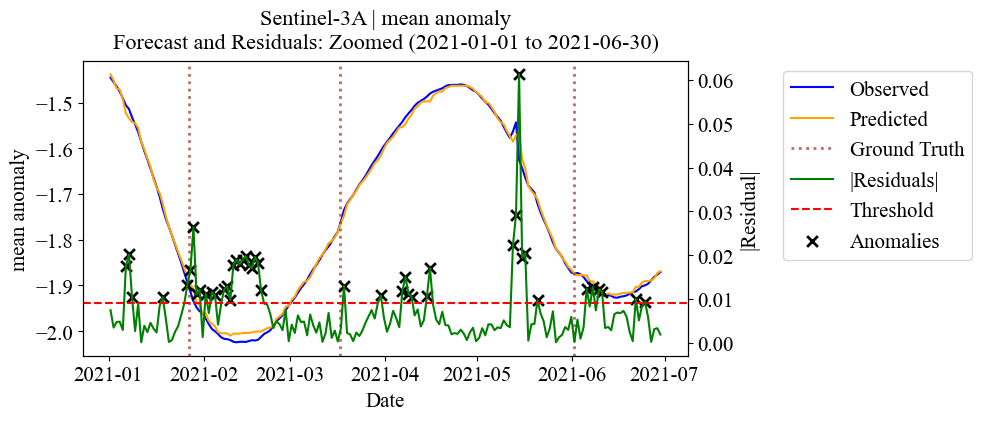


=== MULTIVARIATE: Sentinel-3A | Target = eccentricity | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Sentinel-3A | eccentricity: {'max_depth': 2, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 199


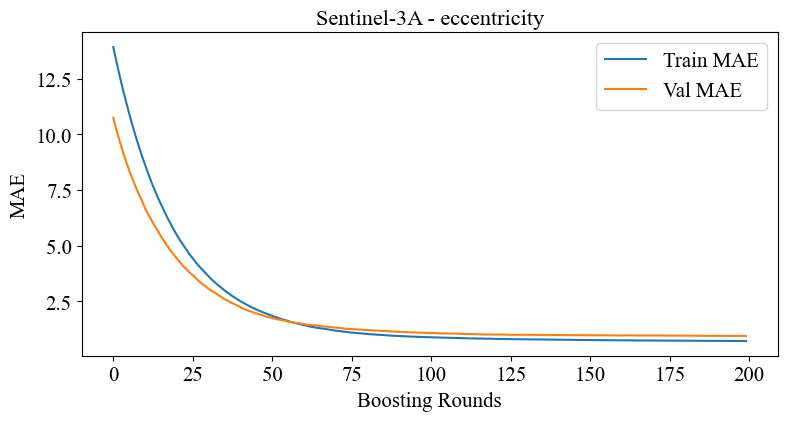

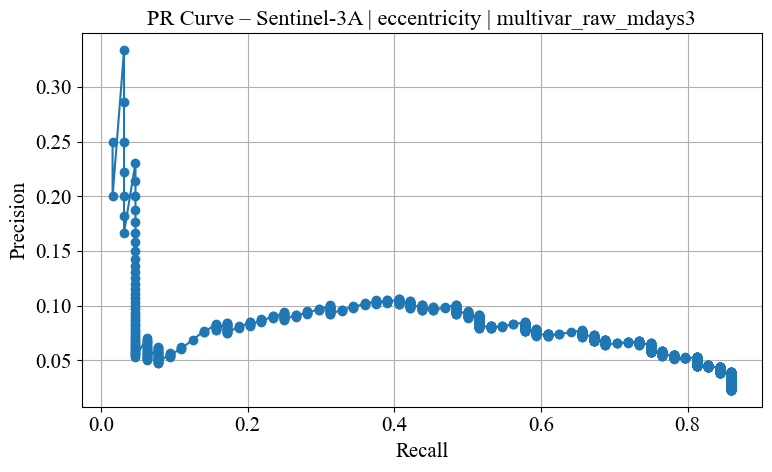

[MULTIVAR_RAW] mdays=3 | Threshold=0.9297 | P=0.10 | R=0.48 | F1=0.17 | F2=0.28
[MULTIVAR_RAW] TP=31, FP=276, FN=33


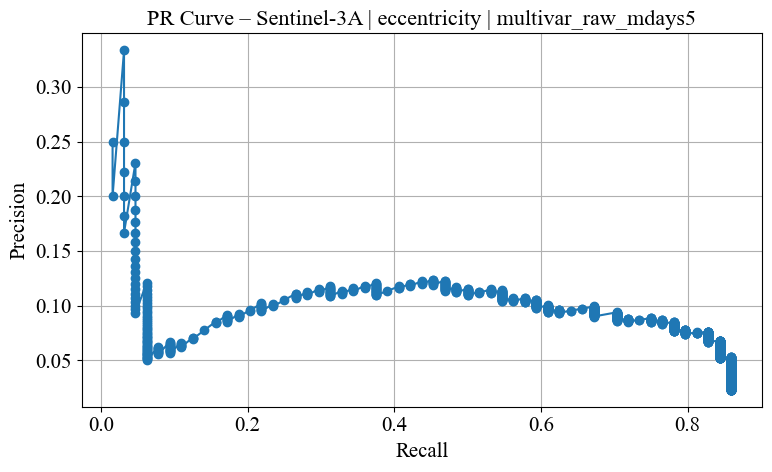

[MULTIVAR_RAW] mdays=5 | Threshold=0.7692 | P=0.10 | R=0.67 | F1=0.17 | F2=0.31
[MULTIVAR_RAW] TP=43, FP=390, FN=21

[MULTIVAR_RAW] Using BEST mdays = ±5 for eccentricity (F2 = 0.31)


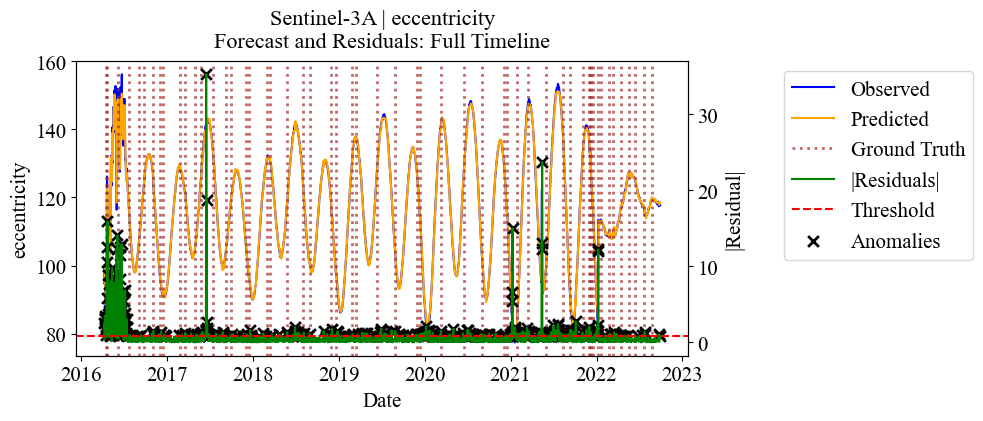

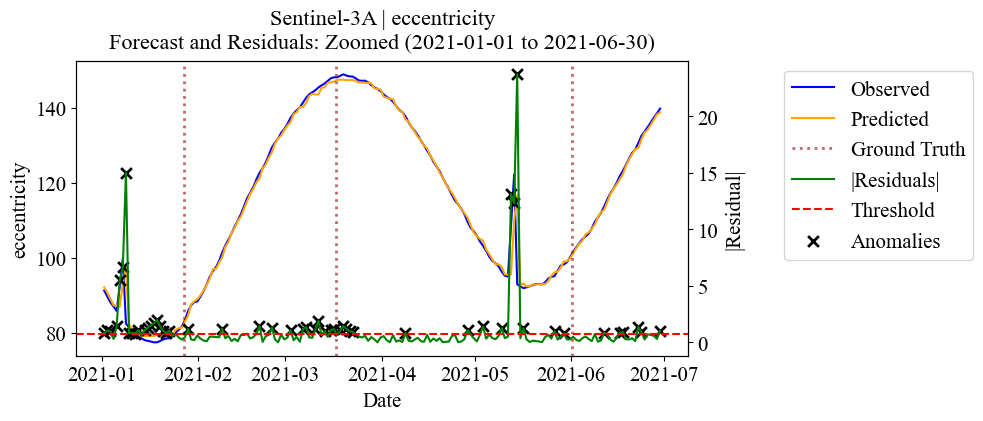

Rescaled Brouwer mean motion ×1e6
Rescaled eccentricity ×1e6

=== MULTIVARIATE: Fengyun-2F | Target = Brouwer mean motion | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Fengyun-2F | Brouwer mean motion: {'max_depth': 3, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 169


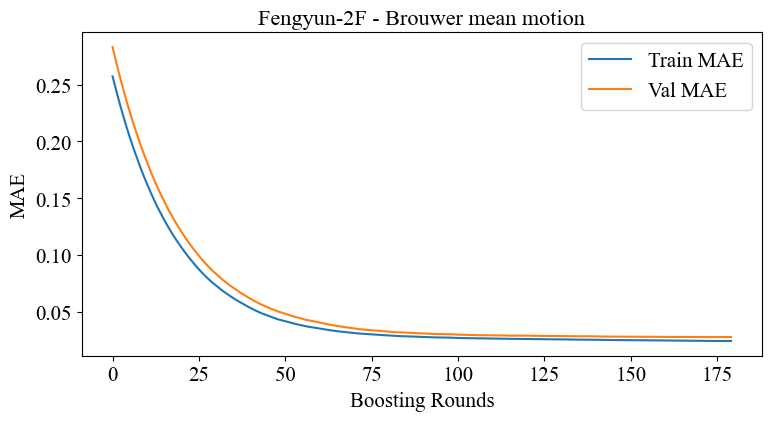

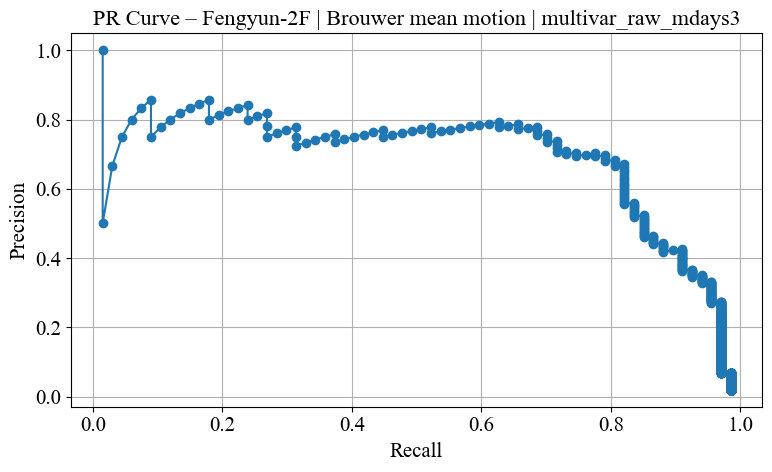

[MULTIVAR_RAW] mdays=3 | Threshold=0.1547 | P=0.67 | R=0.82 | F1=0.74 | F2=0.79
[MULTIVAR_RAW] TP=55, FP=27, FN=12


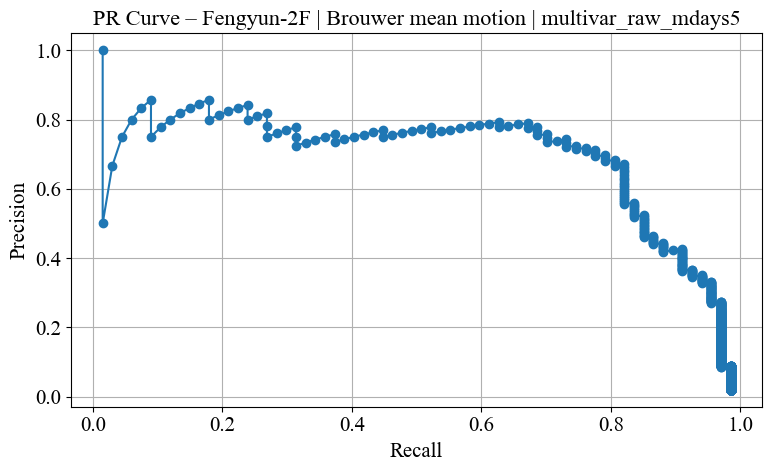

[MULTIVAR_RAW] mdays=5 | Threshold=0.1547 | P=0.67 | R=0.82 | F1=0.74 | F2=0.79
[MULTIVAR_RAW] TP=55, FP=27, FN=12

[MULTIVAR_RAW] Using BEST mdays = ±3 for Brouwer mean motion (F2 = 0.79)


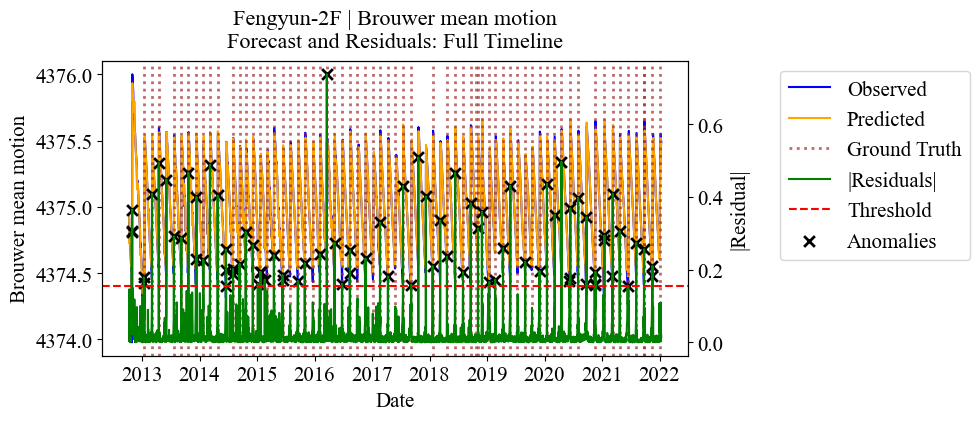

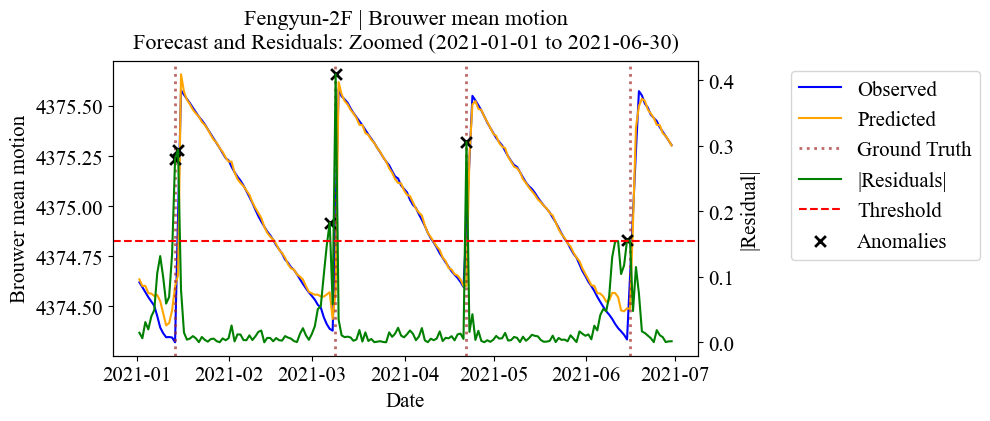


=== MULTIVARIATE: Fengyun-2F | Target = Brouwer mean motion | Mode = multivar_cleaned ===
[MULTIVAR_CLEANED] Best params for Fengyun-2F | Brouwer mean motion: {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 94


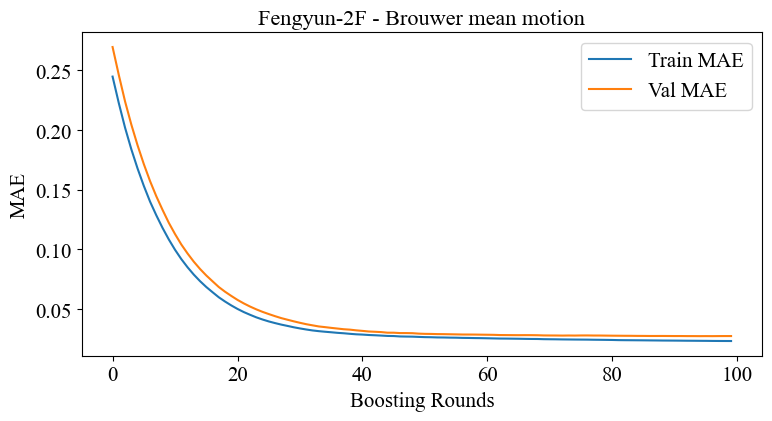

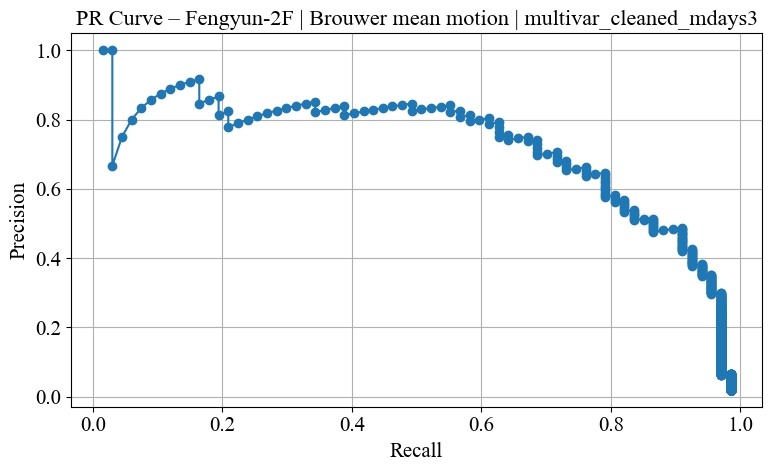

[MULTIVAR_CLEANED] mdays=3 | Threshold=0.1090 | P=0.49 | R=0.91 | F1=0.64 | F2=0.78
[MULTIVAR_CLEANED] TP=61, FP=64, FN=6


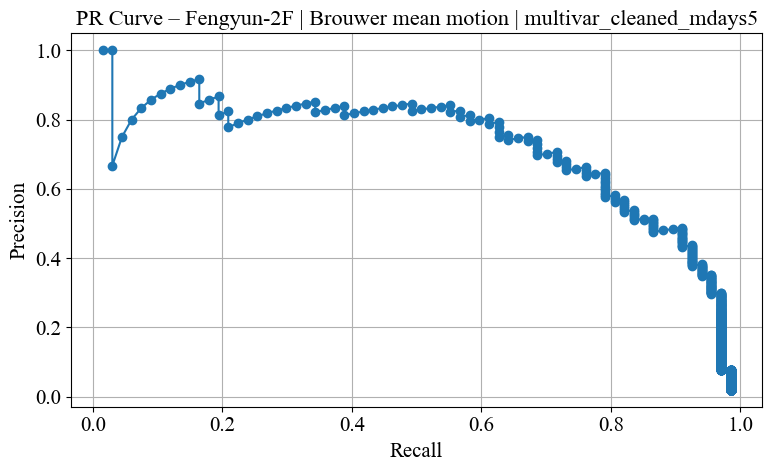

[MULTIVAR_CLEANED] mdays=5 | Threshold=0.1090 | P=0.49 | R=0.91 | F1=0.64 | F2=0.78
[MULTIVAR_CLEANED] TP=61, FP=64, FN=6

[MULTIVAR_CLEANED] Using BEST mdays = ±3 for Brouwer mean motion (F2 = 0.78)


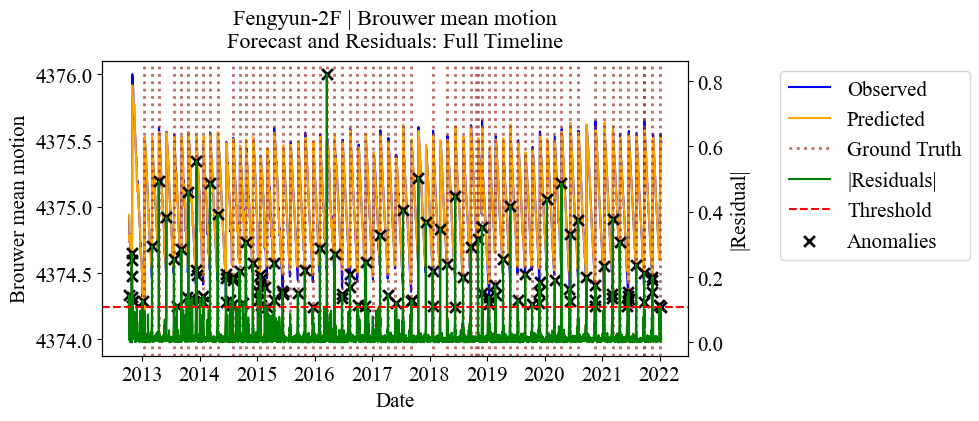

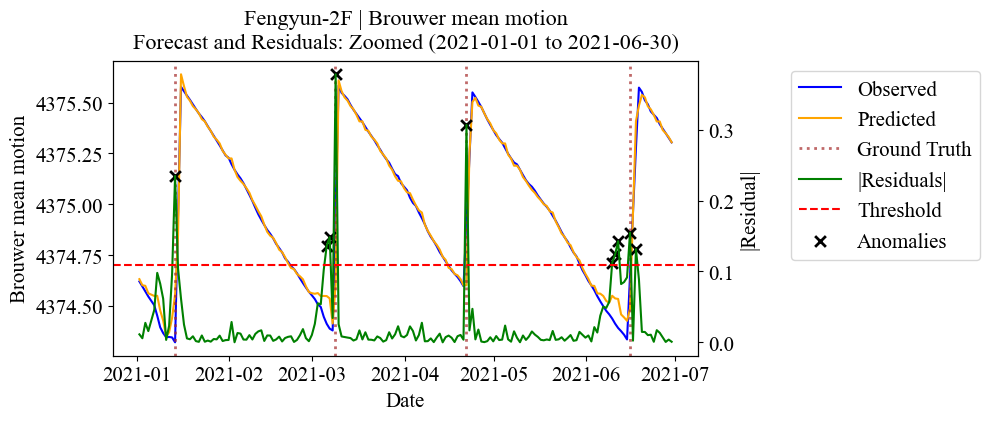


=== MULTIVARIATE: Fengyun-2F | Target = mean anomaly | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Fengyun-2F | mean anomaly: {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 78


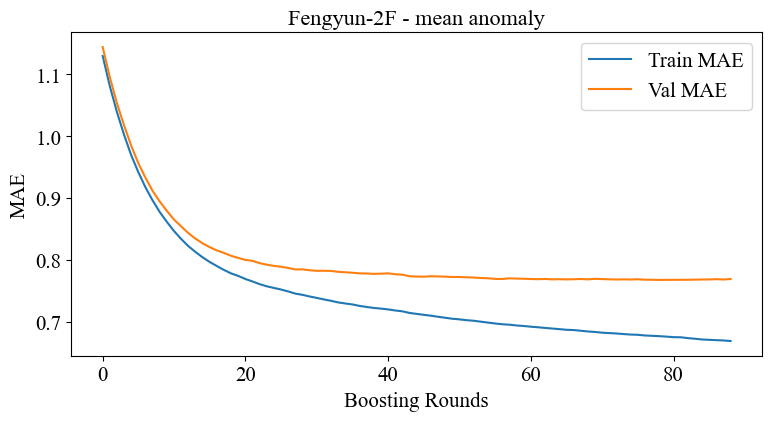

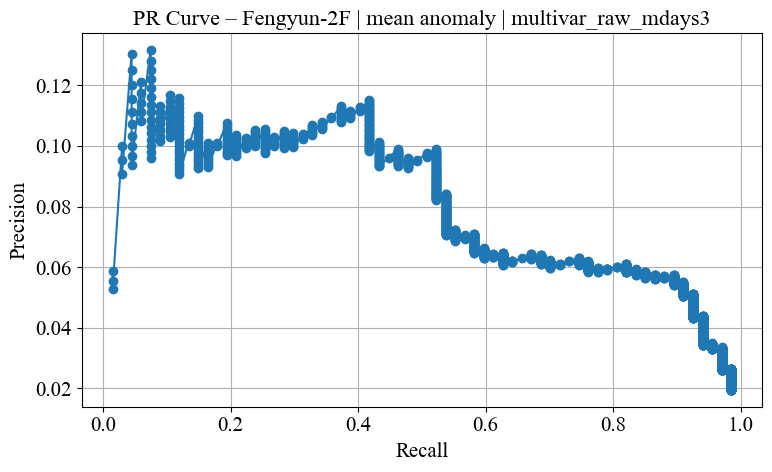

[MULTIVAR_RAW] mdays=3 | Threshold=1.4166 | P=0.10 | R=0.52 | F1=0.17 | F2=0.28
[MULTIVAR_RAW] TP=35, FP=319, FN=32


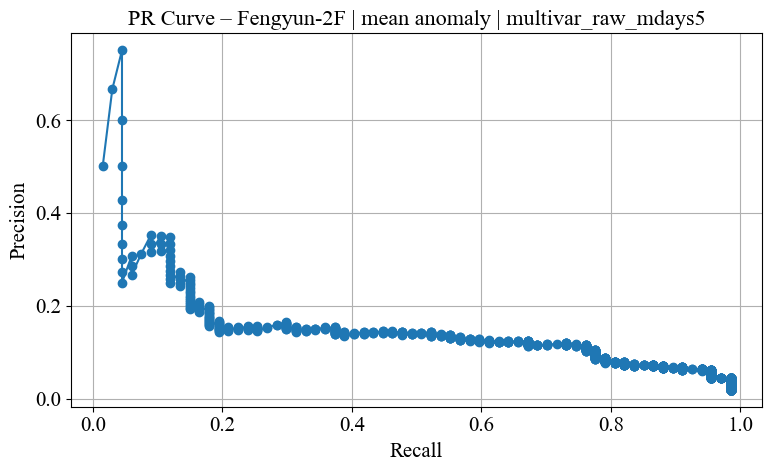

[MULTIVAR_RAW] mdays=5 | Threshold=1.3415 | P=0.12 | R=0.73 | F1=0.21 | F2=0.36
[MULTIVAR_RAW] TP=49, FP=358, FN=18

[MULTIVAR_RAW] Using BEST mdays = ±5 for mean anomaly (F2 = 0.36)


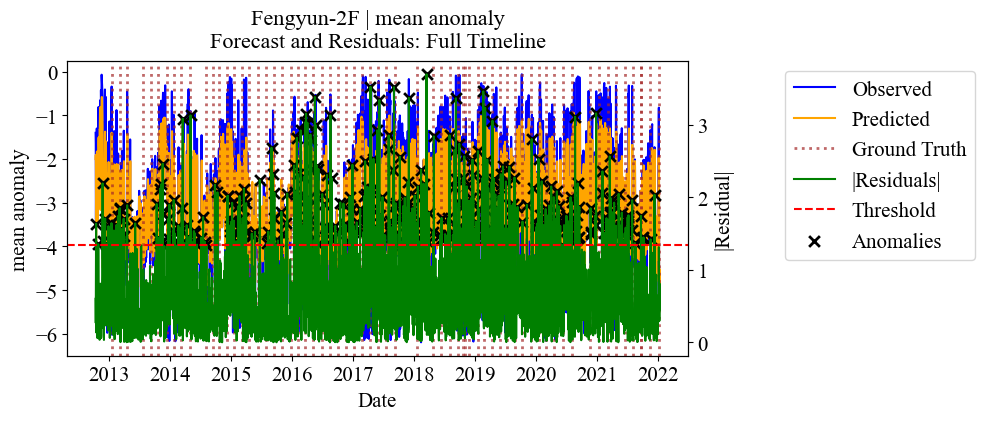

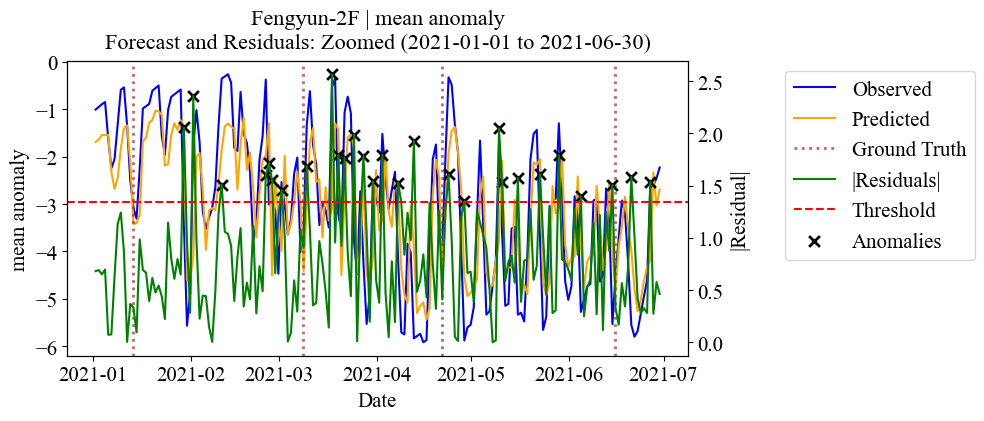


=== MULTIVARIATE: Fengyun-2F | Target = mean anomaly | Mode = multivar_cleaned ===
[MULTIVAR_CLEANED] Best params for Fengyun-2F | mean anomaly: {'max_depth': 3, 'learning_rate': 0.1, 'n_estimators': 100, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 61


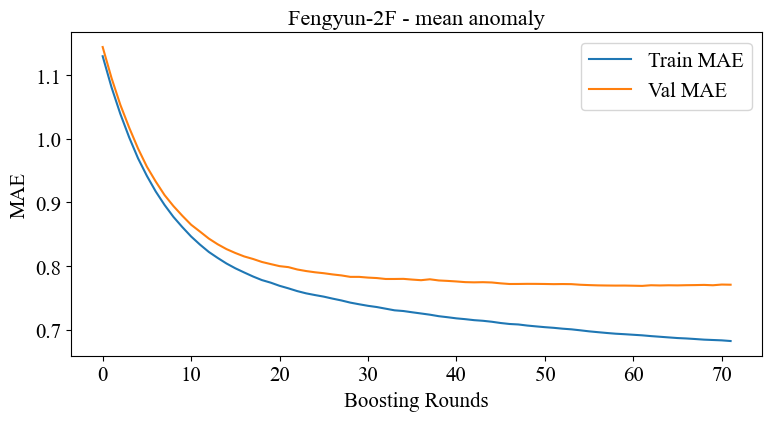

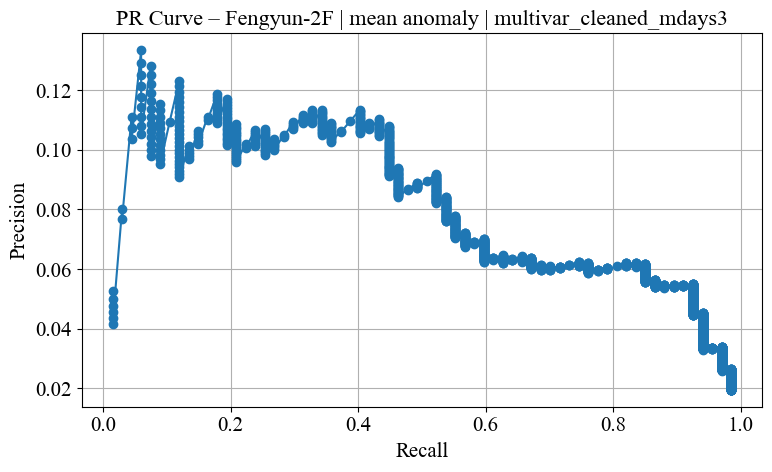

[MULTIVAR_CLEANED] mdays=3 | Threshold=1.5606 | P=0.11 | R=0.45 | F1=0.17 | F2=0.27
[MULTIVAR_CLEANED] TP=30, FP=248, FN=37


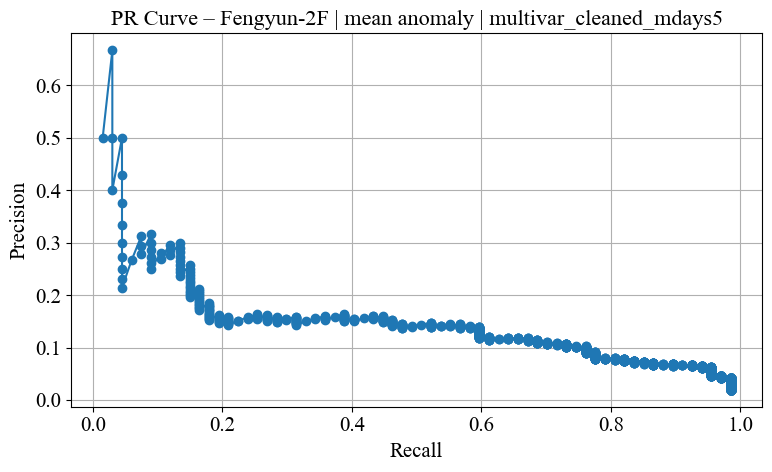

[MULTIVAR_CLEANED] mdays=5 | Threshold=1.5410 | P=0.14 | R=0.60 | F1=0.23 | F2=0.36
[MULTIVAR_CLEANED] TP=40, FP=246, FN=27

[MULTIVAR_CLEANED] Using BEST mdays = ±5 for mean anomaly (F2 = 0.36)


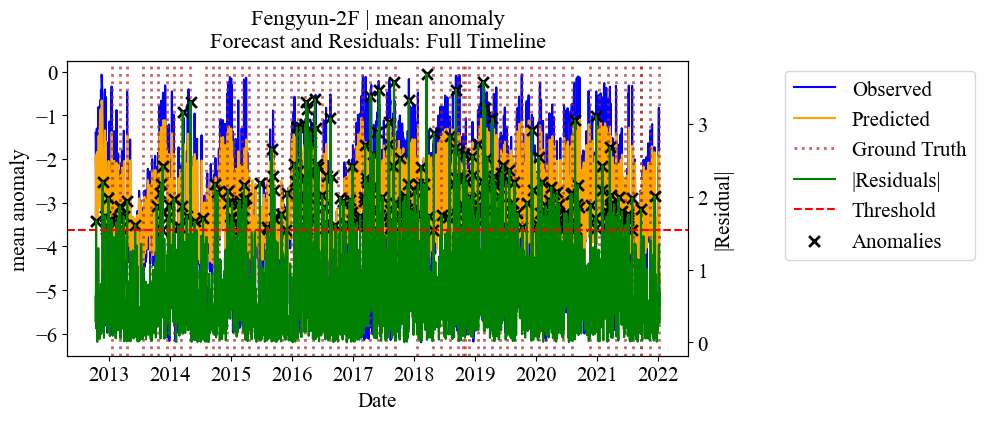

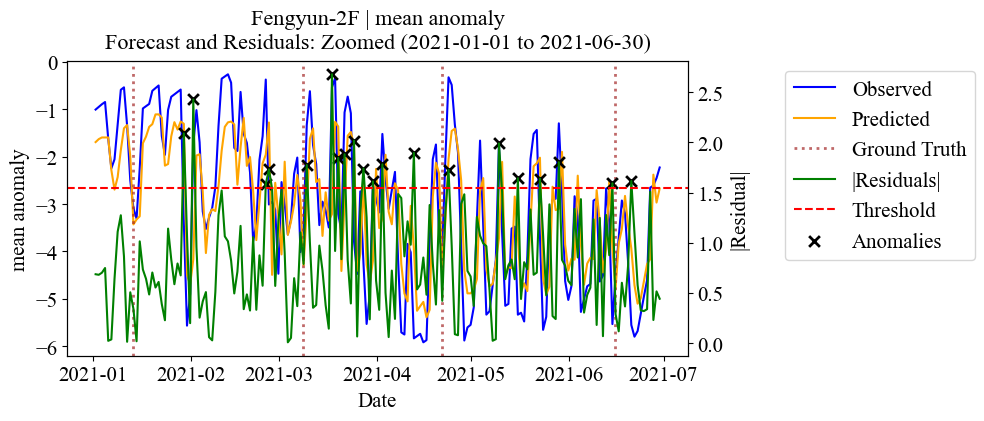


=== MULTIVARIATE: Fengyun-2F | Target = eccentricity | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Fengyun-2F | eccentricity: {'max_depth': 2, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 145


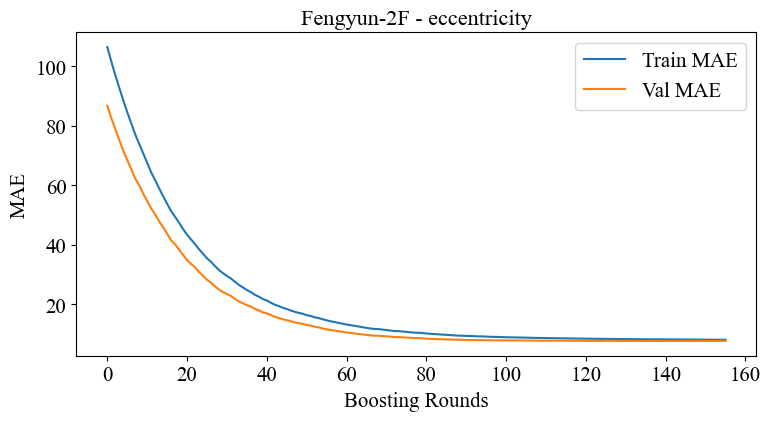

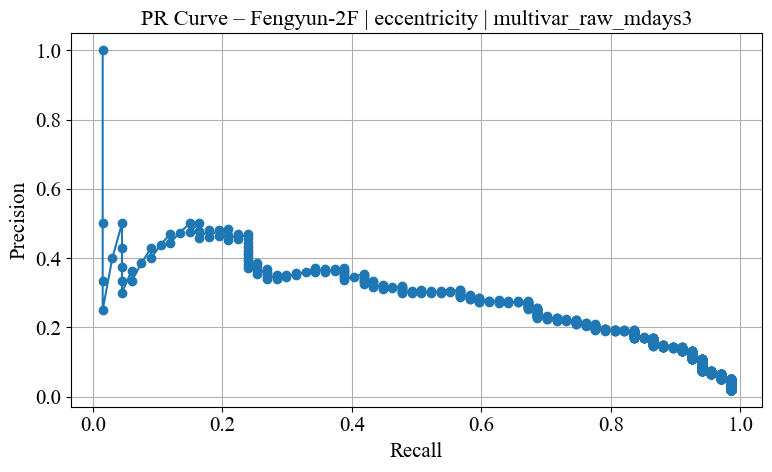

[MULTIVAR_RAW] mdays=3 | Threshold=22.6711 | P=0.28 | R=0.67 | F1=0.39 | F2=0.52
[MULTIVAR_RAW] TP=45, FP=118, FN=22


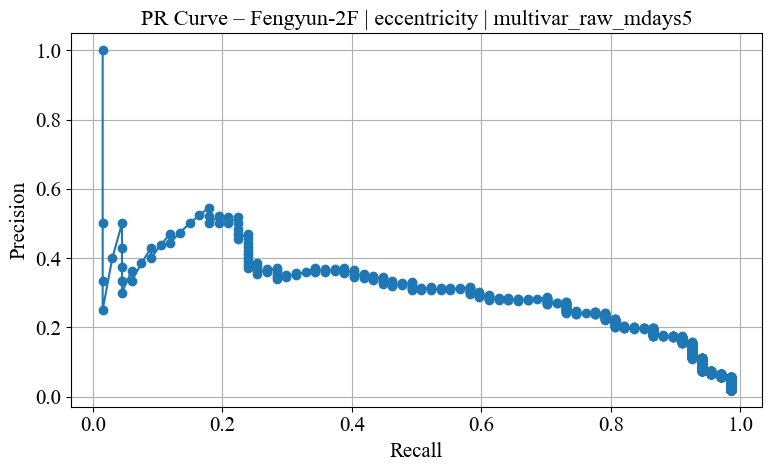

[MULTIVAR_RAW] mdays=5 | Threshold=21.6543 | P=0.27 | R=0.73 | F1=0.40 | F2=0.55
[MULTIVAR_RAW] TP=49, FP=130, FN=18

[MULTIVAR_RAW] Using BEST mdays = ±5 for eccentricity (F2 = 0.55)


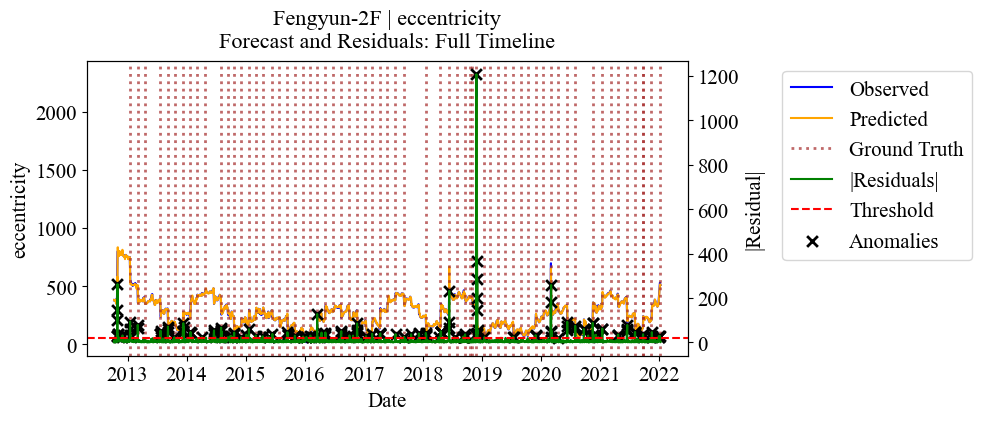

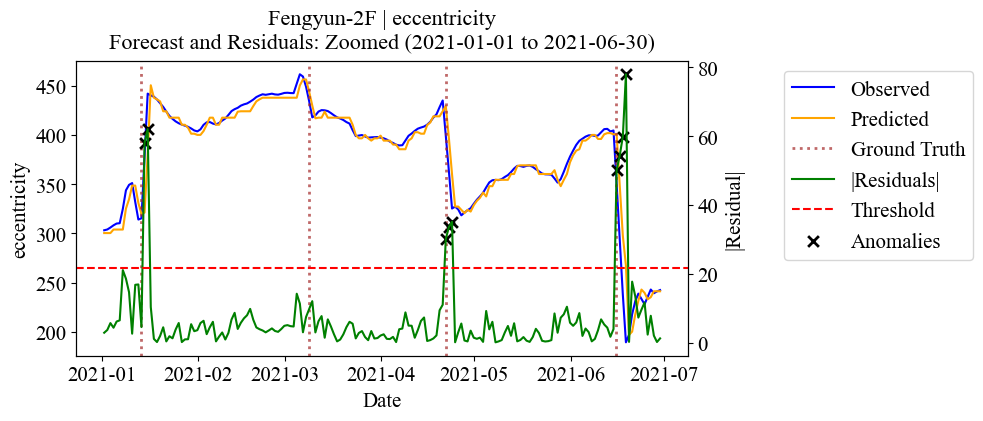


=== MULTIVARIATE: Fengyun-2F | Target = eccentricity | Mode = multivar_cleaned ===
[MULTIVAR_CLEANED] Best params for Fengyun-2F | eccentricity: {'max_depth': 3, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 149


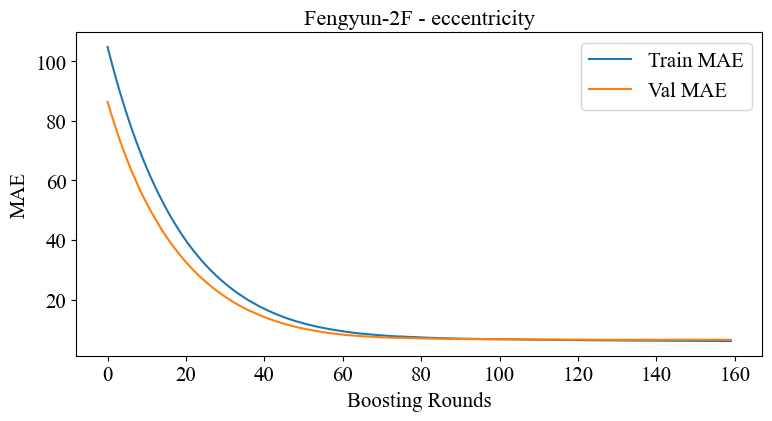

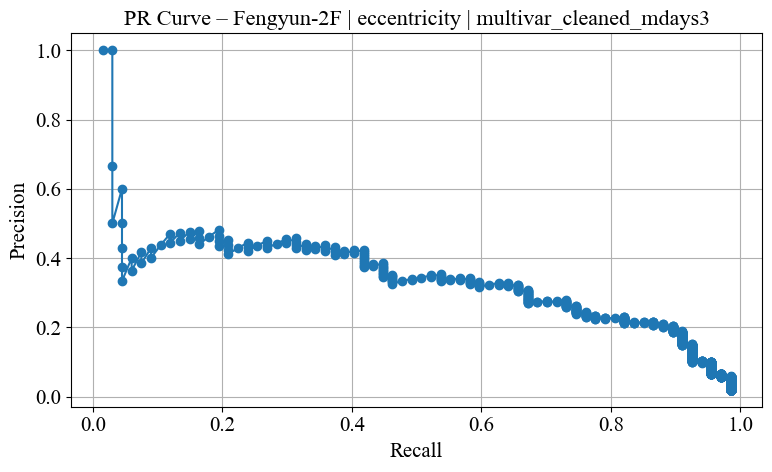

[MULTIVAR_CLEANED] mdays=3 | Threshold=19.3869 | P=0.28 | R=0.73 | F1=0.40 | F2=0.55
[MULTIVAR_CLEANED] TP=49, FP=127, FN=18


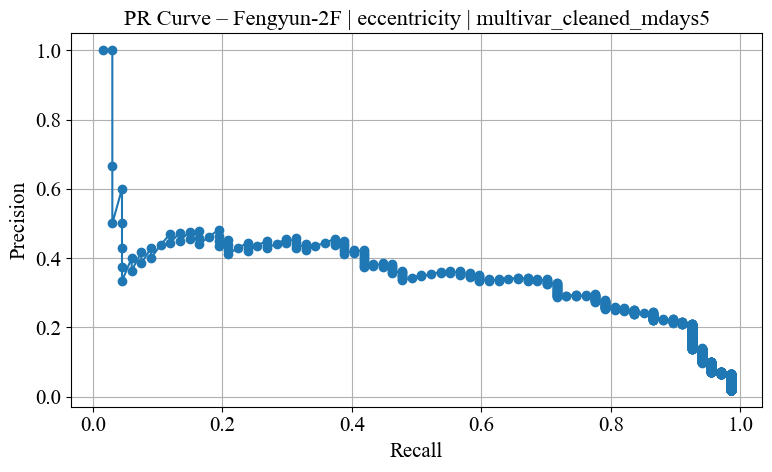

[MULTIVAR_CLEANED] mdays=5 | Threshold=19.3869 | P=0.30 | R=0.78 | F1=0.43 | F2=0.59
[MULTIVAR_CLEANED] TP=52, FP=124, FN=15

[MULTIVAR_CLEANED] Using BEST mdays = ±5 for eccentricity (F2 = 0.59)


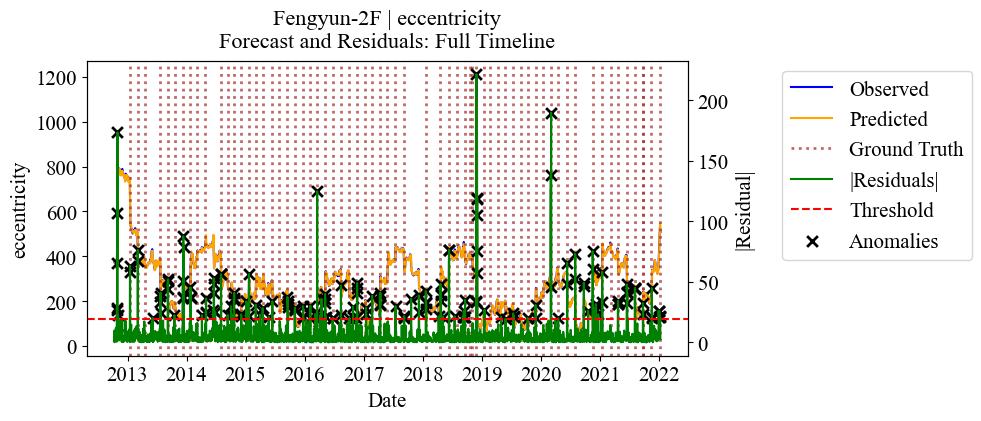

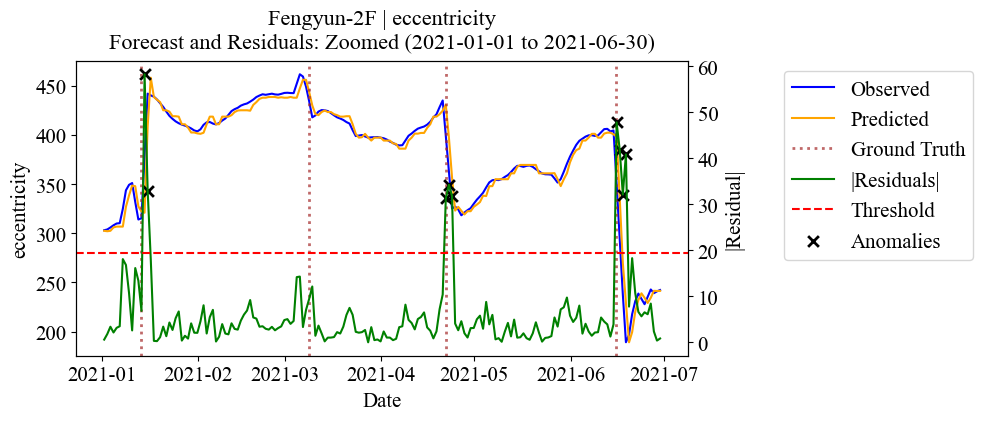

Rescaled Brouwer mean motion ×1e6
Rescaled eccentricity ×1e6

=== MULTIVARIATE: Fengyun-4A | Target = Brouwer mean motion | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Fengyun-4A | Brouwer mean motion: {'max_depth': 3, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 0.8, 'subsample': 0.8, 'random_state': 42}, Best iter: 115


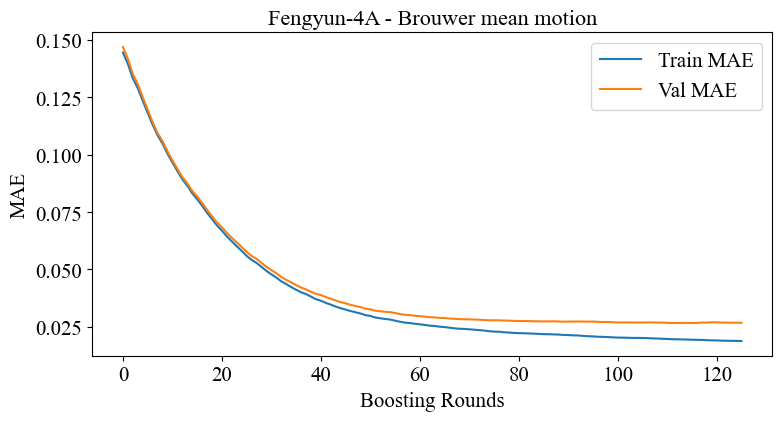

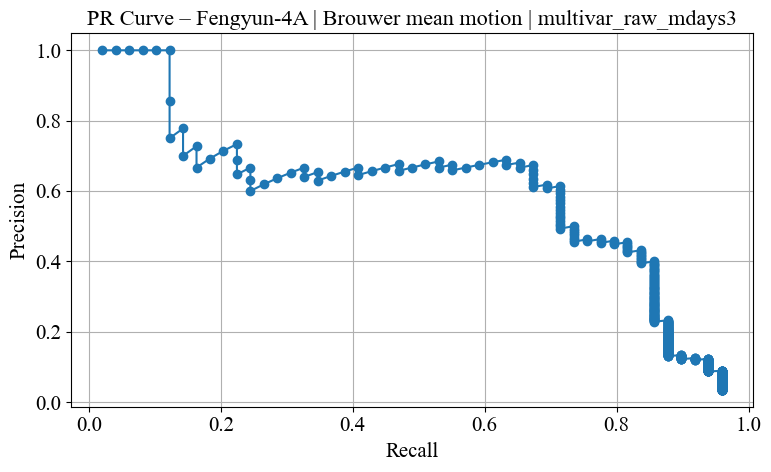

[MULTIVAR_RAW] mdays=3 | Threshold=0.0581 | P=0.43 | R=0.84 | F1=0.57 | F2=0.70
[MULTIVAR_RAW] TP=41, FP=54, FN=8


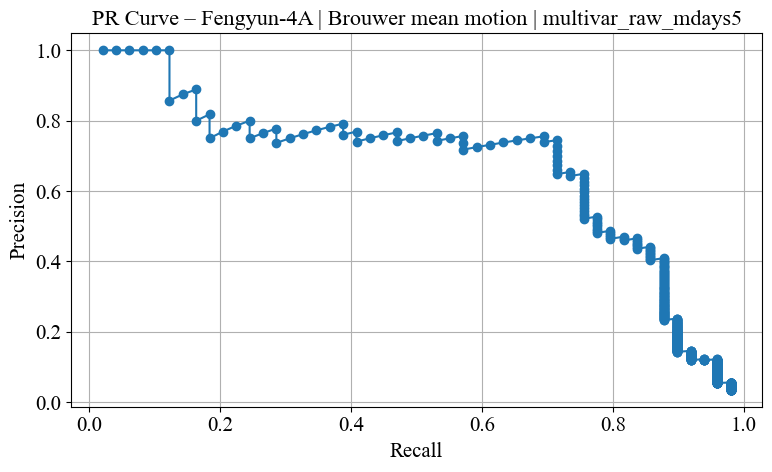

[MULTIVAR_RAW] mdays=5 | Threshold=0.0763 | P=0.65 | R=0.76 | F1=0.70 | F2=0.73
[MULTIVAR_RAW] TP=37, FP=20, FN=12

[MULTIVAR_RAW] Using BEST mdays = ±5 for Brouwer mean motion (F2 = 0.73)


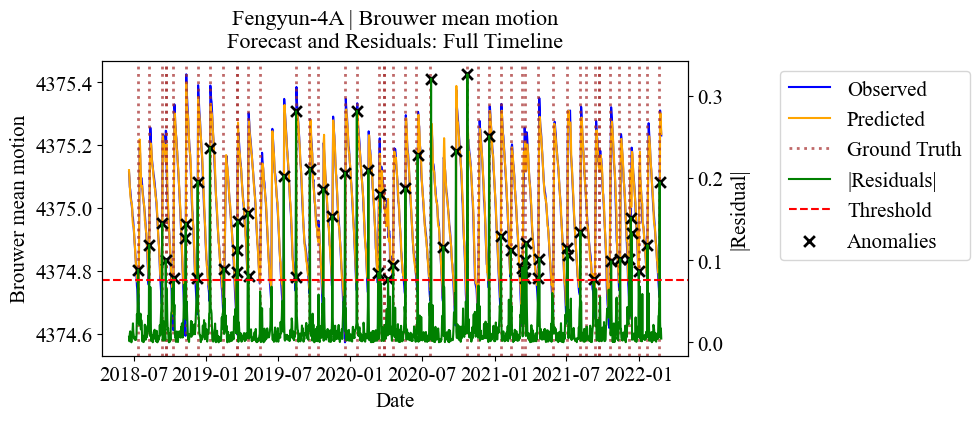

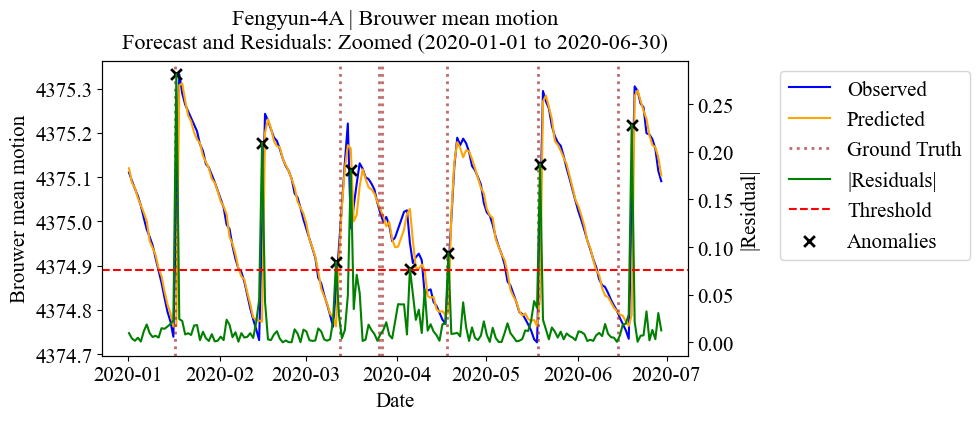


=== MULTIVARIATE: Fengyun-4A | Target = mean anomaly | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Fengyun-4A | mean anomaly: {'max_depth': 2, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 100


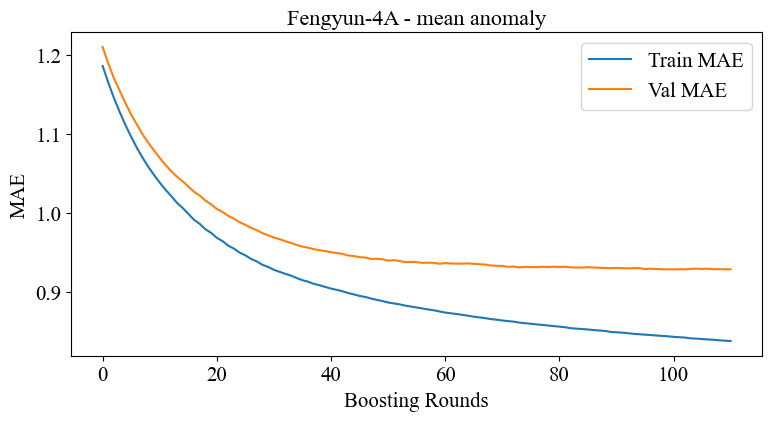

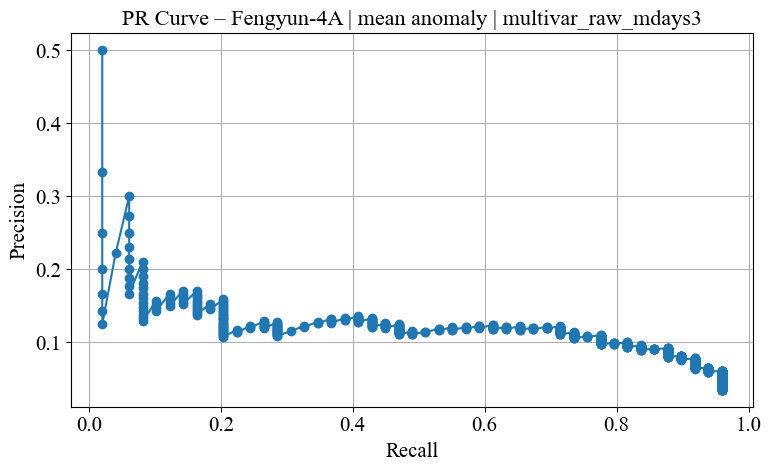

[MULTIVAR_RAW] mdays=3 | Threshold=1.3005 | P=0.12 | R=0.71 | F1=0.21 | F2=0.36
[MULTIVAR_RAW] TP=35, FP=252, FN=14


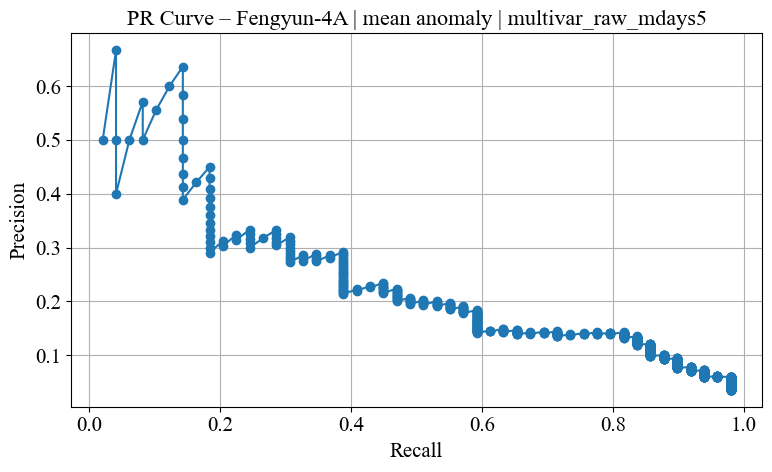

[MULTIVAR_RAW] mdays=5 | Threshold=1.3085 | P=0.14 | R=0.82 | F1=0.24 | F2=0.42
[MULTIVAR_RAW] TP=40, FP=241, FN=9

[MULTIVAR_RAW] Using BEST mdays = ±5 for mean anomaly (F2 = 0.42)


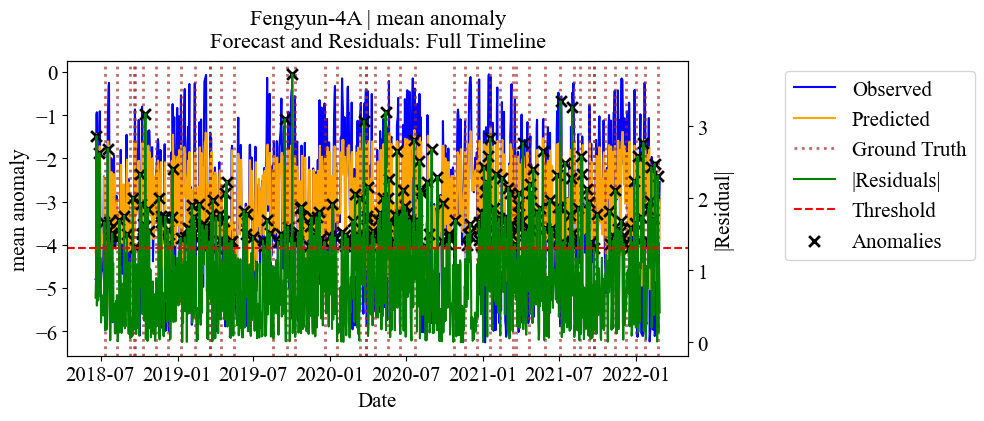

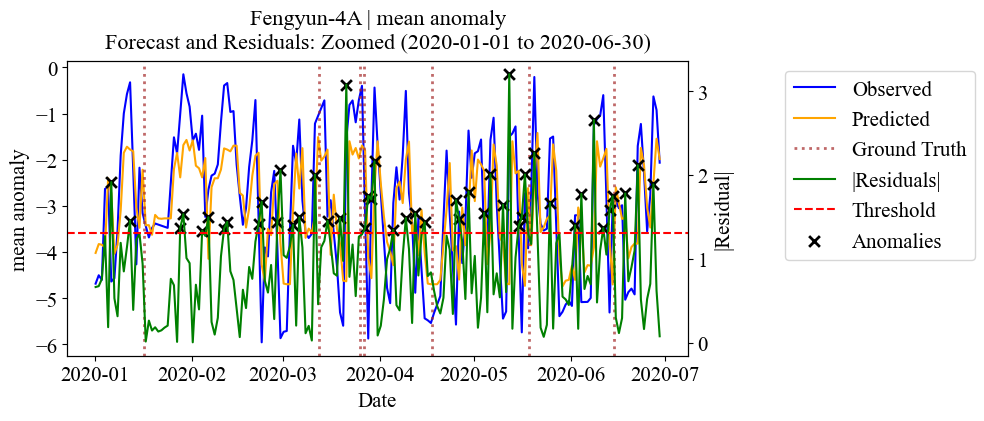


=== MULTIVARIATE: Fengyun-4A | Target = eccentricity | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Fengyun-4A | eccentricity: {'max_depth': 3, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 158


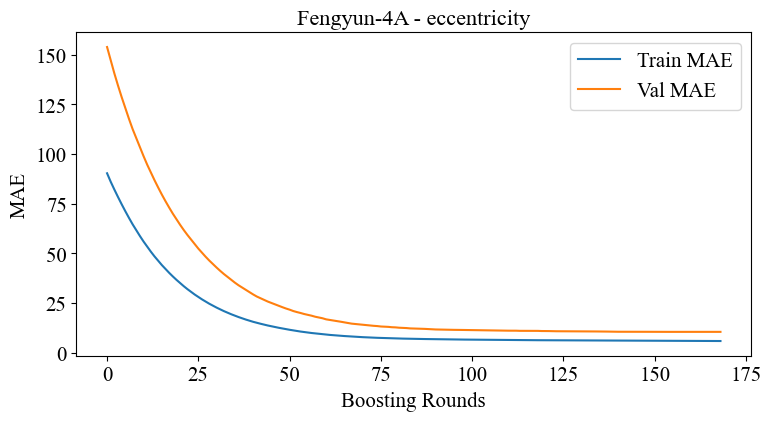

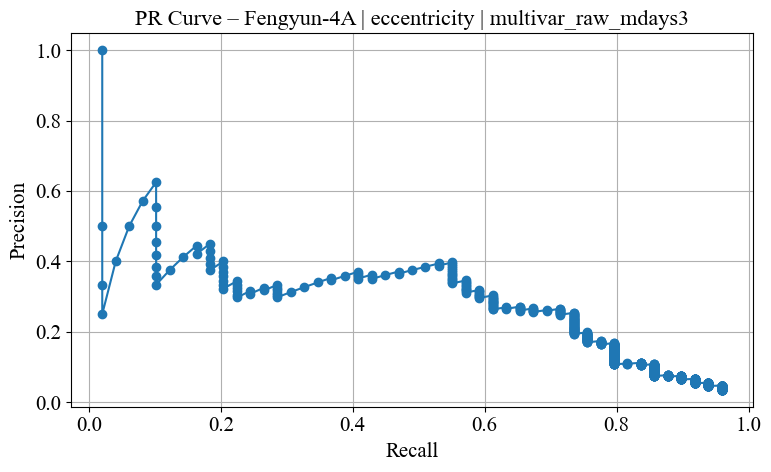

[MULTIVAR_RAW] mdays=3 | Threshold=12.7321 | P=0.27 | R=0.71 | F1=0.39 | F2=0.53
[MULTIVAR_RAW] TP=35, FP=97, FN=14


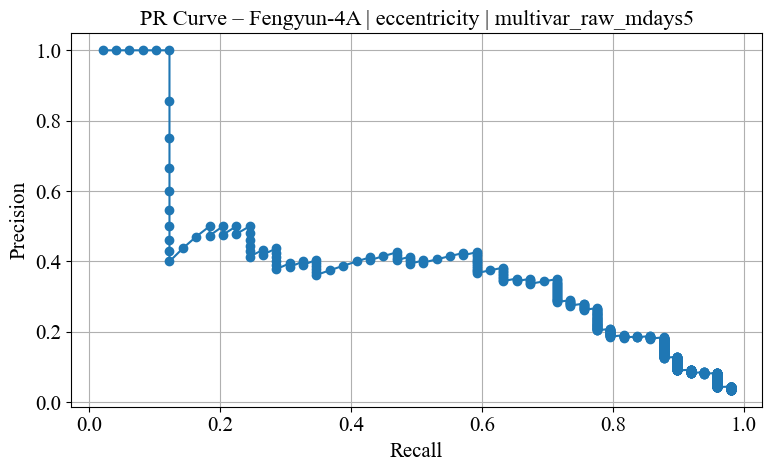

[MULTIVAR_RAW] mdays=5 | Threshold=14.4536 | P=0.35 | R=0.71 | F1=0.47 | F2=0.59
[MULTIVAR_RAW] TP=35, FP=65, FN=14

[MULTIVAR_RAW] Using BEST mdays = ±5 for eccentricity (F2 = 0.59)


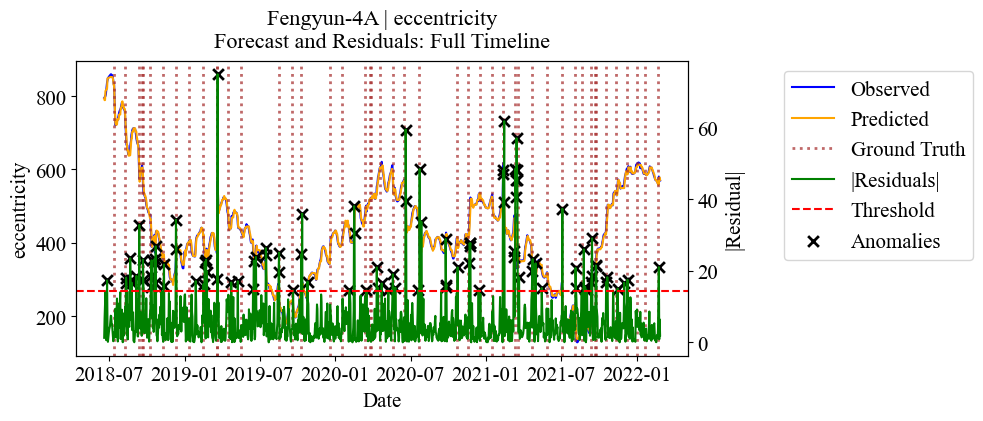

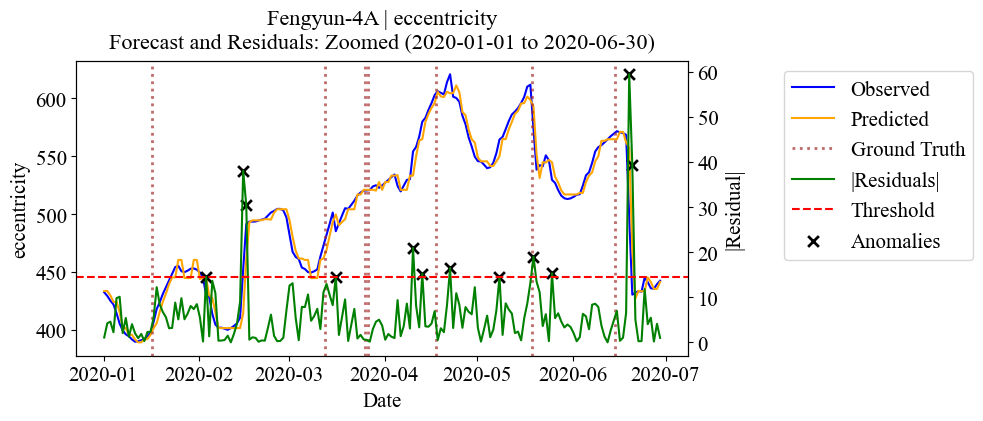

Rescaled Brouwer mean motion ×1e6
Rescaled eccentricity ×1e6

=== MULTIVARIATE: SARAL | Target = Brouwer mean motion | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for SARAL | Brouwer mean motion: {'max_depth': 4, 'learning_rate': 0.03, 'n_estimators': 400, 'colsample_bytree': 0.7, 'subsample': 0.8, 'random_state': 42}, Best iter: 0


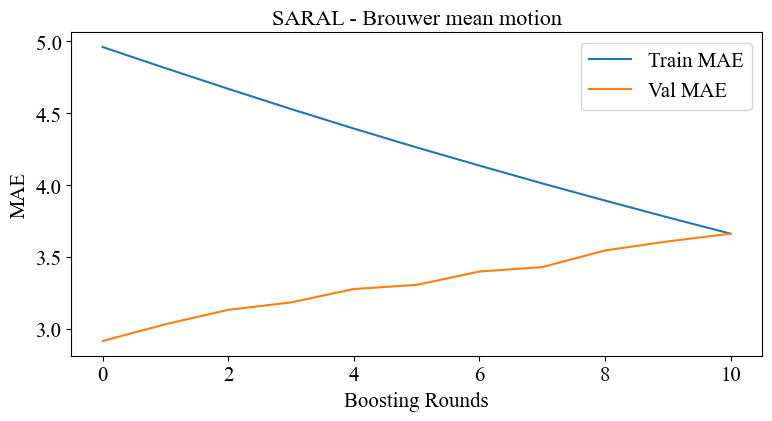

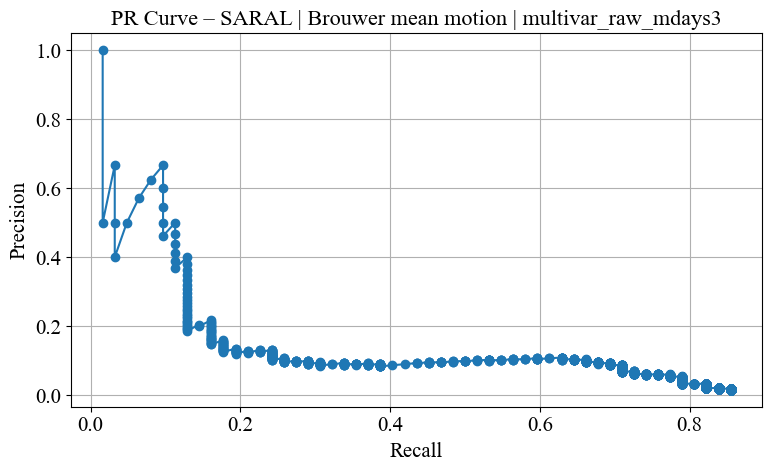

[MULTIVAR_RAW] mdays=3 | Threshold=6.4927 | P=0.11 | R=0.63 | F1=0.19 | F2=0.32
[MULTIVAR_RAW] TP=39, FP=319, FN=23


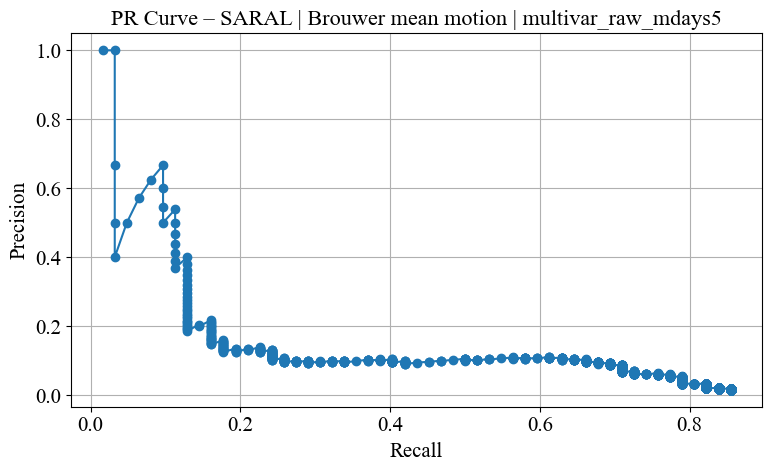

[MULTIVAR_RAW] mdays=5 | Threshold=6.4927 | P=0.11 | R=0.63 | F1=0.19 | F2=0.32
[MULTIVAR_RAW] TP=39, FP=319, FN=23

[MULTIVAR_RAW] Using BEST mdays = ±3 for Brouwer mean motion (F2 = 0.32)


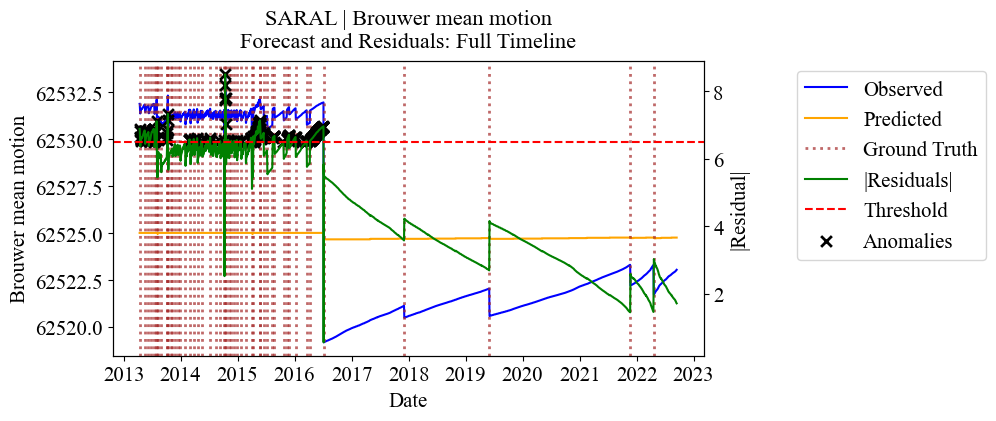

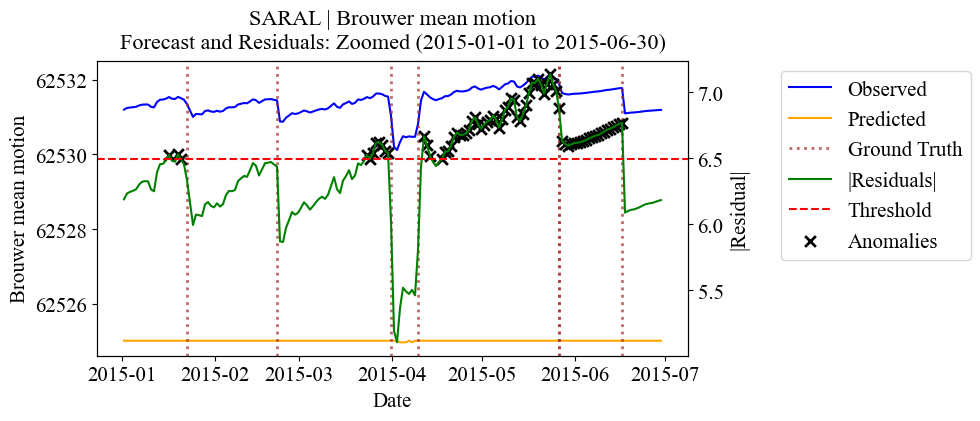


=== MULTIVARIATE: SARAL | Target = mean anomaly | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for SARAL | mean anomaly: {'max_depth': 4, 'learning_rate': 0.03, 'n_estimators': 400, 'colsample_bytree': 0.7, 'subsample': 0.8, 'random_state': 42}, Best iter: 202


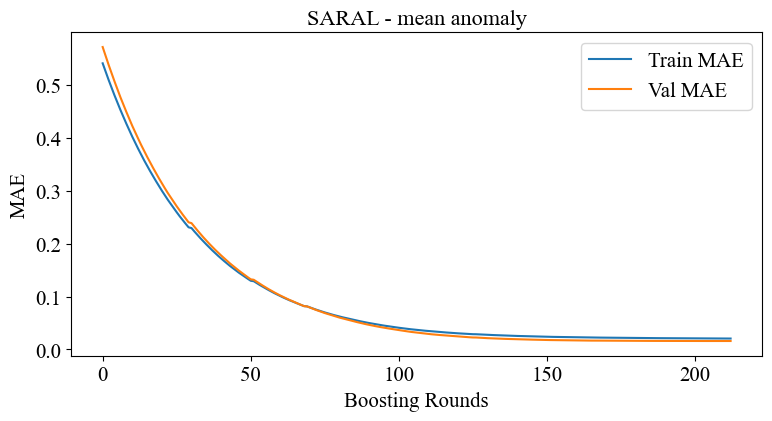

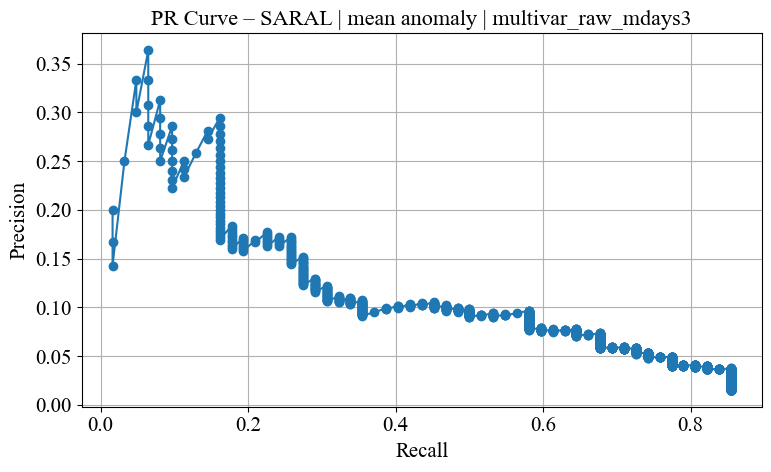

[MULTIVAR_RAW] mdays=3 | Threshold=0.0419 | P=0.10 | R=0.58 | F1=0.17 | F2=0.29
[MULTIVAR_RAW] TP=36, FP=337, FN=26


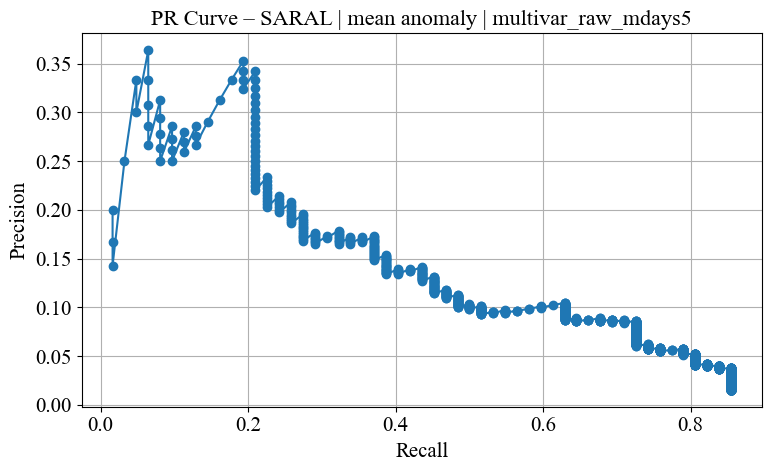

[MULTIVAR_RAW] mdays=5 | Threshold=0.0419 | P=0.10 | R=0.63 | F1=0.18 | F2=0.31
[MULTIVAR_RAW] TP=39, FP=334, FN=23

[MULTIVAR_RAW] Using BEST mdays = ±5 for mean anomaly (F2 = 0.31)


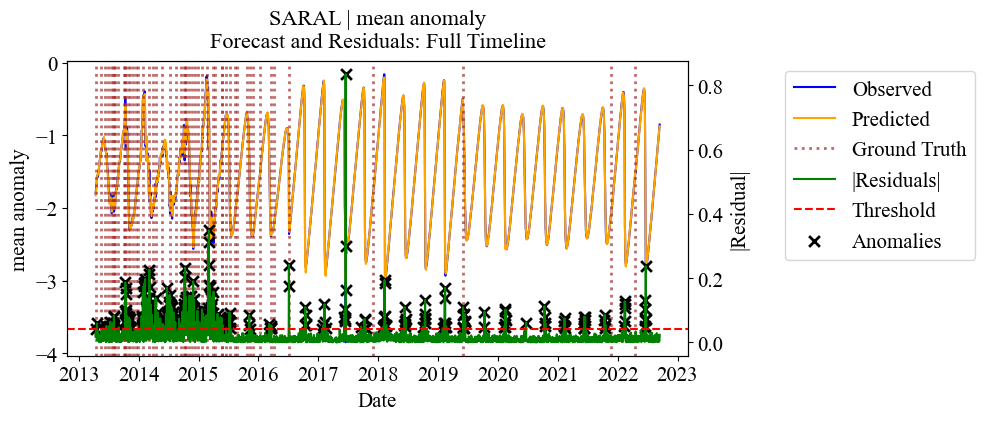

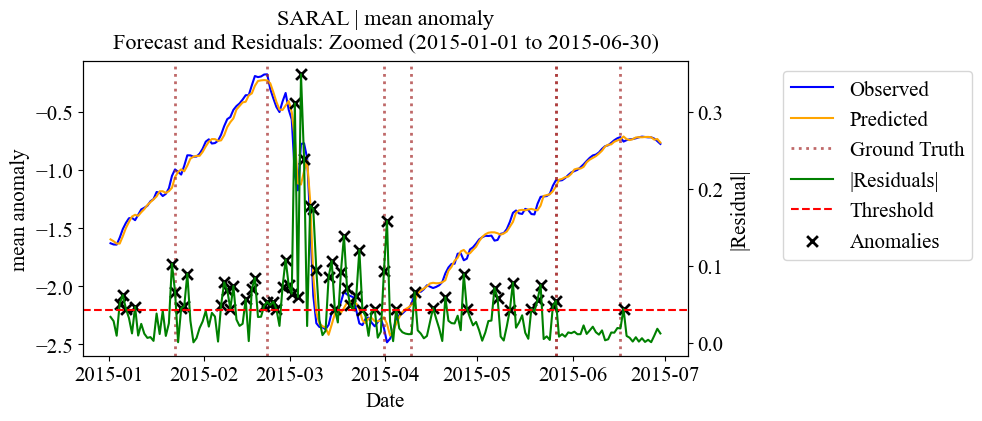


=== MULTIVARIATE: SARAL | Target = eccentricity | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for SARAL | eccentricity: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 110


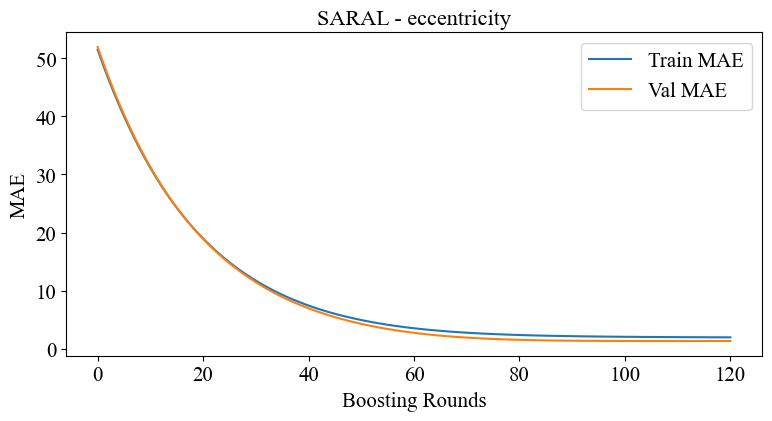

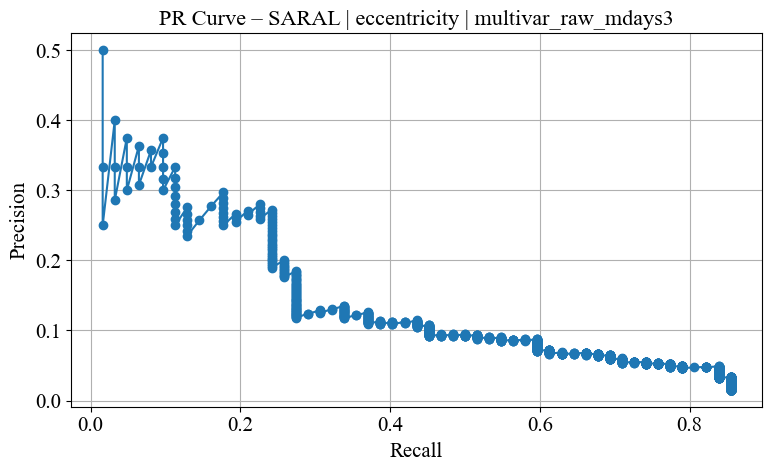

[MULTIVAR_RAW] mdays=3 | Threshold=4.9968 | P=0.11 | R=0.44 | F1=0.18 | F2=0.28
[MULTIVAR_RAW] TP=27, FP=209, FN=35


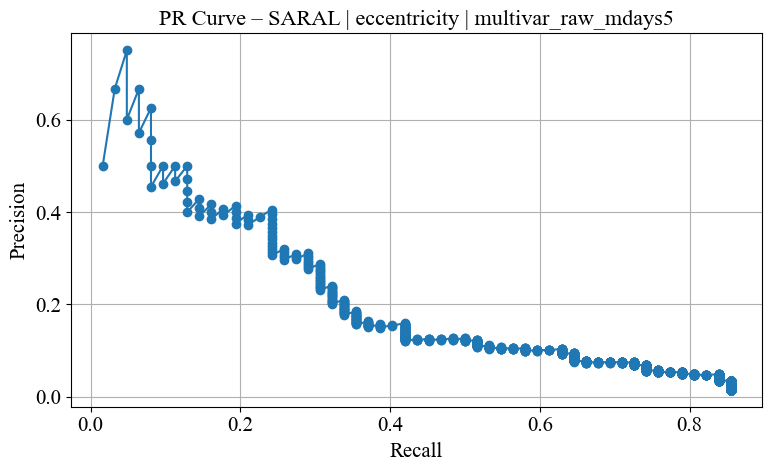

[MULTIVAR_RAW] mdays=5 | Threshold=6.3642 | P=0.16 | R=0.42 | F1=0.23 | F2=0.32
[MULTIVAR_RAW] TP=26, FP=137, FN=36

[MULTIVAR_RAW] Using BEST mdays = ±5 for eccentricity (F2 = 0.32)


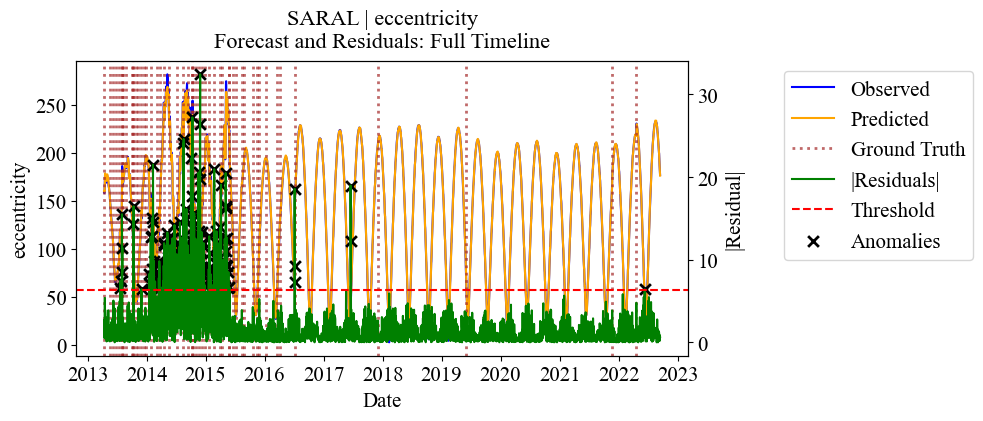

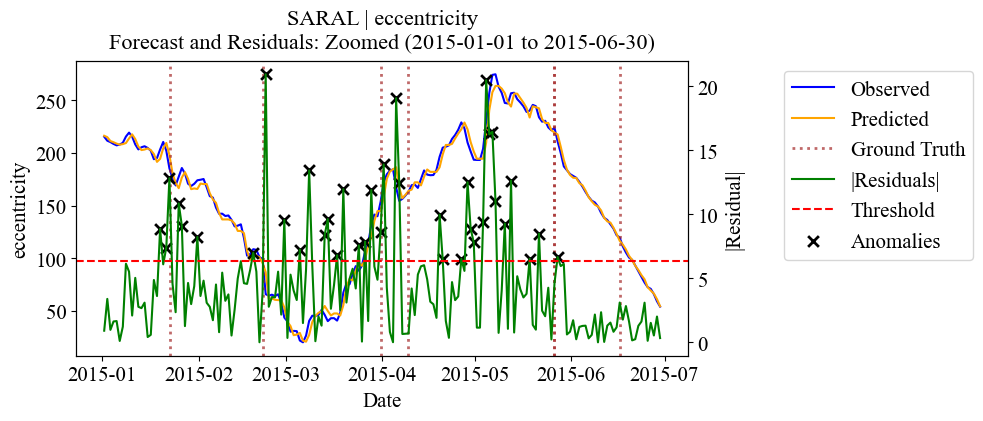

Rescaled Brouwer mean motion ×1e6
Rescaled eccentricity ×1e6

=== MULTIVARIATE: Haiyang-2A | Target = Brouwer mean motion | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Haiyang-2A | Brouwer mean motion: {'max_depth': 3, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 109


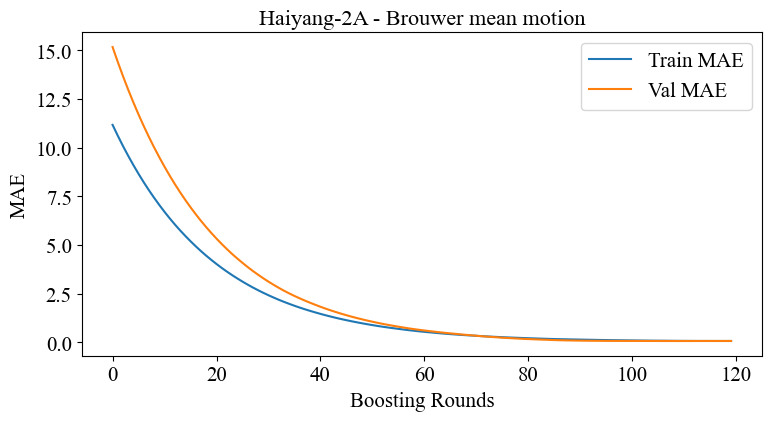

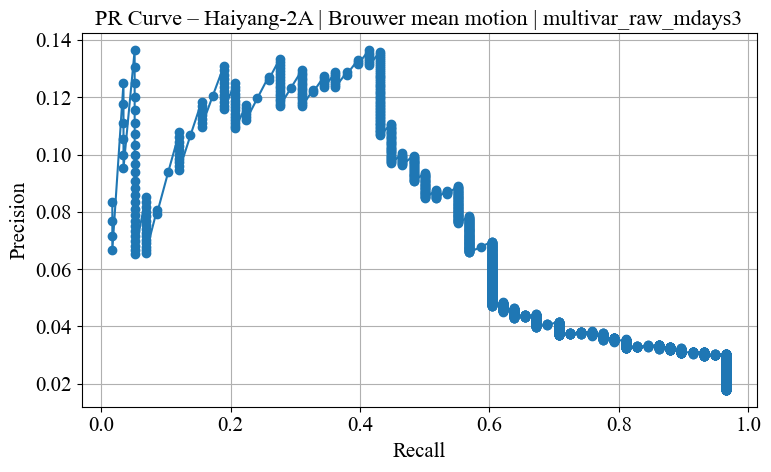

[MULTIVAR_RAW] mdays=3 | Threshold=0.1308 | P=0.14 | R=0.43 | F1=0.21 | F2=0.30
[MULTIVAR_RAW] TP=25, FP=159, FN=33


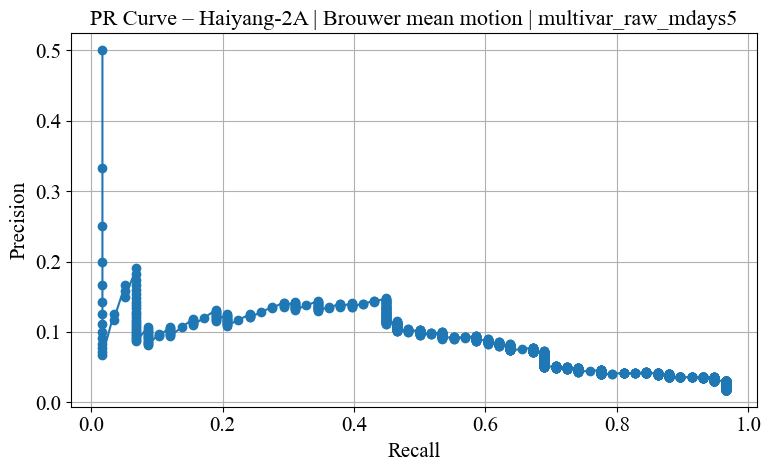

[MULTIVAR_RAW] mdays=5 | Threshold=0.1361 | P=0.15 | R=0.45 | F1=0.22 | F2=0.32
[MULTIVAR_RAW] TP=26, FP=150, FN=32

[MULTIVAR_RAW] Using BEST mdays = ±5 for Brouwer mean motion (F2 = 0.32)


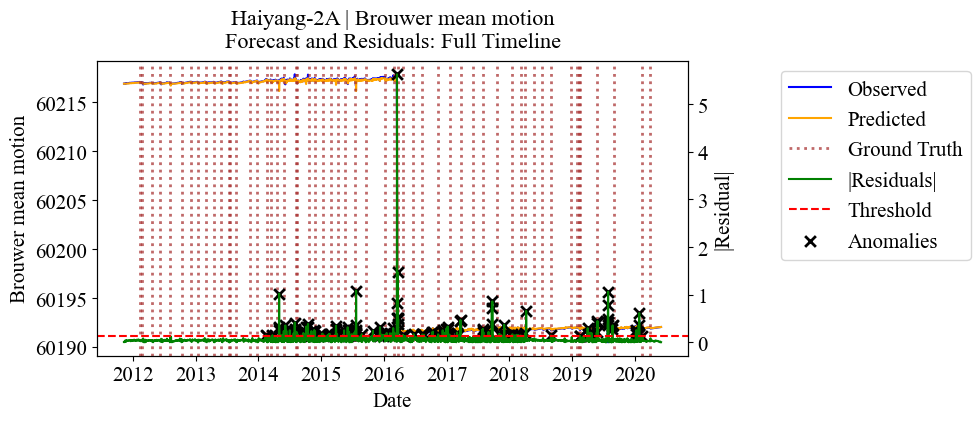

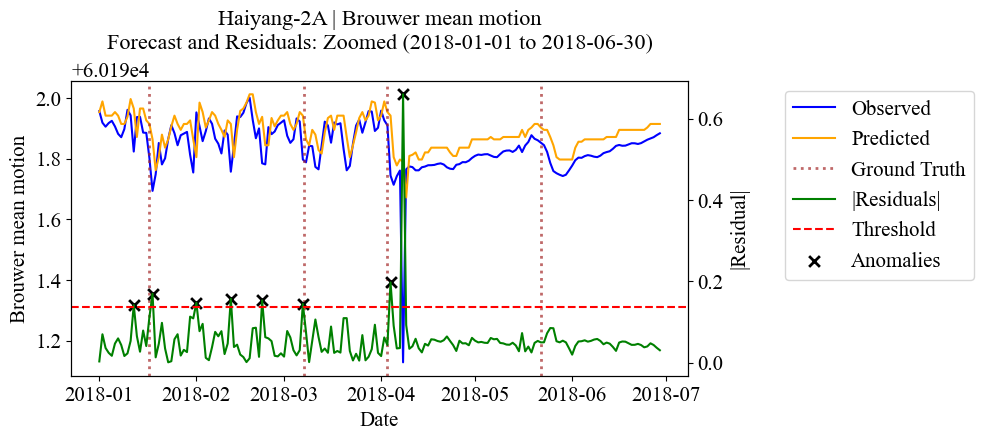


=== MULTIVARIATE: Haiyang-2A | Target = mean anomaly | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Haiyang-2A | mean anomaly: {'max_depth': 4, 'learning_rate': 0.05, 'n_estimators': 300, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 149


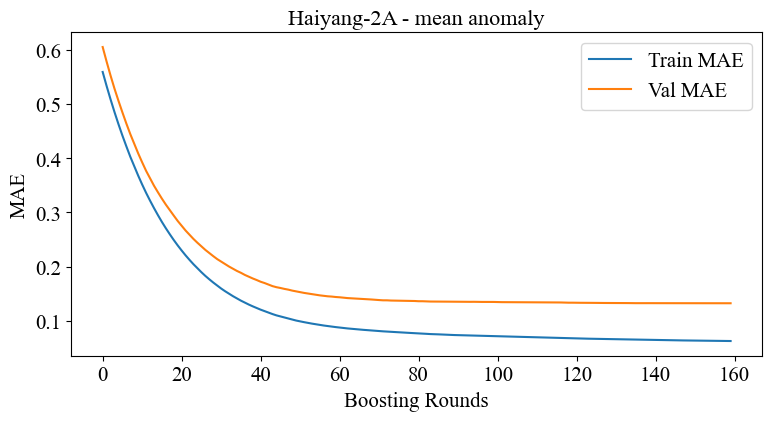

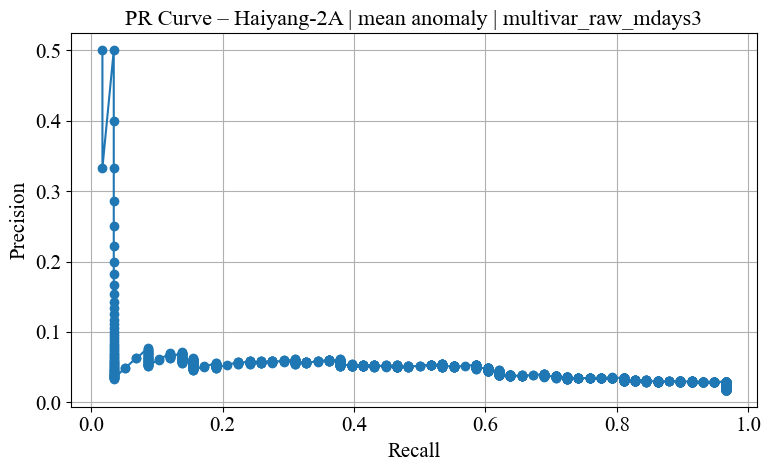

[MULTIVAR_RAW] mdays=3 | Threshold=0.0889 | P=0.05 | R=0.59 | F1=0.10 | F2=0.20
[MULTIVAR_RAW] TP=34, FP=603, FN=24


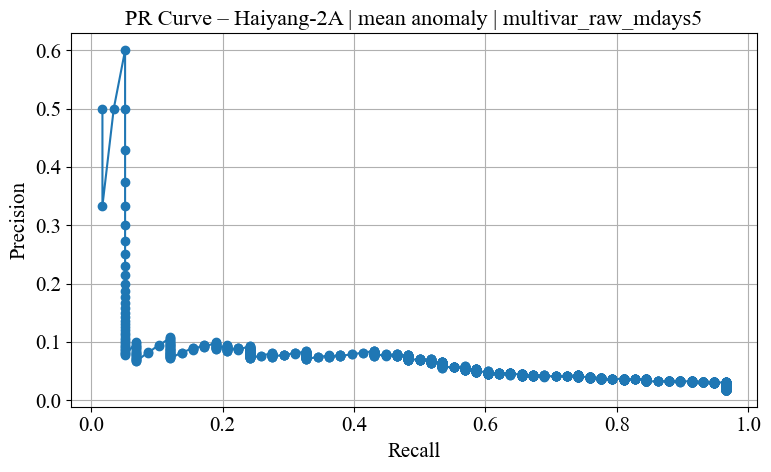

[MULTIVAR_RAW] mdays=5 | Threshold=0.1612 | P=0.08 | R=0.43 | F1=0.14 | F2=0.24
[MULTIVAR_RAW] TP=25, FP=271, FN=33

[MULTIVAR_RAW] Using BEST mdays = ±5 for mean anomaly (F2 = 0.24)


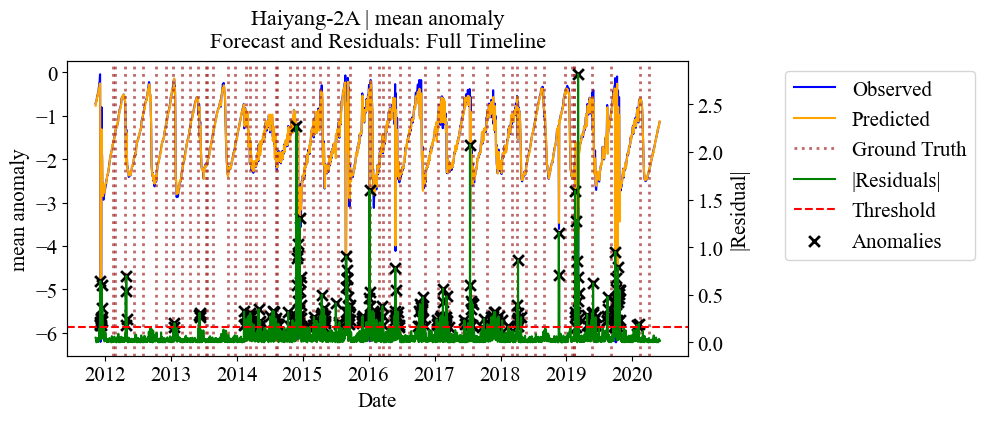

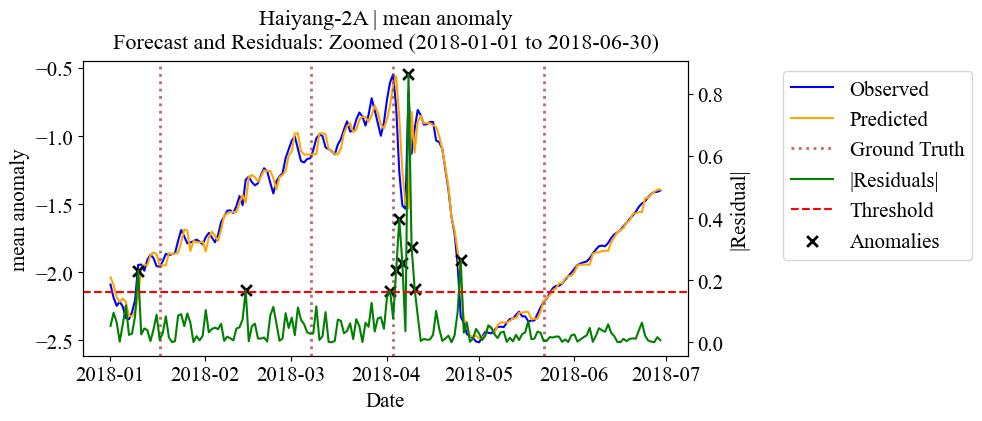


=== MULTIVARIATE: Haiyang-2A | Target = eccentricity | Mode = multivar_raw ===
[MULTIVAR_RAW] Best params for Haiyang-2A | eccentricity: {'max_depth': 2, 'learning_rate': 0.05, 'n_estimators': 200, 'colsample_bytree': 1.0, 'subsample': 1.0, 'random_state': 42}, Best iter: 162


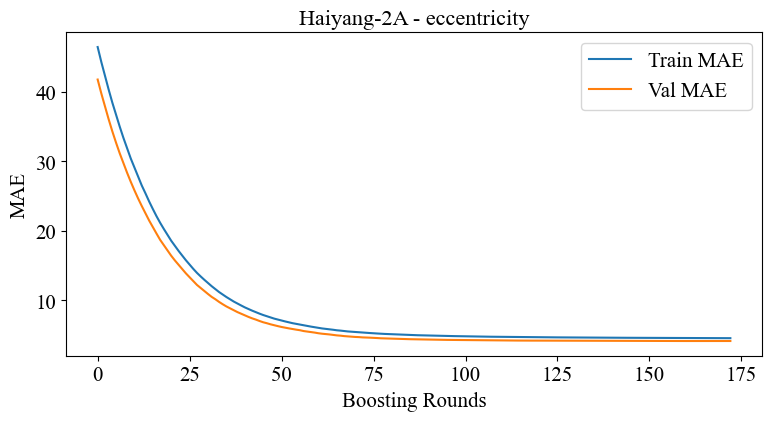

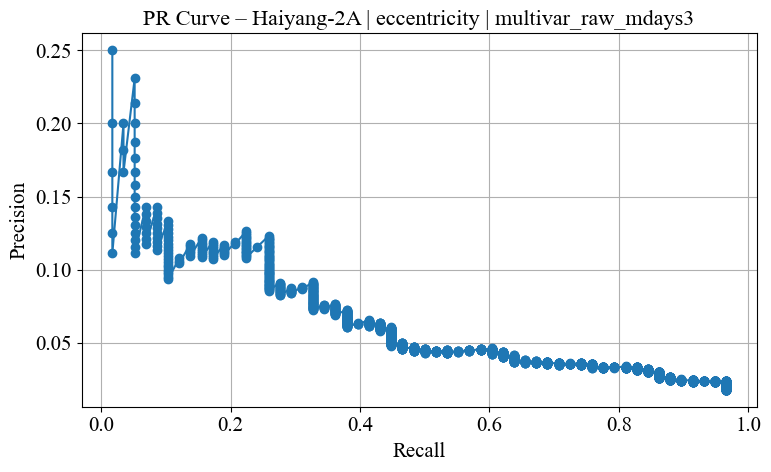

[MULTIVAR_RAW] mdays=3 | Threshold=13.0148 | P=0.09 | R=0.33 | F1=0.14 | F2=0.22
[MULTIVAR_RAW] TP=19, FP=189, FN=39


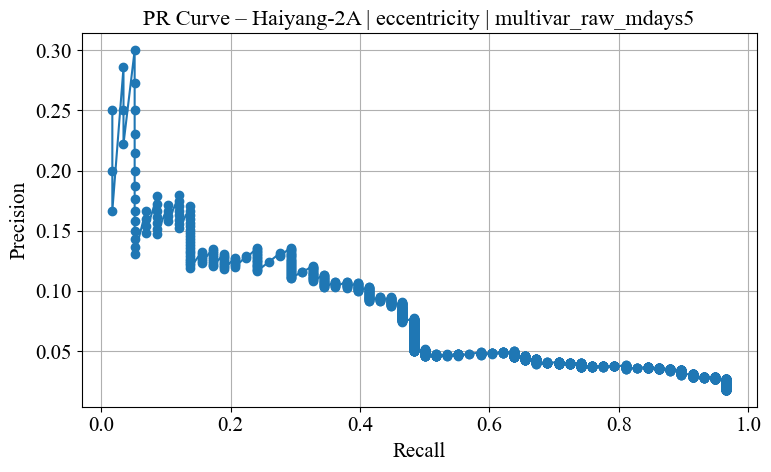

[MULTIVAR_RAW] mdays=5 | Threshold=12.3613 | P=0.10 | R=0.41 | F1=0.17 | F2=0.26
[MULTIVAR_RAW] TP=24, FP=208, FN=34

[MULTIVAR_RAW] Using BEST mdays = ±5 for eccentricity (F2 = 0.26)


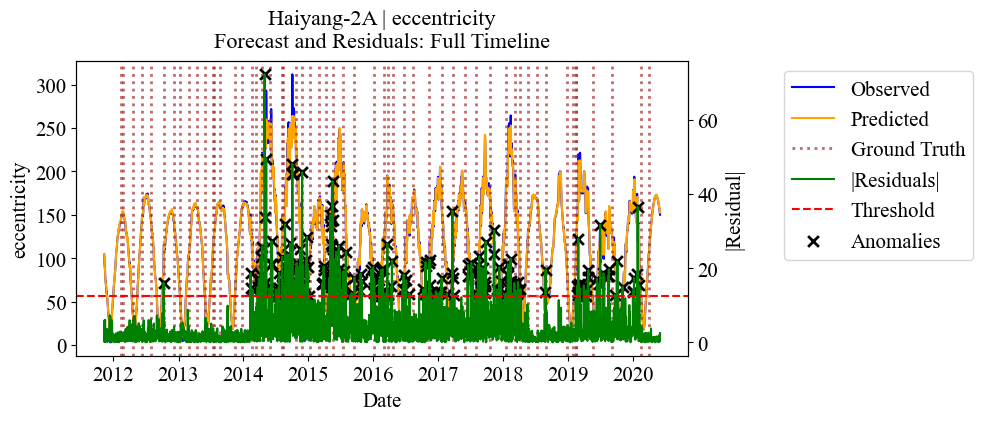

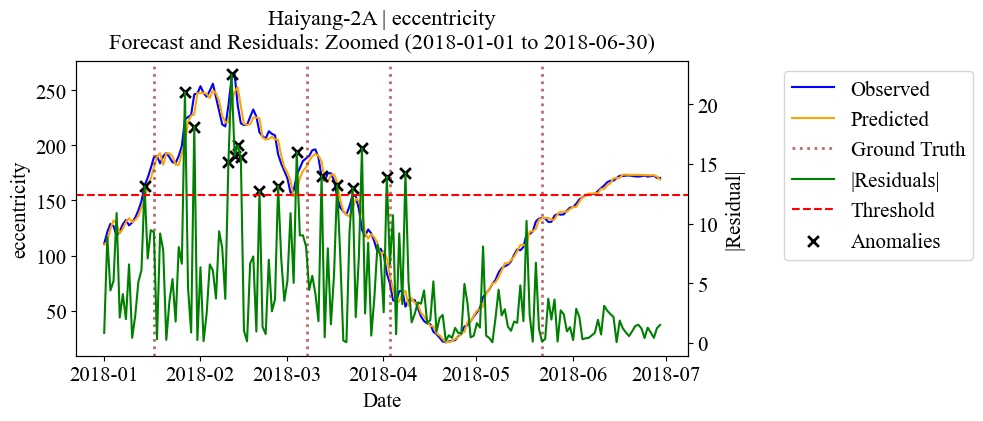

In [3]:
# === Multivraite loop ===

for sat in satellites:
    name = sat["name"]
    df = pd.read_csv(sat["csv_path"], parse_dates=[0], index_col=0)
    man_df = pd.read_csv(sat["maneuver_csv"], parse_dates=["start_time"])
    date_range = tuple(pd.to_datetime(d) for d in sat["date_range"])
    gt_times = man_df["start_time"]

    fxt.run_multivariate_forecasting(
        df=df,
        satellite=name,
        maneuver_times=gt_times,
        input_features=features_to_forecast,
        target_features=multivariate_targets,
        date_range=date_range,
        num_lags=NUM_LAGS,
        matching_days_list=MATCHING_DAYS_LIST,
        output_dirs={
            "forecast": forecast_dir,
            "residual": residual_dir,
            "curve": curve_dir,
            "log": log_dir
        },
        hyperparam_grid=hyperparam_grid
    )
